# Norman

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import rapids_singlecell as rsc
import numpy as np
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

print(f"CUDA used: {torch.cuda.is_available()}")

CUDA used: True


In [3]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [4]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    adata_file_path = os.path.join(tardis.config.io_directories["processed"], "cpa_Norman2019_prep_new.h5ad")
    assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
    adata = ad.read_h5ad(adata_file_path)
    adata.X = adata.layers["counts"].copy()
    del adata.layers
    gc.collect()
adata

AnnData object with n_obs × n_vars = 108497 × 5000
    obs: 'cov_drug_dose_name', 'dose_val', 'control', 'condition', 'guide_identity', 'drug_dose_name', 'cell_type', 'split', 'split1', 'split2', 'split3', 'split4', 'split5', 'split6', 'split7', 'split8', 'split9', 'split10', 'split11', 'split12', 'split13', 'split14', 'split15', 'split16', 'split17', 'split18', 'split19', 'split20', 'split21', 'split22', 'split23', 'split24', 'split25'
    var: 'gene_symbols', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'rank_genes_groups_cov'

## Train

In [5]:
warmup_epoch_range = [6, 48]
dtc_w1 = 25
dtc_w2 = 2.5

counteractive_minibatch_settings = dict(
    method = "categorical_random",
    method_kwargs = dict(
        within_labels = False,
        within_batch = False,
        within_categorical_covs = None,
        seed = "forward",
    )
)

disentenglement_targets_configurations=[
    dict(
        obs_key = "condition",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    )
]

In [6]:
n_epochs_kl_warmup = 600

model_params = dict(
    n_hidden=512,
    n_layers=3, 
    n_latent=(12 + 12 * len(disentenglement_targets_configurations)),
    gene_likelihood = "nb",
    use_batch_norm = "none",
    use_layer_norm = "both",
    dropout_rate = 0.25,
    deeply_inject_disentengled_latents = True,
    include_auxillary_loss = True,
    beta_kl_weight = 0.5,
    encode_covariates=True
)

train_params = dict(
    max_epochs=600,
    train_size=0.8,
    batch_size=128,
    check_val_every_n_epoch=10,
    limit_train_batches=0.5, 
    limit_val_batches=0.5,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=False,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs = dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=1e-4,
        weight_decay=1e-4,
        optimizer="AdamW",
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    )
)

dataset_params = dict(
    layer=None, 
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=None,
    disentenglement_targets_configurations=disentenglement_targets_configurations,
    model_level_metrics=None,
    model_level_metrics_helper_covariates=None
)

tardis.MyModel.setup_anndata(adata, **dataset_params)
dataset_params["adata_path"] = adata_file_path
dataset_params["adata"] = os.path.split(adata_file_path)[1]

tardis.MyModel.setup_wandb(
    wandb_configurations=tardis.config.wandb,
    hyperparams=dict(
        model_params=model_params,
        train_params=train_params,
        dataset_params=dataset_params,
    )
)

vae = tardis.MyModel(
    adata,
    **model_params
)
vae.train(**train_params)

CUDA backend failed to initialize: Found cuDNN version 8700, but JAX was built against version 8907, which is newer. The copy of cuDNN that is installed must be at least as new as the version against which JAX was built. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)


W&B logger initialized with the following parameters: 
Entity: inecik-academic
Project: tardis_conference
ID: o1nlm25f
Name: denim-deluge-604
Tags: tardis, conference, figures, final
Notes: Final runs for Tardis before conference.
URL: https://wandb.ai/inecik-academic/tardis_conference/runs/o1nlm25f
Directory: /lustre/groups/ml01/workspace/kemal.inecik/wandb/run-20240507_004258-o1nlm25f/files



/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...
You are using a CUDA device ('NVIDIA A100 80GB PCIe') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Training:   0%|          | 0/600 [00:00<?, ?it/s]

Epoch 1/600:   0%|          | 0/600 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `condition` for `training` set. Number of elements in each group: 230,379,450,187,391,311,568,135,473,371,427,392,247,301,54,205,449,287,272,540,238,267,151,52,336,137,98,294,95,87,183,215,57,332,228,165,251,140,88,186,358,462,337,962,150,367,177,192,279,326,227,142,367,267,268,377,312,651,302,290,233,575,240,156,257,340,280,729,342,342,261,349,367,351,120,235,225,147,55,124,198,512,295,273,340,197,167,238,376,172,134,105,254,408,165,153,427,74,154,299,166,377,99,249,195,221,334,132,149,304,289,101,114,360,335,329,259,38,46,214,217,268,80,219,312,239,189,234,281,205,961,272,191,510,299,153,503,338,506,461,210,438,455,271,369,233,340,254,285,291,269,238,253,391,396,244,236,193,167,611,242,243,140,160,168,161,529,256,385,213,270,416,593,409,289,264,230,238,168,180,206,186,218,248,615,342,324,349,394,7210,412,275,188,164,354,176,267,274,164,309,

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `condition` for `validation` set. Number of elements in each group: 46,102,108,45,104,68,119,40,109,92,106,72,54,57,5,59,113,78,76,123,68,68,37,12,74,47,36,70,31,20,47,30,7,80,58,46,80,40,26,51,110,104,78,257,29,108,38,49,76,72,58,36,103,61,61,101,75,136,80,76,57,156,57,27,65,85,74,176,99,103,63,110,84,94,39,49,52,44,16,27,49,118,87,72,86,75,25,57,103,44,41,25,75,86,27,47,125,22,39,69,49,86,27,54,42,53,76,35,34,64,60,39,27,85,92,115,68,16,13,52,61,61,16,35,83,72,48,64,80,58,236,65,50,137,76,39,120,94,120,120,51,133,124,67,82,67,104,48,78,75,70,64,66,109,101,69,62,44,25,159,68,50,36,26,47,41,138,59,95,56,75,96,157,104,83,58,54,53,50,42,58,50,37,57,148,92,88,97,69,1697,118,74,57,47,92,41,64,58,36,94,27,70,58,87,82,127,72,59,85,29,19,43,57,77,29,77,66,79,38,43,48,75,51,49,57,70,63,67,50,63,82,102,58,74,16,61,43,134,140,134,88,76,73,56,182,113,21

Epoch 1/600:   0%|          | 1/600 [00:16<2:41:30, 16.18s/it]

Epoch 1/600:   0%|          | 1/600 [00:16<2:41:30, 16.18s/it, v_num=5f_1, total_loss_train=1.93e+3, kl_local_train=64.7]

Epoch 2/600:   0%|          | 1/600 [00:16<2:41:30, 16.18s/it, v_num=5f_1, total_loss_train=1.93e+3, kl_local_train=64.7]

Epoch 2/600:   0%|          | 2/600 [00:22<1:43:57, 10.43s/it, v_num=5f_1, total_loss_train=1.93e+3, kl_local_train=64.7]

Epoch 2/600:   0%|          | 2/600 [00:22<1:43:57, 10.43s/it, v_num=5f_1, total_loss_train=1.35e+3, kl_local_train=83.1]

Epoch 3/600:   0%|          | 2/600 [00:22<1:43:57, 10.43s/it, v_num=5f_1, total_loss_train=1.35e+3, kl_local_train=83.1]

Epoch 3/600:   0%|          | 3/600 [00:28<1:25:27,  8.59s/it, v_num=5f_1, total_loss_train=1.35e+3, kl_local_train=83.1]

Epoch 3/600:   0%|          | 3/600 [00:28<1:25:27,  8.59s/it, v_num=5f_1, total_loss_train=1.32e+3, kl_local_train=78.5]

Epoch 4/600:   0%|          | 3/600 [00:28<1:25:27,  8.59s/it, v_num=5f_1, total_loss_train=1.32e+3, kl_local_train=78.5]

Epoch 4/600:   1%|          | 4/600 [00:35<1:16:39,  7.72s/it, v_num=5f_1, total_loss_train=1.32e+3, kl_local_train=78.5]

Epoch 4/600:   1%|          | 4/600 [00:35<1:16:39,  7.72s/it, v_num=5f_1, total_loss_train=1.32e+3, kl_local_train=64.2]

Epoch 5/600:   1%|          | 4/600 [00:35<1:16:39,  7.72s/it, v_num=5f_1, total_loss_train=1.32e+3, kl_local_train=64.2]

Epoch 5/600:   1%|          | 5/600 [00:41<1:11:45,  7.24s/it, v_num=5f_1, total_loss_train=1.32e+3, kl_local_train=64.2]

Epoch 5/600:   1%|          | 5/600 [00:41<1:11:45,  7.24s/it, v_num=5f_1, total_loss_train=1.31e+3, kl_local_train=41.6]

Epoch 6/600:   1%|          | 5/600 [00:41<1:11:45,  7.24s/it, v_num=5f_1, total_loss_train=1.31e+3, kl_local_train=41.6]

Epoch 6/600:   1%|          | 6/600 [00:48<1:08:47,  6.95s/it, v_num=5f_1, total_loss_train=1.31e+3, kl_local_train=41.6]

Epoch 6/600:   1%|          | 6/600 [00:48<1:08:47,  6.95s/it, v_num=5f_1, total_loss_train=1.3e+3, kl_local_train=39]   

Epoch 7/600:   1%|          | 6/600 [00:48<1:08:47,  6.95s/it, v_num=5f_1, total_loss_train=1.3e+3, kl_local_train=39]

Epoch 7/600:   1%|          | 7/600 [00:54<1:06:52,  6.77s/it, v_num=5f_1, total_loss_train=1.3e+3, kl_local_train=39]

Epoch 7/600:   1%|          | 7/600 [00:54<1:06:52,  6.77s/it, v_num=5f_1, total_loss_train=1.28e+3, kl_local_train=42.1]

Epoch 8/600:   1%|          | 7/600 [00:54<1:06:52,  6.77s/it, v_num=5f_1, total_loss_train=1.28e+3, kl_local_train=42.1]

Epoch 8/600:   1%|▏         | 8/600 [01:00<1:05:33,  6.64s/it, v_num=5f_1, total_loss_train=1.28e+3, kl_local_train=42.1]

Epoch 8/600:   1%|▏         | 8/600 [01:00<1:05:33,  6.64s/it, v_num=5f_1, total_loss_train=1.28e+3, kl_local_train=47.7]

Epoch 9/600:   1%|▏         | 8/600 [01:00<1:05:33,  6.64s/it, v_num=5f_1, total_loss_train=1.28e+3, kl_local_train=47.7]

Epoch 9/600:   2%|▏         | 9/600 [01:07<1:04:39,  6.56s/it, v_num=5f_1, total_loss_train=1.28e+3, kl_local_train=47.7]

Epoch 9/600:   2%|▏         | 9/600 [01:07<1:04:39,  6.56s/it, v_num=5f_1, total_loss_train=1.27e+3, kl_local_train=46.4]

Epoch 10/600:   2%|▏         | 9/600 [01:07<1:04:39,  6.56s/it, v_num=5f_1, total_loss_train=1.27e+3, kl_local_train=46.4]

Epoch 10/600:   2%|▏         | 10/600 [01:13<1:04:05,  6.52s/it, v_num=5f_1, total_loss_train=1.27e+3, kl_local_train=46.4]

Epoch 10/600:   2%|▏         | 10/600 [01:13<1:04:05,  6.52s/it, v_num=5f_1, total_loss_train=1.27e+3, kl_local_train=46.2]

Epoch 11/600:   2%|▏         | 10/600 [01:13<1:04:05,  6.52s/it, v_num=5f_1, total_loss_train=1.27e+3, kl_local_train=46.2]

Epoch 11/600:   2%|▏         | 11/600 [01:20<1:03:34,  6.48s/it, v_num=5f_1, total_loss_train=1.27e+3, kl_local_train=46.2]

Epoch 11/600:   2%|▏         | 11/600 [01:20<1:03:34,  6.48s/it, v_num=5f_1, total_loss_train=1.26e+3, kl_local_train=46]  

Epoch 12/600:   2%|▏         | 11/600 [01:20<1:03:34,  6.48s/it, v_num=5f_1, total_loss_train=1.26e+3, kl_local_train=46]

Epoch 12/600:   2%|▏         | 12/600 [01:26<1:03:13,  6.45s/it, v_num=5f_1, total_loss_train=1.26e+3, kl_local_train=46]

Epoch 12/600:   2%|▏         | 12/600 [01:26<1:03:13,  6.45s/it, v_num=5f_1, total_loss_train=1.26e+3, kl_local_train=46.2]

Epoch 13/600:   2%|▏         | 12/600 [01:26<1:03:13,  6.45s/it, v_num=5f_1, total_loss_train=1.26e+3, kl_local_train=46.2]

Epoch 13/600:   2%|▏         | 13/600 [01:32<1:02:54,  6.43s/it, v_num=5f_1, total_loss_train=1.26e+3, kl_local_train=46.2]

Epoch 13/600:   2%|▏         | 13/600 [01:32<1:02:54,  6.43s/it, v_num=5f_1, total_loss_train=1.26e+3, kl_local_train=46.5]

Epoch 14/600:   2%|▏         | 13/600 [01:32<1:02:54,  6.43s/it, v_num=5f_1, total_loss_train=1.26e+3, kl_local_train=46.5]

Epoch 14/600:   2%|▏         | 14/600 [01:39<1:02:38,  6.41s/it, v_num=5f_1, total_loss_train=1.26e+3, kl_local_train=46.5]

Epoch 14/600:   2%|▏         | 14/600 [01:39<1:02:38,  6.41s/it, v_num=5f_1, total_loss_train=1.25e+3, kl_local_train=47.4]

Epoch 15/600:   2%|▏         | 14/600 [01:39<1:02:38,  6.41s/it, v_num=5f_1, total_loss_train=1.25e+3, kl_local_train=47.4]

Epoch 15/600:   2%|▎         | 15/600 [01:45<1:02:29,  6.41s/it, v_num=5f_1, total_loss_train=1.25e+3, kl_local_train=47.4]

Epoch 15/600:   2%|▎         | 15/600 [01:45<1:02:29,  6.41s/it, v_num=5f_1, total_loss_train=1.25e+3, kl_local_train=48.3]

Epoch 16/600:   2%|▎         | 15/600 [01:45<1:02:29,  6.41s/it, v_num=5f_1, total_loss_train=1.25e+3, kl_local_train=48.3]

Epoch 16/600:   3%|▎         | 16/600 [01:52<1:02:21,  6.41s/it, v_num=5f_1, total_loss_train=1.25e+3, kl_local_train=48.3]

Epoch 16/600:   3%|▎         | 16/600 [01:52<1:02:21,  6.41s/it, v_num=5f_1, total_loss_train=1.25e+3, kl_local_train=48.2]

Epoch 17/600:   3%|▎         | 16/600 [01:52<1:02:21,  6.41s/it, v_num=5f_1, total_loss_train=1.25e+3, kl_local_train=48.2]

Epoch 17/600:   3%|▎         | 17/600 [01:58<1:02:14,  6.41s/it, v_num=5f_1, total_loss_train=1.25e+3, kl_local_train=48.2]

Epoch 17/600:   3%|▎         | 17/600 [01:58<1:02:14,  6.41s/it, v_num=5f_1, total_loss_train=1.24e+3, kl_local_train=48.3]

Epoch 18/600:   3%|▎         | 17/600 [01:58<1:02:14,  6.41s/it, v_num=5f_1, total_loss_train=1.24e+3, kl_local_train=48.3]

Epoch 18/600:   3%|▎         | 18/600 [02:04<1:02:03,  6.40s/it, v_num=5f_1, total_loss_train=1.24e+3, kl_local_train=48.3]

Epoch 18/600:   3%|▎         | 18/600 [02:04<1:02:03,  6.40s/it, v_num=5f_1, total_loss_train=1.24e+3, kl_local_train=48.5]

Epoch 19/600:   3%|▎         | 18/600 [02:04<1:02:03,  6.40s/it, v_num=5f_1, total_loss_train=1.24e+3, kl_local_train=48.5]

Epoch 19/600:   3%|▎         | 19/600 [02:11<1:01:49,  6.39s/it, v_num=5f_1, total_loss_train=1.24e+3, kl_local_train=48.5]

Epoch 19/600:   3%|▎         | 19/600 [02:11<1:01:49,  6.39s/it, v_num=5f_1, total_loss_train=1.24e+3, kl_local_train=49.2]

Epoch 20/600:   3%|▎         | 19/600 [02:11<1:01:49,  6.39s/it, v_num=5f_1, total_loss_train=1.24e+3, kl_local_train=49.2]

Epoch 20/600:   3%|▎         | 20/600 [02:17<1:01:43,  6.39s/it, v_num=5f_1, total_loss_train=1.24e+3, kl_local_train=49.2]

Epoch 20/600:   3%|▎         | 20/600 [02:17<1:01:43,  6.39s/it, v_num=5f_1, total_loss_train=1.24e+3, kl_local_train=50.1]

Epoch 21/600:   3%|▎         | 20/600 [02:17<1:01:43,  6.39s/it, v_num=5f_1, total_loss_train=1.24e+3, kl_local_train=50.1]

Epoch 21/600:   4%|▎         | 21/600 [02:23<1:01:33,  6.38s/it, v_num=5f_1, total_loss_train=1.24e+3, kl_local_train=50.1]

Epoch 21/600:   4%|▎         | 21/600 [02:23<1:01:33,  6.38s/it, v_num=5f_1, total_loss_train=1.23e+3, kl_local_train=50.4]

Epoch 22/600:   4%|▎         | 21/600 [02:23<1:01:33,  6.38s/it, v_num=5f_1, total_loss_train=1.23e+3, kl_local_train=50.4]

Epoch 22/600:   4%|▎         | 22/600 [02:30<1:01:32,  6.39s/it, v_num=5f_1, total_loss_train=1.23e+3, kl_local_train=50.4]

Epoch 22/600:   4%|▎         | 22/600 [02:30<1:01:32,  6.39s/it, v_num=5f_1, total_loss_train=1.23e+3, kl_local_train=50.5]

Epoch 23/600:   4%|▎         | 22/600 [02:30<1:01:32,  6.39s/it, v_num=5f_1, total_loss_train=1.23e+3, kl_local_train=50.5]

Epoch 23/600:   4%|▍         | 23/600 [02:36<1:01:25,  6.39s/it, v_num=5f_1, total_loss_train=1.23e+3, kl_local_train=50.5]

Epoch 23/600:   4%|▍         | 23/600 [02:36<1:01:25,  6.39s/it, v_num=5f_1, total_loss_train=1.23e+3, kl_local_train=50.9]

Epoch 24/600:   4%|▍         | 23/600 [02:36<1:01:25,  6.39s/it, v_num=5f_1, total_loss_train=1.23e+3, kl_local_train=50.9]

Epoch 24/600:   4%|▍         | 24/600 [02:43<1:01:22,  6.39s/it, v_num=5f_1, total_loss_train=1.23e+3, kl_local_train=50.9]

Epoch 24/600:   4%|▍         | 24/600 [02:43<1:01:22,  6.39s/it, v_num=5f_1, total_loss_train=1.23e+3, kl_local_train=51.1]

Epoch 25/600:   4%|▍         | 24/600 [02:43<1:01:22,  6.39s/it, v_num=5f_1, total_loss_train=1.23e+3, kl_local_train=51.1]

Epoch 25/600:   4%|▍         | 25/600 [02:49<1:01:19,  6.40s/it, v_num=5f_1, total_loss_train=1.23e+3, kl_local_train=51.1]

Epoch 25/600:   4%|▍         | 25/600 [02:49<1:01:19,  6.40s/it, v_num=5f_1, total_loss_train=1.23e+3, kl_local_train=51]  

Epoch 26/600:   4%|▍         | 25/600 [02:49<1:01:19,  6.40s/it, v_num=5f_1, total_loss_train=1.23e+3, kl_local_train=51]

Epoch 26/600:   4%|▍         | 26/600 [02:55<1:01:12,  6.40s/it, v_num=5f_1, total_loss_train=1.23e+3, kl_local_train=51]

Epoch 26/600:   4%|▍         | 26/600 [02:55<1:01:12,  6.40s/it, v_num=5f_1, total_loss_train=1.22e+3, kl_local_train=50.5]

Epoch 27/600:   4%|▍         | 26/600 [02:55<1:01:12,  6.40s/it, v_num=5f_1, total_loss_train=1.22e+3, kl_local_train=50.5]

Epoch 27/600:   4%|▍         | 27/600 [03:02<1:01:04,  6.40s/it, v_num=5f_1, total_loss_train=1.22e+3, kl_local_train=50.5]

Epoch 27/600:   4%|▍         | 27/600 [03:02<1:01:04,  6.40s/it, v_num=5f_1, total_loss_train=1.22e+3, kl_local_train=50.6]

Epoch 28/600:   4%|▍         | 27/600 [03:02<1:01:04,  6.40s/it, v_num=5f_1, total_loss_train=1.22e+3, kl_local_train=50.6]

Epoch 28/600:   5%|▍         | 28/600 [03:08<1:00:58,  6.40s/it, v_num=5f_1, total_loss_train=1.22e+3, kl_local_train=50.6]

Epoch 28/600:   5%|▍         | 28/600 [03:08<1:00:58,  6.40s/it, v_num=5f_1, total_loss_train=1.22e+3, kl_local_train=51]  

Epoch 29/600:   5%|▍         | 28/600 [03:08<1:00:58,  6.40s/it, v_num=5f_1, total_loss_train=1.22e+3, kl_local_train=51]

Epoch 29/600:   5%|▍         | 29/600 [03:15<1:00:54,  6.40s/it, v_num=5f_1, total_loss_train=1.22e+3, kl_local_train=51]

Epoch 29/600:   5%|▍         | 29/600 [03:15<1:00:54,  6.40s/it, v_num=5f_1, total_loss_train=1.22e+3, kl_local_train=51.5]

Epoch 30/600:   5%|▍         | 29/600 [03:15<1:00:54,  6.40s/it, v_num=5f_1, total_loss_train=1.22e+3, kl_local_train=51.5]

Epoch 30/600:   5%|▌         | 30/600 [03:21<1:00:44,  6.39s/it, v_num=5f_1, total_loss_train=1.22e+3, kl_local_train=51.5]

Epoch 30/600:   5%|▌         | 30/600 [03:21<1:00:44,  6.39s/it, v_num=5f_1, total_loss_train=1.22e+3, kl_local_train=51.7]

Epoch 31/600:   5%|▌         | 30/600 [03:21<1:00:44,  6.39s/it, v_num=5f_1, total_loss_train=1.22e+3, kl_local_train=51.7]

Epoch 31/600:   5%|▌         | 31/600 [03:27<1:00:33,  6.39s/it, v_num=5f_1, total_loss_train=1.22e+3, kl_local_train=51.7]

Epoch 31/600:   5%|▌         | 31/600 [03:27<1:00:33,  6.39s/it, v_num=5f_1, total_loss_train=1.22e+3, kl_local_train=51.6]

Epoch 32/600:   5%|▌         | 31/600 [03:27<1:00:33,  6.39s/it, v_num=5f_1, total_loss_train=1.22e+3, kl_local_train=51.6]

Epoch 32/600:   5%|▌         | 32/600 [03:34<1:00:28,  6.39s/it, v_num=5f_1, total_loss_train=1.22e+3, kl_local_train=51.6]

Epoch 32/600:   5%|▌         | 32/600 [03:34<1:00:28,  6.39s/it, v_num=5f_1, total_loss_train=1.21e+3, kl_local_train=51.8]

Epoch 33/600:   5%|▌         | 32/600 [03:34<1:00:28,  6.39s/it, v_num=5f_1, total_loss_train=1.21e+3, kl_local_train=51.8]

Epoch 33/600:   6%|▌         | 33/600 [03:40<1:00:14,  6.37s/it, v_num=5f_1, total_loss_train=1.21e+3, kl_local_train=51.8]

Epoch 33/600:   6%|▌         | 33/600 [03:40<1:00:14,  6.37s/it, v_num=5f_1, total_loss_train=1.21e+3, kl_local_train=52]  

Epoch 34/600:   6%|▌         | 33/600 [03:40<1:00:14,  6.37s/it, v_num=5f_1, total_loss_train=1.21e+3, kl_local_train=52]

Epoch 34/600:   6%|▌         | 34/600 [03:46<1:00:04,  6.37s/it, v_num=5f_1, total_loss_train=1.21e+3, kl_local_train=52]

Epoch 34/600:   6%|▌         | 34/600 [03:46<1:00:04,  6.37s/it, v_num=5f_1, total_loss_train=1.21e+3, kl_local_train=52]

Epoch 35/600:   6%|▌         | 34/600 [03:46<1:00:04,  6.37s/it, v_num=5f_1, total_loss_train=1.21e+3, kl_local_train=52]

Epoch 35/600:   6%|▌         | 35/600 [03:53<1:00:03,  6.38s/it, v_num=5f_1, total_loss_train=1.21e+3, kl_local_train=52]

Epoch 35/600:   6%|▌         | 35/600 [03:53<1:00:03,  6.38s/it, v_num=5f_1, total_loss_train=1.21e+3, kl_local_train=52.4]

Epoch 36/600:   6%|▌         | 35/600 [03:53<1:00:03,  6.38s/it, v_num=5f_1, total_loss_train=1.21e+3, kl_local_train=52.4]

Epoch 36/600:   6%|▌         | 36/600 [03:59<59:58,  6.38s/it, v_num=5f_1, total_loss_train=1.21e+3, kl_local_train=52.4]  

Epoch 36/600:   6%|▌         | 36/600 [03:59<59:58,  6.38s/it, v_num=5f_1, total_loss_train=1.21e+3, kl_local_train=52.3]

Epoch 37/600:   6%|▌         | 36/600 [03:59<59:58,  6.38s/it, v_num=5f_1, total_loss_train=1.21e+3, kl_local_train=52.3]

Epoch 37/600:   6%|▌         | 37/600 [04:06<59:54,  6.38s/it, v_num=5f_1, total_loss_train=1.21e+3, kl_local_train=52.3]

Epoch 37/600:   6%|▌         | 37/600 [04:06<59:54,  6.38s/it, v_num=5f_1, total_loss_train=1.21e+3, kl_local_train=52.4]

Epoch 38/600:   6%|▌         | 37/600 [04:06<59:54,  6.38s/it, v_num=5f_1, total_loss_train=1.21e+3, kl_local_train=52.4]

Epoch 38/600:   6%|▋         | 38/600 [04:12<59:53,  6.39s/it, v_num=5f_1, total_loss_train=1.21e+3, kl_local_train=52.4]

Epoch 38/600:   6%|▋         | 38/600 [04:12<59:53,  6.39s/it, v_num=5f_1, total_loss_train=1.21e+3, kl_local_train=52.7]

Epoch 39/600:   6%|▋         | 38/600 [04:12<59:53,  6.39s/it, v_num=5f_1, total_loss_train=1.21e+3, kl_local_train=52.7]

Epoch 39/600:   6%|▋         | 39/600 [04:18<59:48,  6.40s/it, v_num=5f_1, total_loss_train=1.21e+3, kl_local_train=52.7]

Epoch 39/600:   6%|▋         | 39/600 [04:18<59:48,  6.40s/it, v_num=5f_1, total_loss_train=1.21e+3, kl_local_train=52.1]

Epoch 40/600:   6%|▋         | 39/600 [04:18<59:48,  6.40s/it, v_num=5f_1, total_loss_train=1.21e+3, kl_local_train=52.1]

Epoch 40/600:   7%|▋         | 40/600 [04:25<59:43,  6.40s/it, v_num=5f_1, total_loss_train=1.21e+3, kl_local_train=52.1]

Epoch 40/600:   7%|▋         | 40/600 [04:25<59:43,  6.40s/it, v_num=5f_1, total_loss_train=1.2e+3, kl_local_train=52.4] 

Epoch 41/600:   7%|▋         | 40/600 [04:25<59:43,  6.40s/it, v_num=5f_1, total_loss_train=1.2e+3, kl_local_train=52.4]

Epoch 41/600:   7%|▋         | 41/600 [04:31<59:35,  6.40s/it, v_num=5f_1, total_loss_train=1.2e+3, kl_local_train=52.4]

Epoch 41/600:   7%|▋         | 41/600 [04:31<59:35,  6.40s/it, v_num=5f_1, total_loss_train=1.2e+3, kl_local_train=52.3]

Epoch 42/600:   7%|▋         | 41/600 [04:31<59:35,  6.40s/it, v_num=5f_1, total_loss_train=1.2e+3, kl_local_train=52.3]

Epoch 42/600:   7%|▋         | 42/600 [04:38<59:31,  6.40s/it, v_num=5f_1, total_loss_train=1.2e+3, kl_local_train=52.3]

Epoch 42/600:   7%|▋         | 42/600 [04:38<59:31,  6.40s/it, v_num=5f_1, total_loss_train=1.2e+3, kl_local_train=52.9]

Epoch 43/600:   7%|▋         | 42/600 [04:38<59:31,  6.40s/it, v_num=5f_1, total_loss_train=1.2e+3, kl_local_train=52.9]

Epoch 43/600:   7%|▋         | 43/600 [04:44<59:34,  6.42s/it, v_num=5f_1, total_loss_train=1.2e+3, kl_local_train=52.9]

Epoch 43/600:   7%|▋         | 43/600 [04:44<59:34,  6.42s/it, v_num=5f_1, total_loss_train=1.2e+3, kl_local_train=53]  

Epoch 44/600:   7%|▋         | 43/600 [04:44<59:34,  6.42s/it, v_num=5f_1, total_loss_train=1.2e+3, kl_local_train=53]

Epoch 44/600:   7%|▋         | 44/600 [04:51<59:31,  6.42s/it, v_num=5f_1, total_loss_train=1.2e+3, kl_local_train=53]

Epoch 44/600:   7%|▋         | 44/600 [04:51<59:31,  6.42s/it, v_num=5f_1, total_loss_train=1.2e+3, kl_local_train=52.8]

Epoch 45/600:   7%|▋         | 44/600 [04:51<59:31,  6.42s/it, v_num=5f_1, total_loss_train=1.2e+3, kl_local_train=52.8]

Epoch 45/600:   8%|▊         | 45/600 [04:57<59:42,  6.46s/it, v_num=5f_1, total_loss_train=1.2e+3, kl_local_train=52.8]

Epoch 45/600:   8%|▊         | 45/600 [04:57<59:42,  6.46s/it, v_num=5f_1, total_loss_train=1.2e+3, kl_local_train=52.8]

Epoch 46/600:   8%|▊         | 45/600 [04:57<59:42,  6.46s/it, v_num=5f_1, total_loss_train=1.2e+3, kl_local_train=52.8]

Epoch 46/600:   8%|▊         | 46/600 [05:04<59:38,  6.46s/it, v_num=5f_1, total_loss_train=1.2e+3, kl_local_train=52.8]

Epoch 46/600:   8%|▊         | 46/600 [05:04<59:38,  6.46s/it, v_num=5f_1, total_loss_train=1.2e+3, kl_local_train=53.2]

Epoch 47/600:   8%|▊         | 46/600 [05:04<59:38,  6.46s/it, v_num=5f_1, total_loss_train=1.2e+3, kl_local_train=53.2]

Epoch 47/600:   8%|▊         | 47/600 [05:10<59:57,  6.51s/it, v_num=5f_1, total_loss_train=1.2e+3, kl_local_train=53.2]

Epoch 47/600:   8%|▊         | 47/600 [05:10<59:57,  6.51s/it, v_num=5f_1, total_loss_train=1.2e+3, kl_local_train=53.6]

Epoch 48/600:   8%|▊         | 47/600 [05:10<59:57,  6.51s/it, v_num=5f_1, total_loss_train=1.2e+3, kl_local_train=53.6]

Epoch 48/600:   8%|▊         | 48/600 [05:17<59:41,  6.49s/it, v_num=5f_1, total_loss_train=1.2e+3, kl_local_train=53.6]

Epoch 48/600:   8%|▊         | 48/600 [05:17<59:41,  6.49s/it, v_num=5f_1, total_loss_train=1.2e+3, kl_local_train=53.8]

Epoch 49/600:   8%|▊         | 48/600 [05:17<59:41,  6.49s/it, v_num=5f_1, total_loss_train=1.2e+3, kl_local_train=53.8]

Epoch 49/600:   8%|▊         | 49/600 [05:23<59:31,  6.48s/it, v_num=5f_1, total_loss_train=1.2e+3, kl_local_train=53.8]

Epoch 49/600:   8%|▊         | 49/600 [05:23<59:31,  6.48s/it, v_num=5f_1, total_loss_train=1.2e+3, kl_local_train=53.3]

Epoch 50/600:   8%|▊         | 49/600 [05:23<59:31,  6.48s/it, v_num=5f_1, total_loss_train=1.2e+3, kl_local_train=53.3]

Epoch 50/600:   8%|▊         | 50/600 [05:30<59:15,  6.46s/it, v_num=5f_1, total_loss_train=1.2e+3, kl_local_train=53.3]

Epoch 50/600:   8%|▊         | 50/600 [05:30<59:15,  6.46s/it, v_num=5f_1, total_loss_train=1.2e+3, kl_local_train=53.5]

Epoch 51/600:   8%|▊         | 50/600 [05:30<59:15,  6.46s/it, v_num=5f_1, total_loss_train=1.2e+3, kl_local_train=53.5]

Epoch 51/600:   8%|▊         | 51/600 [05:36<58:56,  6.44s/it, v_num=5f_1, total_loss_train=1.2e+3, kl_local_train=53.5]

Epoch 51/600:   8%|▊         | 51/600 [05:36<58:56,  6.44s/it, v_num=5f_1, total_loss_train=1.19e+3, kl_local_train=53.9]

Epoch 52/600:   8%|▊         | 51/600 [05:36<58:56,  6.44s/it, v_num=5f_1, total_loss_train=1.19e+3, kl_local_train=53.9]

Epoch 52/600:   9%|▊         | 52/600 [05:42<58:44,  6.43s/it, v_num=5f_1, total_loss_train=1.19e+3, kl_local_train=53.9]

Epoch 52/600:   9%|▊         | 52/600 [05:42<58:44,  6.43s/it, v_num=5f_1, total_loss_train=1.19e+3, kl_local_train=53.9]

Epoch 53/600:   9%|▊         | 52/600 [05:42<58:44,  6.43s/it, v_num=5f_1, total_loss_train=1.19e+3, kl_local_train=53.9]

Epoch 53/600:   9%|▉         | 53/600 [05:49<58:32,  6.42s/it, v_num=5f_1, total_loss_train=1.19e+3, kl_local_train=53.9]

Epoch 53/600:   9%|▉         | 53/600 [05:49<58:32,  6.42s/it, v_num=5f_1, total_loss_train=1.19e+3, kl_local_train=53.7]

Epoch 54/600:   9%|▉         | 53/600 [05:49<58:32,  6.42s/it, v_num=5f_1, total_loss_train=1.19e+3, kl_local_train=53.7]

Epoch 54/600:   9%|▉         | 54/600 [05:55<58:23,  6.42s/it, v_num=5f_1, total_loss_train=1.19e+3, kl_local_train=53.7]

Epoch 54/600:   9%|▉         | 54/600 [05:55<58:23,  6.42s/it, v_num=5f_1, total_loss_train=1.19e+3, kl_local_train=53.4]

Epoch 55/600:   9%|▉         | 54/600 [05:55<58:23,  6.42s/it, v_num=5f_1, total_loss_train=1.19e+3, kl_local_train=53.4]

Epoch 55/600:   9%|▉         | 55/600 [06:02<58:15,  6.41s/it, v_num=5f_1, total_loss_train=1.19e+3, kl_local_train=53.4]

Epoch 55/600:   9%|▉         | 55/600 [06:02<58:15,  6.41s/it, v_num=5f_1, total_loss_train=1.19e+3, kl_local_train=53.5]

Epoch 56/600:   9%|▉         | 55/600 [06:02<58:15,  6.41s/it, v_num=5f_1, total_loss_train=1.19e+3, kl_local_train=53.5]

Epoch 56/600:   9%|▉         | 56/600 [06:08<58:08,  6.41s/it, v_num=5f_1, total_loss_train=1.19e+3, kl_local_train=53.5]

Epoch 56/600:   9%|▉         | 56/600 [06:08<58:08,  6.41s/it, v_num=5f_1, total_loss_train=1.19e+3, kl_local_train=53.3]

Epoch 57/600:   9%|▉         | 56/600 [06:08<58:08,  6.41s/it, v_num=5f_1, total_loss_train=1.19e+3, kl_local_train=53.3]

Epoch 57/600:  10%|▉         | 57/600 [06:14<58:00,  6.41s/it, v_num=5f_1, total_loss_train=1.19e+3, kl_local_train=53.3]

Epoch 57/600:  10%|▉         | 57/600 [06:14<58:00,  6.41s/it, v_num=5f_1, total_loss_train=1.19e+3, kl_local_train=53]  

Epoch 58/600:  10%|▉         | 57/600 [06:14<58:00,  6.41s/it, v_num=5f_1, total_loss_train=1.19e+3, kl_local_train=53]

Epoch 58/600:  10%|▉         | 58/600 [06:21<57:56,  6.41s/it, v_num=5f_1, total_loss_train=1.19e+3, kl_local_train=53]

Epoch 58/600:  10%|▉         | 58/600 [06:21<57:56,  6.41s/it, v_num=5f_1, total_loss_train=1.19e+3, kl_local_train=52.5]

Epoch 59/600:  10%|▉         | 58/600 [06:21<57:56,  6.41s/it, v_num=5f_1, total_loss_train=1.19e+3, kl_local_train=52.5]

Epoch 59/600:  10%|▉         | 59/600 [06:27<57:47,  6.41s/it, v_num=5f_1, total_loss_train=1.19e+3, kl_local_train=52.5]

Epoch 59/600:  10%|▉         | 59/600 [06:27<57:47,  6.41s/it, v_num=5f_1, total_loss_train=1.19e+3, kl_local_train=52.4]

Epoch 60/600:  10%|▉         | 59/600 [06:27<57:47,  6.41s/it, v_num=5f_1, total_loss_train=1.19e+3, kl_local_train=52.4]

Epoch 60/600:  10%|█         | 60/600 [06:34<57:39,  6.41s/it, v_num=5f_1, total_loss_train=1.19e+3, kl_local_train=52.4]

Epoch 60/600:  10%|█         | 60/600 [06:34<57:39,  6.41s/it, v_num=5f_1, total_loss_train=1.18e+3, kl_local_train=52.1]

Epoch 61/600:  10%|█         | 60/600 [06:34<57:39,  6.41s/it, v_num=5f_1, total_loss_train=1.18e+3, kl_local_train=52.1]

Epoch 61/600:  10%|█         | 61/600 [06:40<57:30,  6.40s/it, v_num=5f_1, total_loss_train=1.18e+3, kl_local_train=52.1]

Epoch 61/600:  10%|█         | 61/600 [06:40<57:30,  6.40s/it, v_num=5f_1, total_loss_train=1.18e+3, kl_local_train=52.1]

Epoch 62/600:  10%|█         | 61/600 [06:40<57:30,  6.40s/it, v_num=5f_1, total_loss_train=1.18e+3, kl_local_train=52.1]

Epoch 62/600:  10%|█         | 62/600 [06:46<57:23,  6.40s/it, v_num=5f_1, total_loss_train=1.18e+3, kl_local_train=52.1]

Epoch 62/600:  10%|█         | 62/600 [06:46<57:23,  6.40s/it, v_num=5f_1, total_loss_train=1.18e+3, kl_local_train=51.6]

Epoch 63/600:  10%|█         | 62/600 [06:46<57:23,  6.40s/it, v_num=5f_1, total_loss_train=1.18e+3, kl_local_train=51.6]

Epoch 63/600:  10%|█         | 63/600 [06:53<57:18,  6.40s/it, v_num=5f_1, total_loss_train=1.18e+3, kl_local_train=51.6]

Epoch 63/600:  10%|█         | 63/600 [06:53<57:18,  6.40s/it, v_num=5f_1, total_loss_train=1.18e+3, kl_local_train=51.5]

Epoch 64/600:  10%|█         | 63/600 [06:53<57:18,  6.40s/it, v_num=5f_1, total_loss_train=1.18e+3, kl_local_train=51.5]

Epoch 64/600:  11%|█         | 64/600 [06:59<57:13,  6.41s/it, v_num=5f_1, total_loss_train=1.18e+3, kl_local_train=51.5]

Epoch 64/600:  11%|█         | 64/600 [06:59<57:13,  6.41s/it, v_num=5f_1, total_loss_train=1.18e+3, kl_local_train=51.2]

Epoch 65/600:  11%|█         | 64/600 [06:59<57:13,  6.41s/it, v_num=5f_1, total_loss_train=1.18e+3, kl_local_train=51.2]

Epoch 65/600:  11%|█         | 65/600 [07:06<57:07,  6.41s/it, v_num=5f_1, total_loss_train=1.18e+3, kl_local_train=51.2]

Epoch 65/600:  11%|█         | 65/600 [07:06<57:07,  6.41s/it, v_num=5f_1, total_loss_train=1.18e+3, kl_local_train=51.3]

Epoch 66/600:  11%|█         | 65/600 [07:06<57:07,  6.41s/it, v_num=5f_1, total_loss_train=1.18e+3, kl_local_train=51.3]

Epoch 66/600:  11%|█         | 66/600 [07:12<57:05,  6.42s/it, v_num=5f_1, total_loss_train=1.18e+3, kl_local_train=51.3]

Epoch 66/600:  11%|█         | 66/600 [07:12<57:05,  6.42s/it, v_num=5f_1, total_loss_train=1.18e+3, kl_local_train=51.2]

Epoch 67/600:  11%|█         | 66/600 [07:12<57:05,  6.42s/it, v_num=5f_1, total_loss_train=1.18e+3, kl_local_train=51.2]

Epoch 67/600:  11%|█         | 67/600 [07:18<56:58,  6.41s/it, v_num=5f_1, total_loss_train=1.18e+3, kl_local_train=51.2]

Epoch 67/600:  11%|█         | 67/600 [07:18<56:58,  6.41s/it, v_num=5f_1, total_loss_train=1.18e+3, kl_local_train=51.5]

Epoch 68/600:  11%|█         | 67/600 [07:18<56:58,  6.41s/it, v_num=5f_1, total_loss_train=1.18e+3, kl_local_train=51.5]

Epoch 68/600:  11%|█▏        | 68/600 [07:25<56:49,  6.41s/it, v_num=5f_1, total_loss_train=1.18e+3, kl_local_train=51.5]

Epoch 68/600:  11%|█▏        | 68/600 [07:25<56:49,  6.41s/it, v_num=5f_1, total_loss_train=1.18e+3, kl_local_train=51]  

Epoch 69/600:  11%|█▏        | 68/600 [07:25<56:49,  6.41s/it, v_num=5f_1, total_loss_train=1.18e+3, kl_local_train=51]

Epoch 69/600:  12%|█▏        | 69/600 [07:31<56:42,  6.41s/it, v_num=5f_1, total_loss_train=1.18e+3, kl_local_train=51]

Epoch 69/600:  12%|█▏        | 69/600 [07:31<56:42,  6.41s/it, v_num=5f_1, total_loss_train=1.18e+3, kl_local_train=51.2]

Epoch 70/600:  12%|█▏        | 69/600 [07:31<56:42,  6.41s/it, v_num=5f_1, total_loss_train=1.18e+3, kl_local_train=51.2]

Epoch 70/600:  12%|█▏        | 70/600 [07:38<56:36,  6.41s/it, v_num=5f_1, total_loss_train=1.18e+3, kl_local_train=51.2]

Epoch 70/600:  12%|█▏        | 70/600 [07:38<56:36,  6.41s/it, v_num=5f_1, total_loss_train=1.18e+3, kl_local_train=50.9]

Epoch 71/600:  12%|█▏        | 70/600 [07:38<56:36,  6.41s/it, v_num=5f_1, total_loss_train=1.18e+3, kl_local_train=50.9]

Epoch 71/600:  12%|█▏        | 71/600 [07:44<56:30,  6.41s/it, v_num=5f_1, total_loss_train=1.18e+3, kl_local_train=50.9]

Epoch 71/600:  12%|█▏        | 71/600 [07:44<56:30,  6.41s/it, v_num=5f_1, total_loss_train=1.17e+3, kl_local_train=50.7]

Epoch 72/600:  12%|█▏        | 71/600 [07:44<56:30,  6.41s/it, v_num=5f_1, total_loss_train=1.17e+3, kl_local_train=50.7]

Epoch 72/600:  12%|█▏        | 72/600 [07:50<56:19,  6.40s/it, v_num=5f_1, total_loss_train=1.17e+3, kl_local_train=50.7]

Epoch 72/600:  12%|█▏        | 72/600 [07:50<56:19,  6.40s/it, v_num=5f_1, total_loss_train=1.17e+3, kl_local_train=50.7]

Epoch 73/600:  12%|█▏        | 72/600 [07:50<56:19,  6.40s/it, v_num=5f_1, total_loss_train=1.17e+3, kl_local_train=50.7]

Epoch 73/600:  12%|█▏        | 73/600 [07:57<56:15,  6.41s/it, v_num=5f_1, total_loss_train=1.17e+3, kl_local_train=50.7]

Epoch 73/600:  12%|█▏        | 73/600 [07:57<56:15,  6.41s/it, v_num=5f_1, total_loss_train=1.17e+3, kl_local_train=50.9]

Epoch 74/600:  12%|█▏        | 73/600 [07:57<56:15,  6.41s/it, v_num=5f_1, total_loss_train=1.17e+3, kl_local_train=50.9]

Epoch 74/600:  12%|█▏        | 74/600 [08:03<56:07,  6.40s/it, v_num=5f_1, total_loss_train=1.17e+3, kl_local_train=50.9]

Epoch 74/600:  12%|█▏        | 74/600 [08:03<56:07,  6.40s/it, v_num=5f_1, total_loss_train=1.17e+3, kl_local_train=50.8]

Epoch 75/600:  12%|█▏        | 74/600 [08:03<56:07,  6.40s/it, v_num=5f_1, total_loss_train=1.17e+3, kl_local_train=50.8]

Epoch 75/600:  12%|█▎        | 75/600 [08:10<55:59,  6.40s/it, v_num=5f_1, total_loss_train=1.17e+3, kl_local_train=50.8]

Epoch 75/600:  12%|█▎        | 75/600 [08:10<55:59,  6.40s/it, v_num=5f_1, total_loss_train=1.17e+3, kl_local_train=50.7]

Epoch 76/600:  12%|█▎        | 75/600 [08:10<55:59,  6.40s/it, v_num=5f_1, total_loss_train=1.17e+3, kl_local_train=50.7]

Epoch 76/600:  13%|█▎        | 76/600 [08:16<55:51,  6.40s/it, v_num=5f_1, total_loss_train=1.17e+3, kl_local_train=50.7]

Epoch 76/600:  13%|█▎        | 76/600 [08:16<55:51,  6.40s/it, v_num=5f_1, total_loss_train=1.17e+3, kl_local_train=50.5]

Epoch 77/600:  13%|█▎        | 76/600 [08:16<55:51,  6.40s/it, v_num=5f_1, total_loss_train=1.17e+3, kl_local_train=50.5]

Epoch 77/600:  13%|█▎        | 77/600 [08:22<55:46,  6.40s/it, v_num=5f_1, total_loss_train=1.17e+3, kl_local_train=50.5]

Epoch 77/600:  13%|█▎        | 77/600 [08:22<55:46,  6.40s/it, v_num=5f_1, total_loss_train=1.17e+3, kl_local_train=50.7]

Epoch 78/600:  13%|█▎        | 77/600 [08:22<55:46,  6.40s/it, v_num=5f_1, total_loss_train=1.17e+3, kl_local_train=50.7]

Epoch 78/600:  13%|█▎        | 78/600 [08:29<55:41,  6.40s/it, v_num=5f_1, total_loss_train=1.17e+3, kl_local_train=50.7]

Epoch 78/600:  13%|█▎        | 78/600 [08:29<55:41,  6.40s/it, v_num=5f_1, total_loss_train=1.17e+3, kl_local_train=50.4]

Epoch 79/600:  13%|█▎        | 78/600 [08:29<55:41,  6.40s/it, v_num=5f_1, total_loss_train=1.17e+3, kl_local_train=50.4]

Epoch 79/600:  13%|█▎        | 79/600 [08:35<55:35,  6.40s/it, v_num=5f_1, total_loss_train=1.17e+3, kl_local_train=50.4]

Epoch 79/600:  13%|█▎        | 79/600 [08:35<55:35,  6.40s/it, v_num=5f_1, total_loss_train=1.17e+3, kl_local_train=50.2]

Epoch 80/600:  13%|█▎        | 79/600 [08:35<55:35,  6.40s/it, v_num=5f_1, total_loss_train=1.17e+3, kl_local_train=50.2]

Epoch 80/600:  13%|█▎        | 80/600 [08:42<55:26,  6.40s/it, v_num=5f_1, total_loss_train=1.17e+3, kl_local_train=50.2]

Epoch 80/600:  13%|█▎        | 80/600 [08:42<55:26,  6.40s/it, v_num=5f_1, total_loss_train=1.17e+3, kl_local_train=50.7]

Epoch 81/600:  13%|█▎        | 80/600 [08:42<55:26,  6.40s/it, v_num=5f_1, total_loss_train=1.17e+3, kl_local_train=50.7]

Epoch 81/600:  14%|█▎        | 81/600 [08:48<55:22,  6.40s/it, v_num=5f_1, total_loss_train=1.17e+3, kl_local_train=50.7]

Epoch 81/600:  14%|█▎        | 81/600 [08:48<55:22,  6.40s/it, v_num=5f_1, total_loss_train=1.17e+3, kl_local_train=50.7]

Epoch 82/600:  14%|█▎        | 81/600 [08:48<55:22,  6.40s/it, v_num=5f_1, total_loss_train=1.17e+3, kl_local_train=50.7]

Epoch 82/600:  14%|█▎        | 82/600 [08:54<55:14,  6.40s/it, v_num=5f_1, total_loss_train=1.17e+3, kl_local_train=50.7]

Epoch 82/600:  14%|█▎        | 82/600 [08:54<55:14,  6.40s/it, v_num=5f_1, total_loss_train=1.17e+3, kl_local_train=50.2]

Epoch 83/600:  14%|█▎        | 82/600 [08:54<55:14,  6.40s/it, v_num=5f_1, total_loss_train=1.17e+3, kl_local_train=50.2]

Epoch 83/600:  14%|█▍        | 83/600 [09:01<55:09,  6.40s/it, v_num=5f_1, total_loss_train=1.17e+3, kl_local_train=50.2]

Epoch 83/600:  14%|█▍        | 83/600 [09:01<55:09,  6.40s/it, v_num=5f_1, total_loss_train=1.17e+3, kl_local_train=50.4]

Epoch 84/600:  14%|█▍        | 83/600 [09:01<55:09,  6.40s/it, v_num=5f_1, total_loss_train=1.17e+3, kl_local_train=50.4]

Epoch 84/600:  14%|█▍        | 84/600 [09:07<55:01,  6.40s/it, v_num=5f_1, total_loss_train=1.17e+3, kl_local_train=50.4]

Epoch 84/600:  14%|█▍        | 84/600 [09:07<55:01,  6.40s/it, v_num=5f_1, total_loss_train=1.17e+3, kl_local_train=50.3]

Epoch 85/600:  14%|█▍        | 84/600 [09:07<55:01,  6.40s/it, v_num=5f_1, total_loss_train=1.17e+3, kl_local_train=50.3]

Epoch 85/600:  14%|█▍        | 85/600 [09:14<55:05,  6.42s/it, v_num=5f_1, total_loss_train=1.17e+3, kl_local_train=50.3]

Epoch 85/600:  14%|█▍        | 85/600 [09:14<55:05,  6.42s/it, v_num=5f_1, total_loss_train=1.17e+3, kl_local_train=50.1]

Epoch 86/600:  14%|█▍        | 85/600 [09:14<55:05,  6.42s/it, v_num=5f_1, total_loss_train=1.17e+3, kl_local_train=50.1]

Epoch 86/600:  14%|█▍        | 86/600 [09:20<54:53,  6.41s/it, v_num=5f_1, total_loss_train=1.17e+3, kl_local_train=50.1]

Epoch 86/600:  14%|█▍        | 86/600 [09:20<54:53,  6.41s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=50.2]

Epoch 87/600:  14%|█▍        | 86/600 [09:20<54:53,  6.41s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=50.2]

Epoch 87/600:  14%|█▍        | 87/600 [09:26<54:46,  6.41s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=50.2]

Epoch 87/600:  14%|█▍        | 87/600 [09:26<54:46,  6.41s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=50.3]

Epoch 88/600:  14%|█▍        | 87/600 [09:26<54:46,  6.41s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=50.3]

Epoch 88/600:  15%|█▍        | 88/600 [09:33<54:38,  6.40s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=50.3]

Epoch 88/600:  15%|█▍        | 88/600 [09:33<54:38,  6.40s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=50.3]

Epoch 89/600:  15%|█▍        | 88/600 [09:33<54:38,  6.40s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=50.3]

Epoch 89/600:  15%|█▍        | 89/600 [09:39<54:29,  6.40s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=50.3]

Epoch 89/600:  15%|█▍        | 89/600 [09:39<54:29,  6.40s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=50.2]

Epoch 90/600:  15%|█▍        | 89/600 [09:39<54:29,  6.40s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=50.2]

Epoch 90/600:  15%|█▌        | 90/600 [09:46<54:21,  6.39s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=50.2]

Epoch 90/600:  15%|█▌        | 90/600 [09:46<54:21,  6.39s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=50.1]

Epoch 91/600:  15%|█▌        | 90/600 [09:46<54:21,  6.39s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=50.1]

Epoch 91/600:  15%|█▌        | 91/600 [09:52<54:15,  6.40s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=50.1]

Epoch 91/600:  15%|█▌        | 91/600 [09:52<54:15,  6.40s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=50.2]

Epoch 92/600:  15%|█▌        | 91/600 [09:52<54:15,  6.40s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=50.2]

Epoch 92/600:  15%|█▌        | 92/600 [09:59<54:18,  6.41s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=50.2]

Epoch 92/600:  15%|█▌        | 92/600 [09:59<54:18,  6.41s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=50]  

Epoch 93/600:  15%|█▌        | 92/600 [09:59<54:18,  6.41s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=50]

Epoch 93/600:  16%|█▌        | 93/600 [10:05<54:23,  6.44s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=50]

Epoch 93/600:  16%|█▌        | 93/600 [10:05<54:23,  6.44s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=50.5]

Epoch 94/600:  16%|█▌        | 93/600 [10:05<54:23,  6.44s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=50.5]

Epoch 94/600:  16%|█▌        | 94/600 [10:11<54:14,  6.43s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=50.5]

Epoch 94/600:  16%|█▌        | 94/600 [10:11<54:14,  6.43s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=50.2]

Epoch 95/600:  16%|█▌        | 94/600 [10:11<54:14,  6.43s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=50.2]

Epoch 95/600:  16%|█▌        | 95/600 [10:18<54:34,  6.48s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=50.2]

Epoch 95/600:  16%|█▌        | 95/600 [10:18<54:34,  6.48s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=50.3]

Epoch 96/600:  16%|█▌        | 95/600 [10:18<54:34,  6.48s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=50.3]

Epoch 96/600:  16%|█▌        | 96/600 [10:24<54:14,  6.46s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=50.3]

Epoch 96/600:  16%|█▌        | 96/600 [10:24<54:14,  6.46s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=50.2]

Epoch 97/600:  16%|█▌        | 96/600 [10:24<54:14,  6.46s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=50.2]

Epoch 97/600:  16%|█▌        | 97/600 [10:31<53:59,  6.44s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=50.2]

Epoch 97/600:  16%|█▌        | 97/600 [10:31<53:59,  6.44s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=50.3]

Epoch 98/600:  16%|█▌        | 97/600 [10:31<53:59,  6.44s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=50.3]

Epoch 98/600:  16%|█▋        | 98/600 [10:37<53:44,  6.42s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=50.3]

Epoch 98/600:  16%|█▋        | 98/600 [10:37<53:44,  6.42s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=50.4]

Epoch 99/600:  16%|█▋        | 98/600 [10:37<53:44,  6.42s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=50.4]

Epoch 99/600:  16%|█▋        | 99/600 [10:44<53:34,  6.42s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=50.4]

Epoch 99/600:  16%|█▋        | 99/600 [10:44<53:34,  6.42s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=50.3]

Epoch 100/600:  16%|█▋        | 99/600 [10:44<53:34,  6.42s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=50.3]

Epoch 100/600:  17%|█▋        | 100/600 [10:50<53:25,  6.41s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=50.3]

Epoch 100/600:  17%|█▋        | 100/600 [10:50<53:25,  6.41s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=50.1]

Epoch 101/600:  17%|█▋        | 100/600 [10:50<53:25,  6.41s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=50.1]

Epoch 101/600:  17%|█▋        | 101/600 [10:56<53:11,  6.40s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=50.1]

Epoch 101/600:  17%|█▋        | 101/600 [10:56<53:11,  6.40s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=50.3]

Epoch 102/600:  17%|█▋        | 101/600 [10:56<53:11,  6.40s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=50.3]

Epoch 102/600:  17%|█▋        | 102/600 [11:03<53:02,  6.39s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=50.3]

Epoch 102/600:  17%|█▋        | 102/600 [11:03<53:02,  6.39s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=50.2]

Epoch 103/600:  17%|█▋        | 102/600 [11:03<53:02,  6.39s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=50.2]

Epoch 103/600:  17%|█▋        | 103/600 [11:09<52:50,  6.38s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=50.2]

Epoch 103/600:  17%|█▋        | 103/600 [11:09<52:50,  6.38s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=50.1]

Epoch 104/600:  17%|█▋        | 103/600 [11:09<52:50,  6.38s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=50.1]

Epoch 104/600:  17%|█▋        | 104/600 [11:15<52:46,  6.38s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=50.1]

Epoch 104/600:  17%|█▋        | 104/600 [11:15<52:46,  6.38s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=50.1]

Epoch 105/600:  17%|█▋        | 104/600 [11:16<52:46,  6.38s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=50.1]

Epoch 105/600:  18%|█▊        | 105/600 [11:22<52:42,  6.39s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=50.1]

Epoch 105/600:  18%|█▊        | 105/600 [11:22<52:42,  6.39s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=50]  

Epoch 106/600:  18%|█▊        | 105/600 [11:22<52:42,  6.39s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=50]

Epoch 106/600:  18%|█▊        | 106/600 [11:28<52:33,  6.38s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=50]

Epoch 106/600:  18%|█▊        | 106/600 [11:28<52:33,  6.38s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=49.9]

Epoch 107/600:  18%|█▊        | 106/600 [11:28<52:33,  6.38s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=49.9]

Epoch 107/600:  18%|█▊        | 107/600 [11:35<52:20,  6.37s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=49.9]

Epoch 107/600:  18%|█▊        | 107/600 [11:35<52:20,  6.37s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=50.1]

Epoch 108/600:  18%|█▊        | 107/600 [11:35<52:20,  6.37s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=50.1]

Epoch 108/600:  18%|█▊        | 108/600 [11:41<52:13,  6.37s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=50.1]

Epoch 108/600:  18%|█▊        | 108/600 [11:41<52:13,  6.37s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=49.9]

Epoch 109/600:  18%|█▊        | 108/600 [11:41<52:13,  6.37s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=49.9]

Epoch 109/600:  18%|█▊        | 109/600 [11:47<52:03,  6.36s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=49.9]

Epoch 109/600:  18%|█▊        | 109/600 [11:47<52:03,  6.36s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=49.9]

Epoch 110/600:  18%|█▊        | 109/600 [11:47<52:03,  6.36s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=49.9]

Epoch 110/600:  18%|█▊        | 110/600 [11:54<51:58,  6.36s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=49.9]

Epoch 110/600:  18%|█▊        | 110/600 [11:54<51:58,  6.36s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=49.8]

Epoch 111/600:  18%|█▊        | 110/600 [11:54<51:58,  6.36s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=49.8]

Epoch 111/600:  18%|█▊        | 111/600 [12:00<51:54,  6.37s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=49.8]

Epoch 111/600:  18%|█▊        | 111/600 [12:00<51:54,  6.37s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=49.9]

Epoch 112/600:  18%|█▊        | 111/600 [12:00<51:54,  6.37s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=49.9]

Epoch 112/600:  19%|█▊        | 112/600 [12:06<51:45,  6.36s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=49.9]

Epoch 112/600:  19%|█▊        | 112/600 [12:06<51:45,  6.36s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=49.5]

Epoch 113/600:  19%|█▊        | 112/600 [12:06<51:45,  6.36s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=49.5]

Epoch 113/600:  19%|█▉        | 113/600 [12:13<51:39,  6.36s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=49.5]

Epoch 113/600:  19%|█▉        | 113/600 [12:13<51:39,  6.36s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=49.6]

Epoch 114/600:  19%|█▉        | 113/600 [12:13<51:39,  6.36s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=49.6]

Epoch 114/600:  19%|█▉        | 114/600 [12:19<51:33,  6.37s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=49.6]

Epoch 114/600:  19%|█▉        | 114/600 [12:19<51:33,  6.37s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=49.8]

Epoch 115/600:  19%|█▉        | 114/600 [12:19<51:33,  6.37s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=49.8]

Epoch 115/600:  19%|█▉        | 115/600 [12:26<51:25,  6.36s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=49.8]

Epoch 115/600:  19%|█▉        | 115/600 [12:26<51:25,  6.36s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=49.6]

Epoch 116/600:  19%|█▉        | 115/600 [12:26<51:25,  6.36s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=49.6]

Epoch 116/600:  19%|█▉        | 116/600 [12:32<51:20,  6.36s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=49.6]

Epoch 116/600:  19%|█▉        | 116/600 [12:32<51:20,  6.36s/it, v_num=5f_1, total_loss_train=1153.75, kl_local_train=49.3]

Epoch 117/600:  19%|█▉        | 116/600 [12:32<51:20,  6.36s/it, v_num=5f_1, total_loss_train=1153.75, kl_local_train=49.3]

Epoch 117/600:  20%|█▉        | 117/600 [12:38<51:12,  6.36s/it, v_num=5f_1, total_loss_train=1153.75, kl_local_train=49.3]

Epoch 117/600:  20%|█▉        | 117/600 [12:38<51:12,  6.36s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=49.3]

Epoch 118/600:  20%|█▉        | 117/600 [12:38<51:12,  6.36s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=49.3]

Epoch 118/600:  20%|█▉        | 118/600 [12:45<51:12,  6.37s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=49.3]

Epoch 118/600:  20%|█▉        | 118/600 [12:45<51:12,  6.37s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=49.3]

Epoch 119/600:  20%|█▉        | 118/600 [12:45<51:12,  6.37s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=49.3]

Epoch 119/600:  20%|█▉        | 119/600 [12:51<51:03,  6.37s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=49.3]

Epoch 119/600:  20%|█▉        | 119/600 [12:51<51:03,  6.37s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=49.3]

Epoch 120/600:  20%|█▉        | 119/600 [12:51<51:03,  6.37s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=49.3]

Epoch 120/600:  20%|██        | 120/600 [12:57<50:54,  6.36s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=49.3]

Epoch 120/600:  20%|██        | 120/600 [12:57<50:54,  6.36s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=49.2]

Epoch 121/600:  20%|██        | 120/600 [12:57<50:54,  6.36s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=49.2]

Epoch 121/600:  20%|██        | 121/600 [13:04<50:51,  6.37s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=49.2]

Epoch 121/600:  20%|██        | 121/600 [13:04<50:51,  6.37s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=49.1]

Epoch 122/600:  20%|██        | 121/600 [13:04<50:51,  6.37s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=49.1]

Epoch 122/600:  20%|██        | 122/600 [13:10<50:44,  6.37s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=49.1]

Epoch 122/600:  20%|██        | 122/600 [13:10<50:44,  6.37s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=49.1]

Epoch 123/600:  20%|██        | 122/600 [13:10<50:44,  6.37s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=49.1]

Epoch 123/600:  20%|██        | 123/600 [13:16<50:37,  6.37s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=49.1]

Epoch 123/600:  20%|██        | 123/600 [13:16<50:37,  6.37s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=49.2]

Epoch 124/600:  20%|██        | 123/600 [13:16<50:37,  6.37s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=49.2]

Epoch 124/600:  21%|██        | 124/600 [13:23<50:27,  6.36s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=49.2]

Epoch 124/600:  21%|██        | 124/600 [13:23<50:27,  6.36s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=48.9]

Epoch 125/600:  21%|██        | 124/600 [13:23<50:27,  6.36s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=48.9]

Epoch 125/600:  21%|██        | 125/600 [13:29<50:26,  6.37s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=48.9]

Epoch 125/600:  21%|██        | 125/600 [13:29<50:26,  6.37s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=48.9]

Epoch 126/600:  21%|██        | 125/600 [13:29<50:26,  6.37s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=48.9]

Epoch 126/600:  21%|██        | 126/600 [13:36<50:15,  6.36s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=48.9]

Epoch 126/600:  21%|██        | 126/600 [13:36<50:15,  6.36s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=48.8]

Epoch 127/600:  21%|██        | 126/600 [13:36<50:15,  6.36s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=48.8]

Epoch 127/600:  21%|██        | 127/600 [13:42<50:10,  6.36s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=48.8]

Epoch 127/600:  21%|██        | 127/600 [13:42<50:10,  6.36s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=48.5]

Epoch 128/600:  21%|██        | 127/600 [13:42<50:10,  6.36s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=48.5]

Epoch 128/600:  21%|██▏       | 128/600 [13:48<50:03,  6.36s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=48.5]

Epoch 128/600:  21%|██▏       | 128/600 [13:48<50:03,  6.36s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=48.6]

Epoch 129/600:  21%|██▏       | 128/600 [13:48<50:03,  6.36s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=48.6]

Epoch 129/600:  22%|██▏       | 129/600 [13:55<49:52,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=48.6]

Epoch 129/600:  22%|██▏       | 129/600 [13:55<49:52,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=48.8]

Epoch 130/600:  22%|██▏       | 129/600 [13:55<49:52,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=48.8]

Epoch 130/600:  22%|██▏       | 130/600 [14:01<49:47,  6.36s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=48.8]

Epoch 130/600:  22%|██▏       | 130/600 [14:01<49:47,  6.36s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=48.4]

Epoch 131/600:  22%|██▏       | 130/600 [14:01<49:47,  6.36s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=48.4]

Epoch 131/600:  22%|██▏       | 131/600 [14:07<49:39,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=48.4]

Epoch 131/600:  22%|██▏       | 131/600 [14:07<49:39,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=48.5]

Epoch 132/600:  22%|██▏       | 131/600 [14:07<49:39,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=48.5]

Epoch 132/600:  22%|██▏       | 132/600 [14:14<49:30,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=48.5]

Epoch 132/600:  22%|██▏       | 132/600 [14:14<49:30,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=48.4]

Epoch 133/600:  22%|██▏       | 132/600 [14:14<49:30,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=48.4]

Epoch 133/600:  22%|██▏       | 133/600 [14:20<49:26,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=48.4]

Epoch 133/600:  22%|██▏       | 133/600 [14:20<49:26,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=48.3]

Epoch 134/600:  22%|██▏       | 133/600 [14:20<49:26,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=48.3]

Epoch 134/600:  22%|██▏       | 134/600 [14:26<49:19,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=48.3]

Epoch 134/600:  22%|██▏       | 134/600 [14:26<49:19,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=48.2]

Epoch 135/600:  22%|██▏       | 134/600 [14:26<49:19,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=48.2]

Epoch 135/600:  22%|██▎       | 135/600 [14:33<49:10,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=48.2]

Epoch 135/600:  22%|██▎       | 135/600 [14:33<49:10,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=48.1]

Epoch 136/600:  22%|██▎       | 135/600 [14:33<49:10,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=48.1]

Epoch 136/600:  23%|██▎       | 136/600 [14:39<49:03,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=48.1]

Epoch 136/600:  23%|██▎       | 136/600 [14:39<49:03,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=47.9]

Epoch 137/600:  23%|██▎       | 136/600 [14:39<49:03,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=47.9]

Epoch 137/600:  23%|██▎       | 137/600 [14:45<48:59,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=47.9]

Epoch 137/600:  23%|██▎       | 137/600 [14:45<48:59,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=48.1]

Epoch 138/600:  23%|██▎       | 137/600 [14:45<48:59,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=48.1]

Epoch 138/600:  23%|██▎       | 138/600 [14:52<48:53,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=48.1]

Epoch 138/600:  23%|██▎       | 138/600 [14:52<48:53,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=48]  

Epoch 139/600:  23%|██▎       | 138/600 [14:52<48:53,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=48]

Epoch 139/600:  23%|██▎       | 139/600 [14:58<48:47,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=48]

Epoch 139/600:  23%|██▎       | 139/600 [14:58<48:47,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=47.6]

Epoch 140/600:  23%|██▎       | 139/600 [14:58<48:47,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=47.6]

Epoch 140/600:  23%|██▎       | 140/600 [15:05<49:00,  6.39s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=47.6]

Epoch 140/600:  23%|██▎       | 140/600 [15:05<49:00,  6.39s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=47.6]

Epoch 141/600:  23%|██▎       | 140/600 [15:05<49:00,  6.39s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=47.6]

Epoch 141/600:  24%|██▎       | 141/600 [15:11<48:42,  6.37s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=47.6]

Epoch 141/600:  24%|██▎       | 141/600 [15:11<48:42,  6.37s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=47.4]

Epoch 142/600:  24%|██▎       | 141/600 [15:11<48:42,  6.37s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=47.4]

Epoch 142/600:  24%|██▎       | 142/600 [15:17<48:33,  6.36s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=47.4]

Epoch 142/600:  24%|██▎       | 142/600 [15:17<48:33,  6.36s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=47.3]

Epoch 143/600:  24%|██▎       | 142/600 [15:17<48:33,  6.36s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=47.3]

Epoch 143/600:  24%|██▍       | 143/600 [15:24<48:45,  6.40s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=47.3]

Epoch 143/600:  24%|██▍       | 143/600 [15:24<48:45,  6.40s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=47.2]

Epoch 144/600:  24%|██▍       | 143/600 [15:24<48:45,  6.40s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=47.2]

Epoch 144/600:  24%|██▍       | 144/600 [15:30<48:36,  6.40s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=47.2]

Epoch 144/600:  24%|██▍       | 144/600 [15:30<48:36,  6.40s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=47.4]

Epoch 145/600:  24%|██▍       | 144/600 [15:30<48:36,  6.40s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=47.4]

Epoch 145/600:  24%|██▍       | 145/600 [15:36<48:22,  6.38s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=47.4]

Epoch 145/600:  24%|██▍       | 145/600 [15:36<48:22,  6.38s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=47.2]

Epoch 146/600:  24%|██▍       | 145/600 [15:36<48:22,  6.38s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=47.2]

Epoch 146/600:  24%|██▍       | 146/600 [15:43<48:15,  6.38s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=47.2]

Epoch 146/600:  24%|██▍       | 146/600 [15:43<48:15,  6.38s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=47]  

Epoch 147/600:  24%|██▍       | 146/600 [15:43<48:15,  6.38s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=47]

Epoch 147/600:  24%|██▍       | 147/600 [15:49<48:09,  6.38s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=47]

Epoch 147/600:  24%|██▍       | 147/600 [15:49<48:09,  6.38s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=46.9]

Epoch 148/600:  24%|██▍       | 147/600 [15:49<48:09,  6.38s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=46.9]

Epoch 148/600:  25%|██▍       | 148/600 [15:56<47:57,  6.37s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=46.9]

Epoch 148/600:  25%|██▍       | 148/600 [15:56<47:57,  6.37s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=47]  

Epoch 149/600:  25%|██▍       | 148/600 [15:56<47:57,  6.37s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=47]

Epoch 149/600:  25%|██▍       | 149/600 [16:02<47:55,  6.38s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=47]

Epoch 149/600:  25%|██▍       | 149/600 [16:02<47:55,  6.38s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=46.9]

Epoch 150/600:  25%|██▍       | 149/600 [16:02<47:55,  6.38s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=46.9]

Epoch 150/600:  25%|██▌       | 150/600 [16:08<47:44,  6.37s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=46.9]

Epoch 150/600:  25%|██▌       | 150/600 [16:08<47:44,  6.37s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=46.7]

Epoch 151/600:  25%|██▌       | 150/600 [16:08<47:44,  6.37s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=46.7]

Epoch 151/600:  25%|██▌       | 151/600 [16:15<47:34,  6.36s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=46.7]

Epoch 151/600:  25%|██▌       | 151/600 [16:15<47:34,  6.36s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=46.6]

Epoch 152/600:  25%|██▌       | 151/600 [16:15<47:34,  6.36s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=46.6]

Epoch 152/600:  25%|██▌       | 152/600 [16:21<47:34,  6.37s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=46.6]

Epoch 152/600:  25%|██▌       | 152/600 [16:21<47:34,  6.37s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=46.6]

Epoch 153/600:  25%|██▌       | 152/600 [16:21<47:34,  6.37s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=46.6]

Epoch 153/600:  26%|██▌       | 153/600 [16:27<47:35,  6.39s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=46.6]

Epoch 153/600:  26%|██▌       | 153/600 [16:27<47:35,  6.39s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=46.5]

Epoch 154/600:  26%|██▌       | 153/600 [16:27<47:35,  6.39s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=46.5]

Epoch 154/600:  26%|██▌       | 154/600 [16:34<47:28,  6.39s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=46.5]

Epoch 154/600:  26%|██▌       | 154/600 [16:34<47:28,  6.39s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=46.4]

Epoch 155/600:  26%|██▌       | 154/600 [16:34<47:28,  6.39s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=46.4]

Epoch 155/600:  26%|██▌       | 155/600 [16:40<47:14,  6.37s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=46.4]

Epoch 155/600:  26%|██▌       | 155/600 [16:40<47:14,  6.37s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=46.3]

Epoch 156/600:  26%|██▌       | 155/600 [16:40<47:14,  6.37s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=46.3]

Epoch 156/600:  26%|██▌       | 156/600 [16:47<47:09,  6.37s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=46.3]

Epoch 156/600:  26%|██▌       | 156/600 [16:47<47:09,  6.37s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=46.4]

Epoch 157/600:  26%|██▌       | 156/600 [16:47<47:09,  6.37s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=46.4]

Epoch 157/600:  26%|██▌       | 157/600 [16:53<47:01,  6.37s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=46.4]

Epoch 157/600:  26%|██▌       | 157/600 [16:53<47:01,  6.37s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=46.2]

Epoch 158/600:  26%|██▌       | 157/600 [16:53<47:01,  6.37s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=46.2]

Epoch 158/600:  26%|██▋       | 158/600 [16:59<46:51,  6.36s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=46.2]

Epoch 158/600:  26%|██▋       | 158/600 [16:59<46:51,  6.36s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=46.3]

Epoch 159/600:  26%|██▋       | 158/600 [16:59<46:51,  6.36s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=46.3]

Epoch 159/600:  26%|██▋       | 159/600 [17:06<46:43,  6.36s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=46.3]

Epoch 159/600:  26%|██▋       | 159/600 [17:06<46:43,  6.36s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=46.2]

Epoch 160/600:  26%|██▋       | 159/600 [17:06<46:43,  6.36s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=46.2]

Epoch 160/600:  27%|██▋       | 160/600 [17:12<46:36,  6.36s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=46.2]

Epoch 160/600:  27%|██▋       | 160/600 [17:12<46:36,  6.36s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=45.9]

Epoch 161/600:  27%|██▋       | 160/600 [17:12<46:36,  6.36s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=45.9]

Epoch 161/600:  27%|██▋       | 161/600 [17:18<46:26,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=45.9]

Epoch 161/600:  27%|██▋       | 161/600 [17:18<46:26,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=46]  

Epoch 162/600:  27%|██▋       | 161/600 [17:18<46:26,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=46]

Epoch 162/600:  27%|██▋       | 162/600 [17:25<46:19,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=46]

Epoch 162/600:  27%|██▋       | 162/600 [17:25<46:19,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=45.9]

Epoch 163/600:  27%|██▋       | 162/600 [17:25<46:19,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=45.9]

Epoch 163/600:  27%|██▋       | 163/600 [17:31<46:08,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=45.9]

Epoch 163/600:  27%|██▋       | 163/600 [17:31<46:08,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=46]  

Epoch 164/600:  27%|██▋       | 163/600 [17:31<46:08,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=46]

Epoch 164/600:  27%|██▋       | 164/600 [17:37<46:01,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=46]

Epoch 164/600:  27%|██▋       | 164/600 [17:37<46:01,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=45.9]

Epoch 165/600:  27%|██▋       | 164/600 [17:37<46:01,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=45.9]

Epoch 165/600:  28%|██▊       | 165/600 [17:44<45:51,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=45.9]

Epoch 165/600:  28%|██▊       | 165/600 [17:44<45:51,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=45.9]

Epoch 166/600:  28%|██▊       | 165/600 [17:44<45:51,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=45.9]

Epoch 166/600:  28%|██▊       | 166/600 [17:50<45:48,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=45.9]

Epoch 166/600:  28%|██▊       | 166/600 [17:50<45:48,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=45.7]

Epoch 167/600:  28%|██▊       | 166/600 [17:50<45:48,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=45.7]

Epoch 167/600:  28%|██▊       | 167/600 [17:56<45:41,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=45.7]

Epoch 167/600:  28%|██▊       | 167/600 [17:56<45:41,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=46]  

Epoch 168/600:  28%|██▊       | 167/600 [17:56<45:41,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=46]

Epoch 168/600:  28%|██▊       | 168/600 [18:03<45:32,  6.32s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=46]

Epoch 168/600:  28%|██▊       | 168/600 [18:03<45:32,  6.32s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=45.7]

Epoch 169/600:  28%|██▊       | 168/600 [18:03<45:32,  6.32s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=45.7]

Epoch 169/600:  28%|██▊       | 169/600 [18:09<45:25,  6.32s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=45.7]

Epoch 169/600:  28%|██▊       | 169/600 [18:09<45:25,  6.32s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=45.7]

Epoch 170/600:  28%|██▊       | 169/600 [18:09<45:25,  6.32s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=45.7]

Epoch 170/600:  28%|██▊       | 170/600 [18:15<45:19,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=45.7]

Epoch 170/600:  28%|██▊       | 170/600 [18:15<45:19,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=45.7]

Epoch 171/600:  28%|██▊       | 170/600 [18:15<45:19,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=45.7]

Epoch 171/600:  28%|██▊       | 171/600 [18:22<45:13,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=45.7]

Epoch 171/600:  28%|██▊       | 171/600 [18:22<45:13,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=45.5]

Epoch 172/600:  28%|██▊       | 171/600 [18:22<45:13,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=45.5]

Epoch 172/600:  29%|██▊       | 172/600 [18:28<45:10,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=45.5]

Epoch 172/600:  29%|██▊       | 172/600 [18:28<45:10,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=45.5]

Epoch 173/600:  29%|██▊       | 172/600 [18:28<45:10,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=45.5]

Epoch 173/600:  29%|██▉       | 173/600 [18:34<45:08,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=45.5]

Epoch 173/600:  29%|██▉       | 173/600 [18:34<45:08,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=45.3]

Epoch 174/600:  29%|██▉       | 173/600 [18:34<45:08,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=45.3]

Epoch 174/600:  29%|██▉       | 174/600 [18:41<45:00,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=45.3]

Epoch 174/600:  29%|██▉       | 174/600 [18:41<45:00,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=45.5]

Epoch 175/600:  29%|██▉       | 174/600 [18:41<45:00,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=45.5]

Epoch 175/600:  29%|██▉       | 175/600 [18:47<44:51,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=45.5]

Epoch 175/600:  29%|██▉       | 175/600 [18:47<44:51,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=45.3]

Epoch 176/600:  29%|██▉       | 175/600 [18:47<44:51,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=45.3]

Epoch 176/600:  29%|██▉       | 176/600 [18:53<44:45,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=45.3]

Epoch 176/600:  29%|██▉       | 176/600 [18:53<44:45,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=45.3]

Epoch 177/600:  29%|██▉       | 176/600 [18:53<44:45,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=45.3]

Epoch 177/600:  30%|██▉       | 177/600 [19:00<44:41,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=45.3]

Epoch 177/600:  30%|██▉       | 177/600 [19:00<44:41,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=45.2]

Epoch 178/600:  30%|██▉       | 177/600 [19:00<44:41,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=45.2]

Epoch 178/600:  30%|██▉       | 178/600 [19:06<44:33,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=45.2]

Epoch 178/600:  30%|██▉       | 178/600 [19:06<44:33,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=45.2]

Epoch 179/600:  30%|██▉       | 178/600 [19:06<44:33,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=45.2]

Epoch 179/600:  30%|██▉       | 179/600 [19:12<44:26,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=45.2]

Epoch 179/600:  30%|██▉       | 179/600 [19:12<44:26,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=45.2]

Epoch 180/600:  30%|██▉       | 179/600 [19:12<44:26,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=45.2]

Epoch 180/600:  30%|███       | 180/600 [19:19<44:21,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=45.2]

Epoch 180/600:  30%|███       | 180/600 [19:19<44:21,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=45]  

Epoch 181/600:  30%|███       | 180/600 [19:19<44:21,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=45]

Epoch 181/600:  30%|███       | 181/600 [19:25<44:16,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=45]

Epoch 181/600:  30%|███       | 181/600 [19:25<44:16,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=44.9]

Epoch 182/600:  30%|███       | 181/600 [19:25<44:16,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=44.9]

Epoch 182/600:  30%|███       | 182/600 [19:31<44:10,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=44.9]

Epoch 182/600:  30%|███       | 182/600 [19:31<44:10,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=44.8]

Epoch 183/600:  30%|███       | 182/600 [19:31<44:10,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=44.8]

Epoch 183/600:  30%|███       | 183/600 [19:38<44:04,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=44.8]

Epoch 183/600:  30%|███       | 183/600 [19:38<44:04,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=44.9]

Epoch 184/600:  30%|███       | 183/600 [19:38<44:04,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=44.9]

Epoch 184/600:  31%|███       | 184/600 [19:44<43:57,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=44.9]

Epoch 184/600:  31%|███       | 184/600 [19:44<43:57,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=44.7]

Epoch 185/600:  31%|███       | 184/600 [19:44<43:57,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=44.7]

Epoch 185/600:  31%|███       | 185/600 [19:50<43:56,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=44.7]

Epoch 185/600:  31%|███       | 185/600 [19:50<43:56,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=44.8]

Epoch 186/600:  31%|███       | 185/600 [19:50<43:56,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=44.8]

Epoch 186/600:  31%|███       | 186/600 [19:57<43:47,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=44.8]

Epoch 186/600:  31%|███       | 186/600 [19:57<43:47,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=44.6]

Epoch 187/600:  31%|███       | 186/600 [19:57<43:47,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=44.6]

Epoch 187/600:  31%|███       | 187/600 [20:03<43:41,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=44.6]

Epoch 187/600:  31%|███       | 187/600 [20:03<43:41,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=44.6]

Epoch 188/600:  31%|███       | 187/600 [20:03<43:41,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=44.6]

Epoch 188/600:  31%|███▏      | 188/600 [20:10<43:54,  6.39s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=44.6]

Epoch 188/600:  31%|███▏      | 188/600 [20:10<43:54,  6.39s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=44.5]

Epoch 189/600:  31%|███▏      | 188/600 [20:10<43:54,  6.39s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=44.5]

Epoch 189/600:  32%|███▏      | 189/600 [20:16<43:38,  6.37s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=44.5]

Epoch 189/600:  32%|███▏      | 189/600 [20:16<43:38,  6.37s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=44.4]

Epoch 190/600:  32%|███▏      | 189/600 [20:16<43:38,  6.37s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=44.4]

Epoch 190/600:  32%|███▏      | 190/600 [20:22<43:28,  6.36s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=44.4]

Epoch 190/600:  32%|███▏      | 190/600 [20:22<43:28,  6.36s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=44.3]

Epoch 191/600:  32%|███▏      | 190/600 [20:22<43:28,  6.36s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=44.3]

Epoch 191/600:  32%|███▏      | 191/600 [20:29<43:37,  6.40s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=44.3]

Epoch 191/600:  32%|███▏      | 191/600 [20:29<43:37,  6.40s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=44.2]

Epoch 192/600:  32%|███▏      | 191/600 [20:29<43:37,  6.40s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=44.2]

Epoch 192/600:  32%|███▏      | 192/600 [20:35<43:24,  6.38s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=44.2]

Epoch 192/600:  32%|███▏      | 192/600 [20:35<43:24,  6.38s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=44.3]

Epoch 193/600:  32%|███▏      | 192/600 [20:35<43:24,  6.38s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=44.3]

Epoch 193/600:  32%|███▏      | 193/600 [20:41<43:12,  6.37s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=44.3]

Epoch 193/600:  32%|███▏      | 193/600 [20:41<43:12,  6.37s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=44.1]

Epoch 194/600:  32%|███▏      | 193/600 [20:41<43:12,  6.37s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=44.1]

Epoch 194/600:  32%|███▏      | 194/600 [20:48<43:00,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=44.1]

Epoch 194/600:  32%|███▏      | 194/600 [20:48<43:00,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=44]  

Epoch 195/600:  32%|███▏      | 194/600 [20:48<43:00,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=44]

Epoch 195/600:  32%|███▎      | 195/600 [20:54<42:52,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=44]

Epoch 195/600:  32%|███▎      | 195/600 [20:54<42:52,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=43.9]

Epoch 196/600:  32%|███▎      | 195/600 [20:54<42:52,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=43.9]

Epoch 196/600:  33%|███▎      | 196/600 [21:00<42:44,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=43.9]

Epoch 196/600:  33%|███▎      | 196/600 [21:00<42:44,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=43.8]

Epoch 197/600:  33%|███▎      | 196/600 [21:00<42:44,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=43.8]

Epoch 197/600:  33%|███▎      | 197/600 [21:07<42:38,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=43.8]

Epoch 197/600:  33%|███▎      | 197/600 [21:07<42:38,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=43.9]

Epoch 198/600:  33%|███▎      | 197/600 [21:07<42:38,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=43.9]

Epoch 198/600:  33%|███▎      | 198/600 [21:13<42:29,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=43.9]

Epoch 198/600:  33%|███▎      | 198/600 [21:13<42:29,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=43.9]

Epoch 199/600:  33%|███▎      | 198/600 [21:13<42:29,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=43.9]

Epoch 199/600:  33%|███▎      | 199/600 [21:19<42:20,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=43.9]

Epoch 199/600:  33%|███▎      | 199/600 [21:19<42:20,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=43.7]

Epoch 200/600:  33%|███▎      | 199/600 [21:19<42:20,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=43.7]

Epoch 200/600:  33%|███▎      | 200/600 [21:26<42:14,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=43.7]

Epoch 200/600:  33%|███▎      | 200/600 [21:26<42:14,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=43.7]

Epoch 201/600:  33%|███▎      | 200/600 [21:26<42:14,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=43.7]

Epoch 201/600:  34%|███▎      | 201/600 [21:32<42:13,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=43.7]

Epoch 201/600:  34%|███▎      | 201/600 [21:32<42:13,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=43.7]

Epoch 202/600:  34%|███▎      | 201/600 [21:32<42:13,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=43.7]

Epoch 202/600:  34%|███▎      | 202/600 [21:38<42:05,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=43.7]

Epoch 202/600:  34%|███▎      | 202/600 [21:38<42:05,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=43.7]

Epoch 203/600:  34%|███▎      | 202/600 [21:38<42:05,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=43.7]

Epoch 203/600:  34%|███▍      | 203/600 [21:45<41:52,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=43.7]

Epoch 203/600:  34%|███▍      | 203/600 [21:45<41:52,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=43.4]

Epoch 204/600:  34%|███▍      | 203/600 [21:45<41:52,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=43.4]

Epoch 204/600:  34%|███▍      | 204/600 [21:51<41:45,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=43.4]

Epoch 204/600:  34%|███▍      | 204/600 [21:51<41:45,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=43.2]

Epoch 205/600:  34%|███▍      | 204/600 [21:51<41:45,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=43.2]

Epoch 205/600:  34%|███▍      | 205/600 [21:57<41:35,  6.32s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=43.2]

Epoch 205/600:  34%|███▍      | 205/600 [21:57<41:35,  6.32s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=43.4]

Epoch 206/600:  34%|███▍      | 205/600 [21:57<41:35,  6.32s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=43.4]

Epoch 206/600:  34%|███▍      | 206/600 [22:04<41:31,  6.32s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=43.4]

Epoch 206/600:  34%|███▍      | 206/600 [22:04<41:31,  6.32s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=43.3]

Epoch 207/600:  34%|███▍      | 206/600 [22:04<41:31,  6.32s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=43.3]

Epoch 207/600:  34%|███▍      | 207/600 [22:10<41:25,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=43.3]

Epoch 207/600:  34%|███▍      | 207/600 [22:10<41:25,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=43.1]

Epoch 208/600:  34%|███▍      | 207/600 [22:10<41:25,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=43.1]

Epoch 208/600:  35%|███▍      | 208/600 [22:16<41:20,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=43.1]

Epoch 208/600:  35%|███▍      | 208/600 [22:16<41:20,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=43.2]

Epoch 209/600:  35%|███▍      | 208/600 [22:16<41:20,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=43.2]

Epoch 209/600:  35%|███▍      | 209/600 [22:23<41:19,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=43.2]

Epoch 209/600:  35%|███▍      | 209/600 [22:23<41:19,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=43.2]

Epoch 210/600:  35%|███▍      | 209/600 [22:23<41:19,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=43.2]

Epoch 210/600:  35%|███▌      | 210/600 [22:29<41:12,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=43.2]

Epoch 210/600:  35%|███▌      | 210/600 [22:29<41:12,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=43.1]

Epoch 211/600:  35%|███▌      | 210/600 [22:29<41:12,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=43.1]

Epoch 211/600:  35%|███▌      | 211/600 [22:35<41:07,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=43.1]

Epoch 211/600:  35%|███▌      | 211/600 [22:35<41:07,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=42.8]

Epoch 212/600:  35%|███▌      | 211/600 [22:35<41:07,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=42.8]

Epoch 212/600:  35%|███▌      | 212/600 [22:42<40:58,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=42.8]

Epoch 212/600:  35%|███▌      | 212/600 [22:42<40:58,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=42.9]

Epoch 213/600:  35%|███▌      | 212/600 [22:42<40:58,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=42.9]

Epoch 213/600:  36%|███▌      | 213/600 [22:48<40:51,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=42.9]

Epoch 213/600:  36%|███▌      | 213/600 [22:48<40:51,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=42.8]

Epoch 214/600:  36%|███▌      | 213/600 [22:48<40:51,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=42.8]

Epoch 214/600:  36%|███▌      | 214/600 [22:54<40:47,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=42.8]

Epoch 214/600:  36%|███▌      | 214/600 [22:54<40:47,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=42.7]

Epoch 215/600:  36%|███▌      | 214/600 [22:54<40:47,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=42.7]

Epoch 215/600:  36%|███▌      | 215/600 [23:01<40:35,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=42.7]

Epoch 215/600:  36%|███▌      | 215/600 [23:01<40:35,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=42.8]

Epoch 216/600:  36%|███▌      | 215/600 [23:01<40:35,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=42.8]

Epoch 216/600:  36%|███▌      | 216/600 [23:07<40:24,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=42.8]

Epoch 216/600:  36%|███▌      | 216/600 [23:07<40:24,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=42.7]

Epoch 217/600:  36%|███▌      | 216/600 [23:07<40:24,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=42.7]

Epoch 217/600:  36%|███▌      | 217/600 [23:13<40:15,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=42.7]

Epoch 217/600:  36%|███▌      | 217/600 [23:13<40:15,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=42.7]

Epoch 218/600:  36%|███▌      | 217/600 [23:13<40:15,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=42.7]

Epoch 218/600:  36%|███▋      | 218/600 [23:20<40:08,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=42.7]

Epoch 218/600:  36%|███▋      | 218/600 [23:20<40:08,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=42.7]

Epoch 219/600:  36%|███▋      | 218/600 [23:20<40:08,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=42.7]

Epoch 219/600:  36%|███▋      | 219/600 [23:26<40:01,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=42.7]

Epoch 219/600:  36%|███▋      | 219/600 [23:26<40:01,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=42.4]

Epoch 220/600:  36%|███▋      | 219/600 [23:26<40:01,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=42.4]

Epoch 220/600:  37%|███▋      | 220/600 [23:32<39:56,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=42.4]

Epoch 220/600:  37%|███▋      | 220/600 [23:32<39:56,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=42.3]

Epoch 221/600:  37%|███▋      | 220/600 [23:32<39:56,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=42.3]

Epoch 221/600:  37%|███▋      | 221/600 [23:38<39:46,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=42.3]

Epoch 221/600:  37%|███▋      | 221/600 [23:38<39:46,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=42.2]

Epoch 222/600:  37%|███▋      | 221/600 [23:38<39:46,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=42.2]

Epoch 222/600:  37%|███▋      | 222/600 [23:45<39:38,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=42.2]

Epoch 222/600:  37%|███▋      | 222/600 [23:45<39:38,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=42.3]

Epoch 223/600:  37%|███▋      | 222/600 [23:45<39:38,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=42.3]

Epoch 223/600:  37%|███▋      | 223/600 [23:51<39:30,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=42.3]

Epoch 223/600:  37%|███▋      | 223/600 [23:51<39:30,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=42]  

Epoch 224/600:  37%|███▋      | 223/600 [23:51<39:30,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=42]

Epoch 224/600:  37%|███▋      | 224/600 [23:57<39:23,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=42]

Epoch 224/600:  37%|███▋      | 224/600 [23:57<39:23,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=42.1]

Epoch 225/600:  37%|███▋      | 224/600 [23:57<39:23,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=42.1]

Epoch 225/600:  38%|███▊      | 225/600 [24:04<39:15,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=42.1]

Epoch 225/600:  38%|███▊      | 225/600 [24:04<39:15,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=42]  

Epoch 226/600:  38%|███▊      | 225/600 [24:04<39:15,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=42]

Epoch 226/600:  38%|███▊      | 226/600 [24:10<39:07,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=42]

Epoch 226/600:  38%|███▊      | 226/600 [24:10<39:07,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=42]

Epoch 227/600:  38%|███▊      | 226/600 [24:10<39:07,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=42]

Epoch 227/600:  38%|███▊      | 227/600 [24:16<38:58,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=42]

Epoch 227/600:  38%|███▊      | 227/600 [24:16<38:58,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=41.8]

Epoch 228/600:  38%|███▊      | 227/600 [24:16<38:58,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=41.8]

Epoch 228/600:  38%|███▊      | 228/600 [24:22<38:57,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=41.8]

Epoch 228/600:  38%|███▊      | 228/600 [24:22<38:57,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=41.8]

Epoch 229/600:  38%|███▊      | 228/600 [24:22<38:57,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=41.8]

Epoch 229/600:  38%|███▊      | 229/600 [24:29<38:53,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=41.8]

Epoch 229/600:  38%|███▊      | 229/600 [24:29<38:53,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=41.8]

Epoch 230/600:  38%|███▊      | 229/600 [24:29<38:53,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=41.8]

Epoch 230/600:  38%|███▊      | 230/600 [24:35<38:45,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=41.8]

Epoch 230/600:  38%|███▊      | 230/600 [24:35<38:45,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=41.7]

Epoch 231/600:  38%|███▊      | 230/600 [24:35<38:45,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=41.7]

Epoch 231/600:  38%|███▊      | 231/600 [24:41<38:38,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=41.7]

Epoch 231/600:  38%|███▊      | 231/600 [24:41<38:38,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=41.6]

Epoch 232/600:  38%|███▊      | 231/600 [24:41<38:38,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=41.6]

Epoch 232/600:  39%|███▊      | 232/600 [24:48<38:30,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=41.6]

Epoch 232/600:  39%|███▊      | 232/600 [24:48<38:30,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=41.6]

Epoch 233/600:  39%|███▊      | 232/600 [24:48<38:30,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=41.6]

Epoch 233/600:  39%|███▉      | 233/600 [24:54<38:22,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=41.6]

Epoch 233/600:  39%|███▉      | 233/600 [24:54<38:22,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=41.4]

Epoch 234/600:  39%|███▉      | 233/600 [24:54<38:22,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=41.4]

Epoch 234/600:  39%|███▉      | 234/600 [25:00<38:16,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=41.4]

Epoch 234/600:  39%|███▉      | 234/600 [25:00<38:16,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=41.4]

Epoch 235/600:  39%|███▉      | 234/600 [25:00<38:16,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=41.4]

Epoch 235/600:  39%|███▉      | 235/600 [25:06<38:09,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=41.4]

Epoch 235/600:  39%|███▉      | 235/600 [25:06<38:09,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=41.5]

Epoch 236/600:  39%|███▉      | 235/600 [25:06<38:09,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=41.5]

Epoch 236/600:  39%|███▉      | 236/600 [25:13<38:15,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=41.5]

Epoch 236/600:  39%|███▉      | 236/600 [25:13<38:15,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=41.4]

Epoch 237/600:  39%|███▉      | 236/600 [25:13<38:15,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=41.4]

Epoch 237/600:  40%|███▉      | 237/600 [25:19<38:04,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=41.4]

Epoch 237/600:  40%|███▉      | 237/600 [25:19<38:04,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=41.3]

Epoch 238/600:  40%|███▉      | 237/600 [25:19<38:04,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=41.3]

Epoch 238/600:  40%|███▉      | 238/600 [25:25<38:02,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=41.3]

Epoch 238/600:  40%|███▉      | 238/600 [25:25<38:02,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=41.1]

Epoch 239/600:  40%|███▉      | 238/600 [25:25<38:02,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=41.1]

Epoch 239/600:  40%|███▉      | 239/600 [25:32<38:14,  6.36s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=41.1]

Epoch 239/600:  40%|███▉      | 239/600 [25:32<38:14,  6.36s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=41.1]

Epoch 240/600:  40%|███▉      | 239/600 [25:32<38:14,  6.36s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=41.1]

Epoch 240/600:  40%|████      | 240/600 [25:38<38:00,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=41.1]

Epoch 240/600:  40%|████      | 240/600 [25:38<38:00,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=41]  

Epoch 241/600:  40%|████      | 240/600 [25:38<38:00,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=41]

Epoch 241/600:  40%|████      | 241/600 [25:44<37:49,  6.32s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=41]

Epoch 241/600:  40%|████      | 241/600 [25:44<37:49,  6.32s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=41]

Epoch 242/600:  40%|████      | 241/600 [25:44<37:49,  6.32s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=41]

Epoch 242/600:  40%|████      | 242/600 [25:51<37:39,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=41]

Epoch 242/600:  40%|████      | 242/600 [25:51<37:39,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=40.8]

Epoch 243/600:  40%|████      | 242/600 [25:51<37:39,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=40.8]

Epoch 243/600:  40%|████      | 243/600 [25:57<37:28,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=40.8]

Epoch 243/600:  40%|████      | 243/600 [25:57<37:28,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=40.9]

Epoch 244/600:  40%|████      | 243/600 [25:57<37:28,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=40.9]

Epoch 244/600:  41%|████      | 244/600 [26:03<37:16,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=40.9]

Epoch 244/600:  41%|████      | 244/600 [26:03<37:16,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=40.8]

Epoch 245/600:  41%|████      | 244/600 [26:03<37:16,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=40.8]

Epoch 245/600:  41%|████      | 245/600 [26:09<37:08,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=40.8]

Epoch 245/600:  41%|████      | 245/600 [26:09<37:08,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=40.7]

Epoch 246/600:  41%|████      | 245/600 [26:09<37:08,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=40.7]

Epoch 246/600:  41%|████      | 246/600 [26:16<37:04,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=40.7]

Epoch 246/600:  41%|████      | 246/600 [26:16<37:04,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=40.6]

Epoch 247/600:  41%|████      | 246/600 [26:16<37:04,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=40.6]

Epoch 247/600:  41%|████      | 247/600 [26:22<36:57,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=40.6]

Epoch 247/600:  41%|████      | 247/600 [26:22<36:57,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=40.6]

Epoch 248/600:  41%|████      | 247/600 [26:22<36:57,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=40.6]

Epoch 248/600:  41%|████▏     | 248/600 [26:28<36:55,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=40.6]

Epoch 248/600:  41%|████▏     | 248/600 [26:28<36:55,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=40.5]

Epoch 249/600:  41%|████▏     | 248/600 [26:28<36:55,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=40.5]

Epoch 249/600:  42%|████▏     | 249/600 [26:35<36:46,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=40.5]

Epoch 249/600:  42%|████▏     | 249/600 [26:35<36:46,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=40.4]

Epoch 250/600:  42%|████▏     | 249/600 [26:35<36:46,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=40.4]

Epoch 250/600:  42%|████▏     | 250/600 [26:41<36:41,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=40.4]

Epoch 250/600:  42%|████▏     | 250/600 [26:41<36:41,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=40.4]

Epoch 251/600:  42%|████▏     | 250/600 [26:41<36:41,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=40.4]

Epoch 251/600:  42%|████▏     | 251/600 [26:47<36:34,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=40.4]

Epoch 251/600:  42%|████▏     | 251/600 [26:47<36:34,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=40.5]

Epoch 252/600:  42%|████▏     | 251/600 [26:47<36:34,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=40.5]

Epoch 252/600:  42%|████▏     | 252/600 [26:53<36:30,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=40.5]

Epoch 252/600:  42%|████▏     | 252/600 [26:53<36:30,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=40.3]

Epoch 253/600:  42%|████▏     | 252/600 [26:53<36:30,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=40.3]

Epoch 253/600:  42%|████▏     | 253/600 [27:00<36:21,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=40.3]

Epoch 253/600:  42%|████▏     | 253/600 [27:00<36:21,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=40.3]

Epoch 254/600:  42%|████▏     | 253/600 [27:00<36:21,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=40.3]

Epoch 254/600:  42%|████▏     | 254/600 [27:06<36:14,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=40.3]

Epoch 254/600:  42%|████▏     | 254/600 [27:06<36:14,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=40.2]

Epoch 255/600:  42%|████▏     | 254/600 [27:06<36:14,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=40.2]

Epoch 255/600:  42%|████▎     | 255/600 [27:12<36:09,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=40.2]

Epoch 255/600:  42%|████▎     | 255/600 [27:12<36:09,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=40.2]

Epoch 256/600:  42%|████▎     | 255/600 [27:12<36:09,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=40.2]

Epoch 256/600:  43%|████▎     | 256/600 [27:19<36:00,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=40.2]

Epoch 256/600:  43%|████▎     | 256/600 [27:19<36:00,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=40.2]

Epoch 257/600:  43%|████▎     | 256/600 [27:19<36:00,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=40.2]

Epoch 257/600:  43%|████▎     | 257/600 [27:25<35:53,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=40.2]

Epoch 257/600:  43%|████▎     | 257/600 [27:25<35:53,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=40]  

Epoch 258/600:  43%|████▎     | 257/600 [27:25<35:53,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=40]

Epoch 258/600:  43%|████▎     | 258/600 [27:31<35:47,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=40]

Epoch 258/600:  43%|████▎     | 258/600 [27:31<35:47,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=39.9]

Epoch 259/600:  43%|████▎     | 258/600 [27:31<35:47,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=39.9]

Epoch 259/600:  43%|████▎     | 259/600 [27:37<35:40,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=39.9]

Epoch 259/600:  43%|████▎     | 259/600 [27:37<35:40,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=39.9]

Epoch 260/600:  43%|████▎     | 259/600 [27:37<35:40,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=39.9]

Epoch 260/600:  43%|████▎     | 260/600 [27:44<35:35,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=39.9]

Epoch 260/600:  43%|████▎     | 260/600 [27:44<35:35,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=39.8]

Epoch 261/600:  43%|████▎     | 260/600 [27:44<35:35,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=39.8]

Epoch 261/600:  44%|████▎     | 261/600 [27:50<35:28,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=39.8]

Epoch 261/600:  44%|████▎     | 261/600 [27:50<35:28,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=39.9]

Epoch 262/600:  44%|████▎     | 261/600 [27:50<35:28,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=39.9]

Epoch 262/600:  44%|████▎     | 262/600 [27:56<35:26,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=39.9]

Epoch 262/600:  44%|████▎     | 262/600 [27:56<35:26,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=39.7]

Epoch 263/600:  44%|████▎     | 262/600 [27:56<35:26,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=39.7]

Epoch 263/600:  44%|████▍     | 263/600 [28:03<35:18,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=39.7]

Epoch 263/600:  44%|████▍     | 263/600 [28:03<35:18,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=39.7]

Epoch 264/600:  44%|████▍     | 263/600 [28:03<35:18,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=39.7]

Epoch 264/600:  44%|████▍     | 264/600 [28:09<35:13,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=39.7]

Epoch 264/600:  44%|████▍     | 264/600 [28:09<35:13,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=39.6]

Epoch 265/600:  44%|████▍     | 264/600 [28:09<35:13,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=39.6]

Epoch 265/600:  44%|████▍     | 265/600 [28:15<35:07,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=39.6]

Epoch 265/600:  44%|████▍     | 265/600 [28:15<35:07,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=39.6]

Epoch 266/600:  44%|████▍     | 265/600 [28:15<35:07,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=39.6]

Epoch 266/600:  44%|████▍     | 266/600 [28:21<35:05,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=39.6]

Epoch 266/600:  44%|████▍     | 266/600 [28:21<35:05,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=39.6]

Epoch 267/600:  44%|████▍     | 266/600 [28:21<35:05,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=39.6]

Epoch 267/600:  44%|████▍     | 267/600 [28:28<34:59,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=39.6]

Epoch 267/600:  44%|████▍     | 267/600 [28:28<34:59,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=39.5]

Epoch 268/600:  44%|████▍     | 267/600 [28:28<34:59,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=39.5]

Epoch 268/600:  45%|████▍     | 268/600 [28:34<34:54,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=39.5]

Epoch 268/600:  45%|████▍     | 268/600 [28:34<34:54,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=39.4]

Epoch 269/600:  45%|████▍     | 268/600 [28:34<34:54,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=39.4]

Epoch 269/600:  45%|████▍     | 269/600 [28:40<34:48,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=39.4]

Epoch 269/600:  45%|████▍     | 269/600 [28:40<34:48,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=39.3]

Epoch 270/600:  45%|████▍     | 269/600 [28:40<34:48,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=39.3]

Epoch 270/600:  45%|████▌     | 270/600 [28:47<34:41,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=39.3]

Epoch 270/600:  45%|████▌     | 270/600 [28:47<34:41,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=39.3]

Epoch 271/600:  45%|████▌     | 270/600 [28:47<34:41,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=39.3]

Epoch 271/600:  45%|████▌     | 271/600 [28:53<34:37,  6.32s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=39.3]

Epoch 271/600:  45%|████▌     | 271/600 [28:53<34:37,  6.32s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=39.3]

Epoch 272/600:  45%|████▌     | 271/600 [28:53<34:37,  6.32s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=39.3]

Epoch 272/600:  45%|████▌     | 272/600 [28:59<34:29,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=39.3]

Epoch 272/600:  45%|████▌     | 272/600 [28:59<34:29,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=39.2]

Epoch 273/600:  45%|████▌     | 272/600 [28:59<34:29,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=39.2]

Epoch 273/600:  46%|████▌     | 273/600 [29:06<34:22,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=39.2]

Epoch 273/600:  46%|████▌     | 273/600 [29:06<34:22,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=39.1]

Epoch 274/600:  46%|████▌     | 273/600 [29:06<34:22,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=39.1]

Epoch 274/600:  46%|████▌     | 274/600 [29:12<34:15,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=39.1]

Epoch 274/600:  46%|████▌     | 274/600 [29:12<34:15,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=39]  

Epoch 275/600:  46%|████▌     | 274/600 [29:12<34:15,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=39]

Epoch 275/600:  46%|████▌     | 275/600 [29:18<34:08,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=39]

Epoch 275/600:  46%|████▌     | 275/600 [29:18<34:08,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=39]

Epoch 276/600:  46%|████▌     | 275/600 [29:18<34:08,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=39]

Epoch 276/600:  46%|████▌     | 276/600 [29:25<34:02,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=39]

Epoch 276/600:  46%|████▌     | 276/600 [29:25<34:02,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=38.9]

Epoch 277/600:  46%|████▌     | 276/600 [29:25<34:02,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=38.9]

Epoch 277/600:  46%|████▌     | 277/600 [29:31<33:54,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=38.9]

Epoch 277/600:  46%|████▌     | 277/600 [29:31<33:54,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=38.9]

Epoch 278/600:  46%|████▌     | 277/600 [29:31<33:54,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=38.9]

Epoch 278/600:  46%|████▋     | 278/600 [29:37<33:47,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=38.9]

Epoch 278/600:  46%|████▋     | 278/600 [29:37<33:47,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=39]  

Epoch 279/600:  46%|████▋     | 278/600 [29:37<33:47,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=39]

Epoch 279/600:  46%|████▋     | 279/600 [29:43<33:42,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=39]

Epoch 279/600:  46%|████▋     | 279/600 [29:43<33:42,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=38.8]

Epoch 280/600:  46%|████▋     | 279/600 [29:43<33:42,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=38.8]

Epoch 280/600:  47%|████▋     | 280/600 [29:50<33:35,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=38.8]

Epoch 280/600:  47%|████▋     | 280/600 [29:50<33:35,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=38.7]

Epoch 281/600:  47%|████▋     | 280/600 [29:50<33:35,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=38.7]

Epoch 281/600:  47%|████▋     | 281/600 [29:56<33:29,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=38.7]

Epoch 281/600:  47%|████▋     | 281/600 [29:56<33:29,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=38.6]

Epoch 282/600:  47%|████▋     | 281/600 [29:56<33:29,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=38.6]

Epoch 282/600:  47%|████▋     | 282/600 [30:02<33:22,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=38.6]

Epoch 282/600:  47%|████▋     | 282/600 [30:02<33:22,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=38.6]

Epoch 283/600:  47%|████▋     | 282/600 [30:02<33:22,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=38.6]

Epoch 283/600:  47%|████▋     | 283/600 [30:09<33:16,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=38.6]

Epoch 283/600:  47%|████▋     | 283/600 [30:09<33:16,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=38.6]

Epoch 284/600:  47%|████▋     | 283/600 [30:09<33:16,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=38.6]

Epoch 284/600:  47%|████▋     | 284/600 [30:15<33:19,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=38.6]

Epoch 284/600:  47%|████▋     | 284/600 [30:15<33:19,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=38.5]

Epoch 285/600:  47%|████▋     | 284/600 [30:15<33:19,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=38.5]

Epoch 285/600:  48%|████▊     | 285/600 [30:21<33:14,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=38.5]

Epoch 285/600:  48%|████▊     | 285/600 [30:21<33:14,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=38.4]

Epoch 286/600:  48%|████▊     | 285/600 [30:21<33:14,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=38.4]

Epoch 286/600:  48%|████▊     | 286/600 [30:28<33:04,  6.32s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=38.4]

Epoch 286/600:  48%|████▊     | 286/600 [30:28<33:04,  6.32s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=38.5]

Epoch 287/600:  48%|████▊     | 286/600 [30:28<33:04,  6.32s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=38.5]

Epoch 287/600:  48%|████▊     | 287/600 [30:34<32:56,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=38.5]

Epoch 287/600:  48%|████▊     | 287/600 [30:34<32:56,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=38.3]

Epoch 288/600:  48%|████▊     | 287/600 [30:34<32:56,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=38.3]

Epoch 288/600:  48%|████▊     | 288/600 [30:40<33:05,  6.36s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=38.3]

Epoch 288/600:  48%|████▊     | 288/600 [30:40<33:05,  6.36s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=38.3]

Epoch 289/600:  48%|████▊     | 288/600 [30:40<33:05,  6.36s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=38.3]

Epoch 289/600:  48%|████▊     | 289/600 [30:47<32:52,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=38.3]

Epoch 289/600:  48%|████▊     | 289/600 [30:47<32:52,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=38.2]

Epoch 290/600:  48%|████▊     | 289/600 [30:47<32:52,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=38.2]

Epoch 290/600:  48%|████▊     | 290/600 [30:53<32:41,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=38.2]

Epoch 290/600:  48%|████▊     | 290/600 [30:53<32:41,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=38.2]

Epoch 291/600:  48%|████▊     | 290/600 [30:53<32:41,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=38.2]

Epoch 291/600:  48%|████▊     | 291/600 [30:59<32:33,  6.32s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=38.2]

Epoch 291/600:  48%|████▊     | 291/600 [30:59<32:33,  6.32s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=38.1]

Epoch 292/600:  48%|████▊     | 291/600 [30:59<32:33,  6.32s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=38.1]

Epoch 292/600:  49%|████▊     | 292/600 [31:06<32:23,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=38.1]

Epoch 292/600:  49%|████▊     | 292/600 [31:06<32:23,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=38.2]

Epoch 293/600:  49%|████▊     | 292/600 [31:06<32:23,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=38.2]

Epoch 293/600:  49%|████▉     | 293/600 [31:12<32:14,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=38.2]

Epoch 293/600:  49%|████▉     | 293/600 [31:12<32:14,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=38.1]

Epoch 294/600:  49%|████▉     | 293/600 [31:12<32:14,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=38.1]

Epoch 294/600:  49%|████▉     | 294/600 [31:18<32:06,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=38.1]

Epoch 294/600:  49%|████▉     | 294/600 [31:18<32:06,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=38.1]

Epoch 295/600:  49%|████▉     | 294/600 [31:18<32:06,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=38.1]

Epoch 295/600:  49%|████▉     | 295/600 [31:24<32:00,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=38.1]

Epoch 295/600:  49%|████▉     | 295/600 [31:24<32:00,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=38]  

Epoch 296/600:  49%|████▉     | 295/600 [31:24<32:00,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=38]

Epoch 296/600:  49%|████▉     | 296/600 [31:31<31:54,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=38]

Epoch 296/600:  49%|████▉     | 296/600 [31:31<31:54,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=37.9]

Epoch 297/600:  49%|████▉     | 296/600 [31:31<31:54,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=37.9]

Epoch 297/600:  50%|████▉     | 297/600 [31:37<31:51,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=37.9]

Epoch 297/600:  50%|████▉     | 297/600 [31:37<31:51,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=38]  

Epoch 298/600:  50%|████▉     | 297/600 [31:37<31:51,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=38]

Epoch 298/600:  50%|████▉     | 298/600 [31:43<31:44,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=38]

Epoch 298/600:  50%|████▉     | 298/600 [31:43<31:44,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=37.8]

Epoch 299/600:  50%|████▉     | 298/600 [31:43<31:44,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=37.8]

Epoch 299/600:  50%|████▉     | 299/600 [31:50<31:38,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=37.8]

Epoch 299/600:  50%|████▉     | 299/600 [31:50<31:38,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=37.8]

Epoch 300/600:  50%|████▉     | 299/600 [31:50<31:38,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=37.8]

Epoch 300/600:  50%|█████     | 300/600 [31:56<31:31,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=37.8]

Epoch 300/600:  50%|█████     | 300/600 [31:56<31:31,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=37.6]

Epoch 301/600:  50%|█████     | 300/600 [31:56<31:31,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=37.6]

Epoch 301/600:  50%|█████     | 301/600 [32:02<31:23,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=37.6]

Epoch 301/600:  50%|█████     | 301/600 [32:02<31:23,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=37.7]

Epoch 302/600:  50%|█████     | 301/600 [32:02<31:23,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=37.7]

Epoch 302/600:  50%|█████     | 302/600 [32:09<31:17,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=37.7]

Epoch 302/600:  50%|█████     | 302/600 [32:09<31:17,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=37.6]

Epoch 303/600:  50%|█████     | 302/600 [32:09<31:17,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=37.6]

Epoch 303/600:  50%|█████     | 303/600 [32:15<31:08,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=37.6]

Epoch 303/600:  50%|█████     | 303/600 [32:15<31:08,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=37.5]

Epoch 304/600:  50%|█████     | 303/600 [32:15<31:08,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=37.5]

Epoch 304/600:  51%|█████     | 304/600 [32:21<31:01,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=37.5]

Epoch 304/600:  51%|█████     | 304/600 [32:21<31:01,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=37.5]

Epoch 305/600:  51%|█████     | 304/600 [32:21<31:01,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=37.5]

Epoch 305/600:  51%|█████     | 305/600 [32:27<30:56,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=37.5]

Epoch 305/600:  51%|█████     | 305/600 [32:27<30:56,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=37.5]

Epoch 306/600:  51%|█████     | 305/600 [32:27<30:56,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=37.5]

Epoch 306/600:  51%|█████     | 306/600 [32:34<30:50,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=37.5]

Epoch 306/600:  51%|█████     | 306/600 [32:34<30:50,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=37.4]

Epoch 307/600:  51%|█████     | 306/600 [32:34<30:50,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=37.4]

Epoch 307/600:  51%|█████     | 307/600 [32:40<30:43,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=37.4]

Epoch 307/600:  51%|█████     | 307/600 [32:40<30:43,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=37.3]

Epoch 308/600:  51%|█████     | 307/600 [32:40<30:43,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=37.3]

Epoch 308/600:  51%|█████▏    | 308/600 [32:46<30:37,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=37.3]

Epoch 308/600:  51%|█████▏    | 308/600 [32:46<30:37,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=37.3]

Epoch 309/600:  51%|█████▏    | 308/600 [32:46<30:37,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=37.3]

Epoch 309/600:  52%|█████▏    | 309/600 [32:53<30:31,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=37.3]

Epoch 309/600:  52%|█████▏    | 309/600 [32:53<30:31,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=37.3]

Epoch 310/600:  52%|█████▏    | 309/600 [32:53<30:31,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=37.3]

Epoch 310/600:  52%|█████▏    | 310/600 [32:59<30:18,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=37.3]

Epoch 310/600:  52%|█████▏    | 310/600 [32:59<30:18,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=37.2]

Epoch 311/600:  52%|█████▏    | 310/600 [32:59<30:18,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=37.2]

Epoch 311/600:  52%|█████▏    | 311/600 [33:05<30:13,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=37.2]

Epoch 311/600:  52%|█████▏    | 311/600 [33:05<30:13,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=37.1]

Epoch 312/600:  52%|█████▏    | 311/600 [33:05<30:13,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=37.1]

Epoch 312/600:  52%|█████▏    | 312/600 [33:11<30:09,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=37.1]

Epoch 312/600:  52%|█████▏    | 312/600 [33:11<30:09,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=37.1]

Epoch 313/600:  52%|█████▏    | 312/600 [33:11<30:09,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=37.1]

Epoch 313/600:  52%|█████▏    | 313/600 [33:18<30:04,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=37.1]

Epoch 313/600:  52%|█████▏    | 313/600 [33:18<30:04,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=37.1]

Epoch 314/600:  52%|█████▏    | 313/600 [33:18<30:04,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=37.1]

Epoch 314/600:  52%|█████▏    | 314/600 [33:24<30:00,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=37.1]

Epoch 314/600:  52%|█████▏    | 314/600 [33:24<30:00,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=37]  

Epoch 315/600:  52%|█████▏    | 314/600 [33:24<30:00,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=37]

Epoch 315/600:  52%|█████▎    | 315/600 [33:30<29:53,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=37]

Epoch 315/600:  52%|█████▎    | 315/600 [33:30<29:53,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36.9]

Epoch 316/600:  52%|█████▎    | 315/600 [33:30<29:53,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36.9]

Epoch 316/600:  53%|█████▎    | 316/600 [33:37<29:47,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36.9]

Epoch 316/600:  53%|█████▎    | 316/600 [33:37<29:47,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36.9]

Epoch 317/600:  53%|█████▎    | 316/600 [33:37<29:47,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36.9]

Epoch 317/600:  53%|█████▎    | 317/600 [33:43<29:42,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36.9]

Epoch 317/600:  53%|█████▎    | 317/600 [33:43<29:42,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36.8]

Epoch 318/600:  53%|█████▎    | 317/600 [33:43<29:42,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36.8]

Epoch 318/600:  53%|█████▎    | 318/600 [33:49<29:36,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36.8]

Epoch 318/600:  53%|█████▎    | 318/600 [33:49<29:36,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36.9]

Epoch 319/600:  53%|█████▎    | 318/600 [33:49<29:36,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36.9]

Epoch 319/600:  53%|█████▎    | 319/600 [33:56<29:30,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36.9]

Epoch 319/600:  53%|█████▎    | 319/600 [33:56<29:30,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36.7]

Epoch 320/600:  53%|█████▎    | 319/600 [33:56<29:30,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36.7]

Epoch 320/600:  53%|█████▎    | 320/600 [34:02<29:23,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36.7]

Epoch 320/600:  53%|█████▎    | 320/600 [34:02<29:23,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36.8]

Epoch 321/600:  53%|█████▎    | 320/600 [34:02<29:23,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36.8]

Epoch 321/600:  54%|█████▎    | 321/600 [34:08<29:16,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36.8]

Epoch 321/600:  54%|█████▎    | 321/600 [34:08<29:16,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36.8]

Epoch 322/600:  54%|█████▎    | 321/600 [34:08<29:16,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36.8]

Epoch 322/600:  54%|█████▎    | 322/600 [34:14<29:11,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36.8]

Epoch 322/600:  54%|█████▎    | 322/600 [34:14<29:11,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36.7]

Epoch 323/600:  54%|█████▎    | 322/600 [34:14<29:11,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36.7]

Epoch 323/600:  54%|█████▍    | 323/600 [34:21<29:04,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36.7]

Epoch 323/600:  54%|█████▍    | 323/600 [34:21<29:04,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36.6]

Epoch 324/600:  54%|█████▍    | 323/600 [34:21<29:04,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36.6]

Epoch 324/600:  54%|█████▍    | 324/600 [34:27<28:54,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36.6]

Epoch 324/600:  54%|█████▍    | 324/600 [34:27<28:54,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36.6]

Epoch 325/600:  54%|█████▍    | 324/600 [34:27<28:54,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36.6]

Epoch 325/600:  54%|█████▍    | 325/600 [34:33<28:49,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36.6]

Epoch 325/600:  54%|█████▍    | 325/600 [34:33<28:49,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36.4]

Epoch 326/600:  54%|█████▍    | 325/600 [34:33<28:49,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36.4]

Epoch 326/600:  54%|█████▍    | 326/600 [34:40<28:44,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36.4]

Epoch 326/600:  54%|█████▍    | 326/600 [34:40<28:44,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36.4]

Epoch 327/600:  54%|█████▍    | 326/600 [34:40<28:44,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36.4]

Epoch 327/600:  55%|█████▍    | 327/600 [34:46<28:37,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36.4]

Epoch 327/600:  55%|█████▍    | 327/600 [34:46<28:37,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36.5]

Epoch 328/600:  55%|█████▍    | 327/600 [34:46<28:37,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36.5]

Epoch 328/600:  55%|█████▍    | 328/600 [34:52<28:31,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36.5]

Epoch 328/600:  55%|█████▍    | 328/600 [34:52<28:31,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36.3]

Epoch 329/600:  55%|█████▍    | 328/600 [34:52<28:31,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36.3]

Epoch 329/600:  55%|█████▍    | 329/600 [34:59<28:28,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36.3]

Epoch 329/600:  55%|█████▍    | 329/600 [34:59<28:28,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36.3]

Epoch 330/600:  55%|█████▍    | 329/600 [34:59<28:28,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36.3]

Epoch 330/600:  55%|█████▌    | 330/600 [35:05<28:21,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36.3]

Epoch 330/600:  55%|█████▌    | 330/600 [35:05<28:21,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36.3]

Epoch 331/600:  55%|█████▌    | 330/600 [35:05<28:21,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36.3]

Epoch 331/600:  55%|█████▌    | 331/600 [35:11<28:16,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36.3]

Epoch 331/600:  55%|█████▌    | 331/600 [35:11<28:16,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36.2]

Epoch 332/600:  55%|█████▌    | 331/600 [35:11<28:16,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36.2]

Epoch 332/600:  55%|█████▌    | 332/600 [35:18<28:15,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36.2]

Epoch 332/600:  55%|█████▌    | 332/600 [35:18<28:15,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36.2]

Epoch 333/600:  55%|█████▌    | 332/600 [35:18<28:15,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36.2]

Epoch 333/600:  56%|█████▌    | 333/600 [35:24<28:12,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36.2]

Epoch 333/600:  56%|█████▌    | 333/600 [35:24<28:12,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36.2]

Epoch 334/600:  56%|█████▌    | 333/600 [35:24<28:12,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36.2]

Epoch 334/600:  56%|█████▌    | 334/600 [35:30<28:05,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36.2]

Epoch 334/600:  56%|█████▌    | 334/600 [35:30<28:05,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36.1]

Epoch 335/600:  56%|█████▌    | 334/600 [35:30<28:05,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36.1]

Epoch 335/600:  56%|█████▌    | 335/600 [35:37<27:57,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36.1]

Epoch 335/600:  56%|█████▌    | 335/600 [35:37<27:57,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36.1]

Epoch 336/600:  56%|█████▌    | 335/600 [35:37<27:57,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36.1]

Epoch 336/600:  56%|█████▌    | 336/600 [35:43<28:02,  6.37s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36.1]

Epoch 336/600:  56%|█████▌    | 336/600 [35:43<28:02,  6.37s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36]  

Epoch 337/600:  56%|█████▌    | 336/600 [35:43<28:02,  6.37s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36]

Epoch 337/600:  56%|█████▌    | 337/600 [35:49<27:50,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36]

Epoch 337/600:  56%|█████▌    | 337/600 [35:49<27:50,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36]

Epoch 338/600:  56%|█████▌    | 337/600 [35:49<27:50,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36]

Epoch 338/600:  56%|█████▋    | 338/600 [35:56<27:40,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=36]

Epoch 338/600:  56%|█████▋    | 338/600 [35:56<27:40,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35.9]

Epoch 339/600:  56%|█████▋    | 338/600 [35:56<27:40,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35.9]

Epoch 339/600:  56%|█████▋    | 339/600 [36:02<27:32,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35.9]

Epoch 339/600:  56%|█████▋    | 339/600 [36:02<27:32,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35.9]

Epoch 340/600:  56%|█████▋    | 339/600 [36:02<27:32,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35.9]

Epoch 340/600:  57%|█████▋    | 340/600 [36:08<27:22,  6.32s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35.9]

Epoch 340/600:  57%|█████▋    | 340/600 [36:08<27:22,  6.32s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35.9]

Epoch 341/600:  57%|█████▋    | 340/600 [36:08<27:22,  6.32s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35.9]

Epoch 341/600:  57%|█████▋    | 341/600 [36:15<27:15,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35.9]

Epoch 341/600:  57%|█████▋    | 341/600 [36:15<27:15,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35.7]

Epoch 342/600:  57%|█████▋    | 341/600 [36:15<27:15,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35.7]

Epoch 342/600:  57%|█████▋    | 342/600 [36:21<27:06,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35.7]

Epoch 342/600:  57%|█████▋    | 342/600 [36:21<27:06,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35.8]

Epoch 343/600:  57%|█████▋    | 342/600 [36:21<27:06,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35.8]

Epoch 343/600:  57%|█████▋    | 343/600 [36:27<26:59,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35.8]

Epoch 343/600:  57%|█████▋    | 343/600 [36:27<26:59,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35.7]

Epoch 344/600:  57%|█████▋    | 343/600 [36:27<26:59,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35.7]

Epoch 344/600:  57%|█████▋    | 344/600 [36:33<26:53,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35.7]

Epoch 344/600:  57%|█████▋    | 344/600 [36:33<26:53,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35.7]

Epoch 345/600:  57%|█████▋    | 344/600 [36:33<26:53,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35.7]

Epoch 345/600:  57%|█████▊    | 345/600 [36:40<26:47,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35.7]

Epoch 345/600:  57%|█████▊    | 345/600 [36:40<26:47,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35.6]

Epoch 346/600:  57%|█████▊    | 345/600 [36:40<26:47,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35.6]

Epoch 346/600:  58%|█████▊    | 346/600 [36:46<26:40,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35.6]

Epoch 346/600:  58%|█████▊    | 346/600 [36:46<26:40,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35.5]

Epoch 347/600:  58%|█████▊    | 346/600 [36:46<26:40,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35.5]

Epoch 347/600:  58%|█████▊    | 347/600 [36:52<26:36,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35.5]

Epoch 347/600:  58%|█████▊    | 347/600 [36:52<26:36,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35.5]

Epoch 348/600:  58%|█████▊    | 347/600 [36:52<26:36,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35.5]

Epoch 348/600:  58%|█████▊    | 348/600 [36:59<26:27,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35.5]

Epoch 348/600:  58%|█████▊    | 348/600 [36:59<26:27,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35.4]

Epoch 349/600:  58%|█████▊    | 348/600 [36:59<26:27,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35.4]

Epoch 349/600:  58%|█████▊    | 349/600 [37:05<26:18,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35.4]

Epoch 349/600:  58%|█████▊    | 349/600 [37:05<26:18,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35.5]

Epoch 350/600:  58%|█████▊    | 349/600 [37:05<26:18,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35.5]

Epoch 350/600:  58%|█████▊    | 350/600 [37:11<26:11,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35.5]

Epoch 350/600:  58%|█████▊    | 350/600 [37:11<26:11,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35.3]

Epoch 351/600:  58%|█████▊    | 350/600 [37:11<26:11,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35.3]

Epoch 351/600:  58%|█████▊    | 351/600 [37:17<26:03,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35.3]

Epoch 351/600:  58%|█████▊    | 351/600 [37:17<26:03,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35.3]

Epoch 352/600:  58%|█████▊    | 351/600 [37:17<26:03,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35.3]

Epoch 352/600:  59%|█████▊    | 352/600 [37:24<25:59,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35.3]

Epoch 352/600:  59%|█████▊    | 352/600 [37:24<25:59,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35.3]

Epoch 353/600:  59%|█████▊    | 352/600 [37:24<25:59,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35.3]

Epoch 353/600:  59%|█████▉    | 353/600 [37:30<25:53,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35.3]

Epoch 353/600:  59%|█████▉    | 353/600 [37:30<25:53,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35.3]

Epoch 354/600:  59%|█████▉    | 353/600 [37:30<25:53,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35.3]

Epoch 354/600:  59%|█████▉    | 354/600 [37:36<25:47,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35.3]

Epoch 354/600:  59%|█████▉    | 354/600 [37:36<25:47,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35.2]

Epoch 355/600:  59%|█████▉    | 354/600 [37:36<25:47,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35.2]

Epoch 355/600:  59%|█████▉    | 355/600 [37:43<25:40,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35.2]

Epoch 355/600:  59%|█████▉    | 355/600 [37:43<25:40,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35.1]

Epoch 356/600:  59%|█████▉    | 355/600 [37:43<25:40,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35.1]

Epoch 356/600:  59%|█████▉    | 356/600 [37:49<25:33,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35.1]

Epoch 356/600:  59%|█████▉    | 356/600 [37:49<25:33,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35.1]

Epoch 357/600:  59%|█████▉    | 356/600 [37:49<25:33,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35.1]

Epoch 357/600:  60%|█████▉    | 357/600 [37:55<25:26,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35.1]

Epoch 357/600:  60%|█████▉    | 357/600 [37:55<25:26,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35]  

Epoch 358/600:  60%|█████▉    | 357/600 [37:55<25:26,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35]

Epoch 358/600:  60%|█████▉    | 358/600 [38:01<25:19,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35]

Epoch 358/600:  60%|█████▉    | 358/600 [38:01<25:19,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35.1]

Epoch 359/600:  60%|█████▉    | 358/600 [38:01<25:19,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35.1]

Epoch 359/600:  60%|█████▉    | 359/600 [38:08<25:14,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35.1]

Epoch 359/600:  60%|█████▉    | 359/600 [38:08<25:14,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.9]

Epoch 360/600:  60%|█████▉    | 359/600 [38:08<25:14,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.9]

Epoch 360/600:  60%|██████    | 360/600 [38:14<25:07,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.9]

Epoch 360/600:  60%|██████    | 360/600 [38:14<25:07,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.9]

Epoch 361/600:  60%|██████    | 360/600 [38:14<25:07,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.9]

Epoch 361/600:  60%|██████    | 361/600 [38:20<25:00,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.9]

Epoch 361/600:  60%|██████    | 361/600 [38:20<25:00,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35]  

Epoch 362/600:  60%|██████    | 361/600 [38:20<25:00,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35]

Epoch 362/600:  60%|██████    | 362/600 [38:27<24:53,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=35]

Epoch 362/600:  60%|██████    | 362/600 [38:27<24:53,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.9]

Epoch 363/600:  60%|██████    | 362/600 [38:27<24:53,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.9]

Epoch 363/600:  60%|██████    | 363/600 [38:33<24:45,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.9]

Epoch 363/600:  60%|██████    | 363/600 [38:33<24:45,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.8]

Epoch 364/600:  60%|██████    | 363/600 [38:33<24:45,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.8]

Epoch 364/600:  61%|██████    | 364/600 [38:39<24:39,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.8]

Epoch 364/600:  61%|██████    | 364/600 [38:39<24:39,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.8]

Epoch 365/600:  61%|██████    | 364/600 [38:39<24:39,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.8]

Epoch 365/600:  61%|██████    | 365/600 [38:45<24:32,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.8]

Epoch 365/600:  61%|██████    | 365/600 [38:45<24:32,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.8]

Epoch 366/600:  61%|██████    | 365/600 [38:45<24:32,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.8]

Epoch 366/600:  61%|██████    | 366/600 [38:52<24:26,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.8]

Epoch 366/600:  61%|██████    | 366/600 [38:52<24:26,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.8]

Epoch 367/600:  61%|██████    | 366/600 [38:52<24:26,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.8]

Epoch 367/600:  61%|██████    | 367/600 [38:58<24:22,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.8]

Epoch 367/600:  61%|██████    | 367/600 [38:58<24:22,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.6]

Epoch 368/600:  61%|██████    | 367/600 [38:58<24:22,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.6]

Epoch 368/600:  61%|██████▏   | 368/600 [39:04<24:16,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.6]

Epoch 368/600:  61%|██████▏   | 368/600 [39:04<24:16,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.7]

Epoch 369/600:  61%|██████▏   | 368/600 [39:04<24:16,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.7]

Epoch 369/600:  62%|██████▏   | 369/600 [39:10<24:08,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.7]

Epoch 369/600:  62%|██████▏   | 369/600 [39:10<24:08,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.7]

Epoch 370/600:  62%|██████▏   | 369/600 [39:10<24:08,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.7]

Epoch 370/600:  62%|██████▏   | 370/600 [39:17<24:01,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.7]

Epoch 370/600:  62%|██████▏   | 370/600 [39:17<24:01,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.6]

Epoch 371/600:  62%|██████▏   | 370/600 [39:17<24:01,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.6]

Epoch 371/600:  62%|██████▏   | 371/600 [39:23<23:54,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.6]

Epoch 371/600:  62%|██████▏   | 371/600 [39:23<23:54,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.5]

Epoch 372/600:  62%|██████▏   | 371/600 [39:23<23:54,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.5]

Epoch 372/600:  62%|██████▏   | 372/600 [39:29<23:47,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.5]

Epoch 372/600:  62%|██████▏   | 372/600 [39:29<23:47,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.6]

Epoch 373/600:  62%|██████▏   | 372/600 [39:29<23:47,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.6]

Epoch 373/600:  62%|██████▏   | 373/600 [39:35<23:42,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.6]

Epoch 373/600:  62%|██████▏   | 373/600 [39:35<23:42,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.5]

Epoch 374/600:  62%|██████▏   | 373/600 [39:35<23:42,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.5]

Epoch 374/600:  62%|██████▏   | 374/600 [39:42<23:37,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.5]

Epoch 374/600:  62%|██████▏   | 374/600 [39:42<23:37,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.5]

Epoch 375/600:  62%|██████▏   | 374/600 [39:42<23:37,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.5]

Epoch 375/600:  62%|██████▎   | 375/600 [39:48<23:30,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.5]

Epoch 375/600:  62%|██████▎   | 375/600 [39:48<23:30,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.5]

Epoch 376/600:  62%|██████▎   | 375/600 [39:48<23:30,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.5]

Epoch 376/600:  63%|██████▎   | 376/600 [39:54<23:23,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.5]

Epoch 376/600:  63%|██████▎   | 376/600 [39:54<23:23,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.3]

Epoch 377/600:  63%|██████▎   | 376/600 [39:54<23:23,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.3]

Epoch 377/600:  63%|██████▎   | 377/600 [40:01<23:19,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.3]

Epoch 377/600:  63%|██████▎   | 377/600 [40:01<23:19,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.3]

Epoch 378/600:  63%|██████▎   | 377/600 [40:01<23:19,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.3]

Epoch 378/600:  63%|██████▎   | 378/600 [40:07<23:11,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.3]

Epoch 378/600:  63%|██████▎   | 378/600 [40:07<23:11,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.4]

Epoch 379/600:  63%|██████▎   | 378/600 [40:07<23:11,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.4]

Epoch 379/600:  63%|██████▎   | 379/600 [40:13<23:05,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.4]

Epoch 379/600:  63%|██████▎   | 379/600 [40:13<23:05,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.2]

Epoch 380/600:  63%|██████▎   | 379/600 [40:13<23:05,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.2]

Epoch 380/600:  63%|██████▎   | 380/600 [40:19<23:02,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.2]

Epoch 380/600:  63%|██████▎   | 380/600 [40:19<23:02,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.2]

Epoch 381/600:  63%|██████▎   | 380/600 [40:19<23:02,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.2]

Epoch 381/600:  64%|██████▎   | 381/600 [40:26<22:53,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.2]

Epoch 381/600:  64%|██████▎   | 381/600 [40:26<22:53,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.1]

Epoch 382/600:  64%|██████▎   | 381/600 [40:26<22:53,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.1]

Epoch 382/600:  64%|██████▎   | 382/600 [40:32<22:48,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.1]

Epoch 382/600:  64%|██████▎   | 382/600 [40:32<22:48,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.1]

Epoch 383/600:  64%|██████▎   | 382/600 [40:32<22:48,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.1]

Epoch 383/600:  64%|██████▍   | 383/600 [40:38<22:45,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.1]

Epoch 383/600:  64%|██████▍   | 383/600 [40:38<22:45,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.1]

Epoch 384/600:  64%|██████▍   | 383/600 [40:38<22:45,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.1]

Epoch 384/600:  64%|██████▍   | 384/600 [40:45<22:40,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.1]

Epoch 384/600:  64%|██████▍   | 384/600 [40:45<22:40,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.1]

Epoch 385/600:  64%|██████▍   | 384/600 [40:45<22:40,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.1]

Epoch 385/600:  64%|██████▍   | 385/600 [40:51<22:43,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34.1]

Epoch 385/600:  64%|██████▍   | 385/600 [40:51<22:43,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34]  

Epoch 386/600:  64%|██████▍   | 385/600 [40:51<22:43,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34]

Epoch 386/600:  64%|██████▍   | 386/600 [40:57<22:33,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=34]

Epoch 386/600:  64%|██████▍   | 386/600 [40:57<22:33,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.9]

Epoch 387/600:  64%|██████▍   | 386/600 [40:57<22:33,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.9]

Epoch 387/600:  64%|██████▍   | 387/600 [41:04<22:27,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.9]

Epoch 387/600:  64%|██████▍   | 387/600 [41:04<22:27,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.8]

Epoch 388/600:  64%|██████▍   | 387/600 [41:04<22:27,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.8]

Epoch 388/600:  65%|██████▍   | 388/600 [41:10<22:19,  6.32s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.8]

Epoch 388/600:  65%|██████▍   | 388/600 [41:10<22:19,  6.32s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.9]

Epoch 389/600:  65%|██████▍   | 388/600 [41:10<22:19,  6.32s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.9]

Epoch 389/600:  65%|██████▍   | 389/600 [41:16<22:11,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.9]

Epoch 389/600:  65%|██████▍   | 389/600 [41:16<22:11,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.8]

Epoch 390/600:  65%|██████▍   | 389/600 [41:16<22:11,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.8]

Epoch 390/600:  65%|██████▌   | 390/600 [41:23<22:04,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.8]

Epoch 390/600:  65%|██████▌   | 390/600 [41:23<22:04,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.9]

Epoch 391/600:  65%|██████▌   | 390/600 [41:23<22:04,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.9]

Epoch 391/600:  65%|██████▌   | 391/600 [41:29<21:58,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.9]

Epoch 391/600:  65%|██████▌   | 391/600 [41:29<21:58,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.8]

Epoch 392/600:  65%|██████▌   | 391/600 [41:29<21:58,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.8]

Epoch 392/600:  65%|██████▌   | 392/600 [41:35<21:51,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.8]

Epoch 392/600:  65%|██████▌   | 392/600 [41:35<21:51,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.9]

Epoch 393/600:  65%|██████▌   | 392/600 [41:35<21:51,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.9]

Epoch 393/600:  66%|██████▌   | 393/600 [41:41<21:43,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.9]

Epoch 393/600:  66%|██████▌   | 393/600 [41:41<21:43,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.6]

Epoch 394/600:  66%|██████▌   | 393/600 [41:41<21:43,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.6]

Epoch 394/600:  66%|██████▌   | 394/600 [41:48<21:35,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.6]

Epoch 394/600:  66%|██████▌   | 394/600 [41:48<21:35,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.7]

Epoch 395/600:  66%|██████▌   | 394/600 [41:48<21:35,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.7]

Epoch 395/600:  66%|██████▌   | 395/600 [41:54<21:29,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.7]

Epoch 395/600:  66%|██████▌   | 395/600 [41:54<21:29,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.7]

Epoch 396/600:  66%|██████▌   | 395/600 [41:54<21:29,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.7]

Epoch 396/600:  66%|██████▌   | 396/600 [42:00<21:27,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.7]

Epoch 396/600:  66%|██████▌   | 396/600 [42:00<21:27,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.6]

Epoch 397/600:  66%|██████▌   | 396/600 [42:00<21:27,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.6]

Epoch 397/600:  66%|██████▌   | 397/600 [42:07<21:19,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.6]

Epoch 397/600:  66%|██████▌   | 397/600 [42:07<21:19,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.6]

Epoch 398/600:  66%|██████▌   | 397/600 [42:07<21:19,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.6]

Epoch 398/600:  66%|██████▋   | 398/600 [42:13<21:12,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.6]

Epoch 398/600:  66%|██████▋   | 398/600 [42:13<21:12,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.5]

Epoch 399/600:  66%|██████▋   | 398/600 [42:13<21:12,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.5]

Epoch 399/600:  66%|██████▋   | 399/600 [42:19<21:05,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.5]

Epoch 399/600:  66%|██████▋   | 399/600 [42:19<21:05,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.5]

Epoch 400/600:  66%|██████▋   | 399/600 [42:19<21:05,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.5]

Epoch 400/600:  67%|██████▋   | 400/600 [42:26<21:00,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.5]

Epoch 400/600:  67%|██████▋   | 400/600 [42:26<21:00,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.5]

Epoch 401/600:  67%|██████▋   | 400/600 [42:26<21:00,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.5]

Epoch 401/600:  67%|██████▋   | 401/600 [42:32<20:55,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.5]

Epoch 401/600:  67%|██████▋   | 401/600 [42:32<20:55,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.4]

Epoch 402/600:  67%|██████▋   | 401/600 [42:32<20:55,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.4]

Epoch 402/600:  67%|██████▋   | 402/600 [42:38<20:48,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.4]

Epoch 402/600:  67%|██████▋   | 402/600 [42:38<20:48,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.4]

Epoch 403/600:  67%|██████▋   | 402/600 [42:38<20:48,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.4]

Epoch 403/600:  67%|██████▋   | 403/600 [42:44<20:40,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.4]

Epoch 403/600:  67%|██████▋   | 403/600 [42:44<20:40,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.3]

Epoch 404/600:  67%|██████▋   | 403/600 [42:44<20:40,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.3]

Epoch 404/600:  67%|██████▋   | 404/600 [42:51<20:34,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.3]

Epoch 404/600:  67%|██████▋   | 404/600 [42:51<20:34,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.3]

Epoch 405/600:  67%|██████▋   | 404/600 [42:51<20:34,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.3]

Epoch 405/600:  68%|██████▊   | 405/600 [42:57<20:27,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.3]

Epoch 405/600:  68%|██████▊   | 405/600 [42:57<20:27,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.2]

Epoch 406/600:  68%|██████▊   | 405/600 [42:57<20:27,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.2]

Epoch 406/600:  68%|██████▊   | 406/600 [43:03<20:21,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.2]

Epoch 406/600:  68%|██████▊   | 406/600 [43:03<20:21,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.2]

Epoch 407/600:  68%|██████▊   | 406/600 [43:03<20:21,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.2]

Epoch 407/600:  68%|██████▊   | 407/600 [43:10<20:15,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.2]

Epoch 407/600:  68%|██████▊   | 407/600 [43:10<20:15,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.1]

Epoch 408/600:  68%|██████▊   | 407/600 [43:10<20:15,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.1]

Epoch 408/600:  68%|██████▊   | 408/600 [43:16<20:09,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.1]

Epoch 408/600:  68%|██████▊   | 408/600 [43:16<20:09,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.2]

Epoch 409/600:  68%|██████▊   | 408/600 [43:16<20:09,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.2]

Epoch 409/600:  68%|██████▊   | 409/600 [43:22<20:04,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.2]

Epoch 409/600:  68%|██████▊   | 409/600 [43:22<20:04,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.1]

Epoch 410/600:  68%|██████▊   | 409/600 [43:22<20:04,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.1]

Epoch 410/600:  68%|██████▊   | 410/600 [43:29<19:56,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.1]

Epoch 410/600:  68%|██████▊   | 410/600 [43:29<19:56,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.1]

Epoch 411/600:  68%|██████▊   | 410/600 [43:29<19:56,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.1]

Epoch 411/600:  68%|██████▊   | 411/600 [43:35<19:49,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.1]

Epoch 411/600:  68%|██████▊   | 411/600 [43:35<19:49,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33]  

Epoch 412/600:  68%|██████▊   | 411/600 [43:35<19:49,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33]

Epoch 412/600:  69%|██████▊   | 412/600 [43:41<19:42,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33]

Epoch 412/600:  69%|██████▊   | 412/600 [43:41<19:42,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.1]

Epoch 413/600:  69%|██████▊   | 412/600 [43:41<19:42,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.1]

Epoch 413/600:  69%|██████▉   | 413/600 [43:47<19:32,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=33.1]

Epoch 413/600:  69%|██████▉   | 413/600 [43:47<19:32,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.9]

Epoch 414/600:  69%|██████▉   | 413/600 [43:47<19:32,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.9]

Epoch 414/600:  69%|██████▉   | 414/600 [43:54<19:26,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.9]

Epoch 414/600:  69%|██████▉   | 414/600 [43:54<19:26,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.9]

Epoch 415/600:  69%|██████▉   | 414/600 [43:54<19:26,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.9]

Epoch 415/600:  69%|██████▉   | 415/600 [44:00<19:21,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.9]

Epoch 415/600:  69%|██████▉   | 415/600 [44:00<19:21,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.9]

Epoch 416/600:  69%|██████▉   | 415/600 [44:00<19:21,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.9]

Epoch 416/600:  69%|██████▉   | 416/600 [44:06<19:12,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.9]

Epoch 416/600:  69%|██████▉   | 416/600 [44:06<19:12,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.9]

Epoch 417/600:  69%|██████▉   | 416/600 [44:06<19:12,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.9]

Epoch 417/600:  70%|██████▉   | 417/600 [44:12<19:04,  6.25s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.9]

Epoch 417/600:  70%|██████▉   | 417/600 [44:12<19:04,  6.25s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.8]

Epoch 418/600:  70%|██████▉   | 417/600 [44:12<19:04,  6.25s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.8]

Epoch 418/600:  70%|██████▉   | 418/600 [44:19<18:59,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.8]

Epoch 418/600:  70%|██████▉   | 418/600 [44:19<18:59,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.8]

Epoch 419/600:  70%|██████▉   | 418/600 [44:19<18:59,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.8]

Epoch 419/600:  70%|██████▉   | 419/600 [44:25<18:55,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.8]

Epoch 419/600:  70%|██████▉   | 419/600 [44:25<18:55,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.8]

Epoch 420/600:  70%|██████▉   | 419/600 [44:25<18:55,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.8]

Epoch 420/600:  70%|███████   | 420/600 [44:31<18:49,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.8]

Epoch 420/600:  70%|███████   | 420/600 [44:31<18:49,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.7]

Epoch 421/600:  70%|███████   | 420/600 [44:31<18:49,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.7]

Epoch 421/600:  70%|███████   | 421/600 [44:37<18:43,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.7]

Epoch 421/600:  70%|███████   | 421/600 [44:37<18:43,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.8]

Epoch 422/600:  70%|███████   | 421/600 [44:37<18:43,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.8]

Epoch 422/600:  70%|███████   | 422/600 [44:44<18:38,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.8]

Epoch 422/600:  70%|███████   | 422/600 [44:44<18:38,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.7]

Epoch 423/600:  70%|███████   | 422/600 [44:44<18:38,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.7]

Epoch 423/600:  70%|███████   | 423/600 [44:50<18:31,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.7]

Epoch 423/600:  70%|███████   | 423/600 [44:50<18:31,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.6]

Epoch 424/600:  70%|███████   | 423/600 [44:50<18:31,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.6]

Epoch 424/600:  71%|███████   | 424/600 [44:56<18:26,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.6]

Epoch 424/600:  71%|███████   | 424/600 [44:56<18:26,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.6]

Epoch 425/600:  71%|███████   | 424/600 [44:56<18:26,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.6]

Epoch 425/600:  71%|███████   | 425/600 [45:03<18:20,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.6]

Epoch 425/600:  71%|███████   | 425/600 [45:03<18:20,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.6]

Epoch 426/600:  71%|███████   | 425/600 [45:03<18:20,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.6]

Epoch 426/600:  71%|███████   | 426/600 [45:09<18:14,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.6]

Epoch 426/600:  71%|███████   | 426/600 [45:09<18:14,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.5]

Epoch 427/600:  71%|███████   | 426/600 [45:09<18:14,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.5]

Epoch 427/600:  71%|███████   | 427/600 [45:15<18:08,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.5]

Epoch 427/600:  71%|███████   | 427/600 [45:15<18:08,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.5]

Epoch 428/600:  71%|███████   | 427/600 [45:15<18:08,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.5]

Epoch 428/600:  71%|███████▏  | 428/600 [45:22<18:05,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.5]

Epoch 428/600:  71%|███████▏  | 428/600 [45:22<18:05,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.5]

Epoch 429/600:  71%|███████▏  | 428/600 [45:22<18:05,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.5]

Epoch 429/600:  72%|███████▏  | 429/600 [45:28<18:00,  6.32s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.5]

Epoch 429/600:  72%|███████▏  | 429/600 [45:28<18:00,  6.32s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.5]

Epoch 430/600:  72%|███████▏  | 429/600 [45:28<18:00,  6.32s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.5]

Epoch 430/600:  72%|███████▏  | 430/600 [45:34<17:52,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.5]

Epoch 430/600:  72%|███████▏  | 430/600 [45:34<17:52,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.4]

Epoch 431/600:  72%|███████▏  | 430/600 [45:34<17:52,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.4]

Epoch 431/600:  72%|███████▏  | 431/600 [45:41<17:46,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.4]

Epoch 431/600:  72%|███████▏  | 431/600 [45:41<17:46,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.4]

Epoch 432/600:  72%|███████▏  | 431/600 [45:41<17:46,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.4]

Epoch 432/600:  72%|███████▏  | 432/600 [45:47<17:38,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.4]

Epoch 432/600:  72%|███████▏  | 432/600 [45:47<17:38,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.4]

Epoch 433/600:  72%|███████▏  | 432/600 [45:47<17:38,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.4]

Epoch 433/600:  72%|███████▏  | 433/600 [45:53<17:36,  6.32s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.4]

Epoch 433/600:  72%|███████▏  | 433/600 [45:53<17:36,  6.32s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.3]

Epoch 434/600:  72%|███████▏  | 433/600 [45:53<17:36,  6.32s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.3]

Epoch 434/600:  72%|███████▏  | 434/600 [45:59<17:27,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.3]

Epoch 434/600:  72%|███████▏  | 434/600 [45:59<17:27,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.3]

Epoch 435/600:  72%|███████▏  | 434/600 [45:59<17:27,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.3]

Epoch 435/600:  72%|███████▎  | 435/600 [46:06<17:20,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.3]

Epoch 435/600:  72%|███████▎  | 435/600 [46:06<17:20,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.2]

Epoch 436/600:  72%|███████▎  | 435/600 [46:06<17:20,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.2]

Epoch 436/600:  73%|███████▎  | 436/600 [46:12<17:11,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.2]

Epoch 436/600:  73%|███████▎  | 436/600 [46:12<17:11,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.2]

Epoch 437/600:  73%|███████▎  | 436/600 [46:12<17:11,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.2]

Epoch 437/600:  73%|███████▎  | 437/600 [46:18<17:02,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.2]

Epoch 437/600:  73%|███████▎  | 437/600 [46:18<17:02,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.2]

Epoch 438/600:  73%|███████▎  | 437/600 [46:18<17:02,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.2]

Epoch 438/600:  73%|███████▎  | 438/600 [46:25<16:55,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.2]

Epoch 438/600:  73%|███████▎  | 438/600 [46:25<16:55,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.1]

Epoch 439/600:  73%|███████▎  | 438/600 [46:25<16:55,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.1]

Epoch 439/600:  73%|███████▎  | 439/600 [46:31<16:49,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.1]

Epoch 439/600:  73%|███████▎  | 439/600 [46:31<16:49,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.1]

Epoch 440/600:  73%|███████▎  | 439/600 [46:31<16:49,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.1]

Epoch 440/600:  73%|███████▎  | 440/600 [46:37<16:42,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.1]

Epoch 440/600:  73%|███████▎  | 440/600 [46:37<16:42,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.1]

Epoch 441/600:  73%|███████▎  | 440/600 [46:37<16:42,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.1]

Epoch 441/600:  74%|███████▎  | 441/600 [46:43<16:36,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.1]

Epoch 441/600:  74%|███████▎  | 441/600 [46:43<16:36,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32]  

Epoch 442/600:  74%|███████▎  | 441/600 [46:43<16:36,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32]

Epoch 442/600:  74%|███████▎  | 442/600 [46:50<16:29,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32]

Epoch 442/600:  74%|███████▎  | 442/600 [46:50<16:29,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.1]

Epoch 443/600:  74%|███████▎  | 442/600 [46:50<16:29,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.1]

Epoch 443/600:  74%|███████▍  | 443/600 [46:56<16:23,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32.1]

Epoch 443/600:  74%|███████▍  | 443/600 [46:56<16:23,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32]  

Epoch 444/600:  74%|███████▍  | 443/600 [46:56<16:23,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32]

Epoch 444/600:  74%|███████▍  | 444/600 [47:02<16:18,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=32]

Epoch 444/600:  74%|███████▍  | 444/600 [47:02<16:18,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.9]

Epoch 445/600:  74%|███████▍  | 444/600 [47:02<16:18,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.9]

Epoch 445/600:  74%|███████▍  | 445/600 [47:08<16:11,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.9]

Epoch 445/600:  74%|███████▍  | 445/600 [47:08<16:11,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.9]

Epoch 446/600:  74%|███████▍  | 445/600 [47:08<16:11,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.9]

Epoch 446/600:  74%|███████▍  | 446/600 [47:15<16:03,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.9]

Epoch 446/600:  74%|███████▍  | 446/600 [47:15<16:03,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.9]

Epoch 447/600:  74%|███████▍  | 446/600 [47:15<16:03,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.9]

Epoch 447/600:  74%|███████▍  | 447/600 [47:21<15:57,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.9]

Epoch 447/600:  74%|███████▍  | 447/600 [47:21<15:57,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.9]

Epoch 448/600:  74%|███████▍  | 447/600 [47:21<15:57,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.9]

Epoch 448/600:  75%|███████▍  | 448/600 [47:27<15:50,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.9]

Epoch 448/600:  75%|███████▍  | 448/600 [47:27<15:50,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.8]

Epoch 449/600:  75%|███████▍  | 448/600 [47:27<15:50,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.8]

Epoch 449/600:  75%|███████▍  | 449/600 [47:33<15:45,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.8]

Epoch 449/600:  75%|███████▍  | 449/600 [47:33<15:45,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.9]

Epoch 450/600:  75%|███████▍  | 449/600 [47:33<15:45,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.9]

Epoch 450/600:  75%|███████▌  | 450/600 [47:40<15:39,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.9]

Epoch 450/600:  75%|███████▌  | 450/600 [47:40<15:39,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.8]

Epoch 451/600:  75%|███████▌  | 450/600 [47:40<15:39,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.8]

Epoch 451/600:  75%|███████▌  | 451/600 [47:46<15:32,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.8]

Epoch 451/600:  75%|███████▌  | 451/600 [47:46<15:32,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.7]

Epoch 452/600:  75%|███████▌  | 451/600 [47:46<15:32,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.7]

Epoch 452/600:  75%|███████▌  | 452/600 [47:52<15:25,  6.25s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.7]

Epoch 452/600:  75%|███████▌  | 452/600 [47:52<15:25,  6.25s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.7]

Epoch 453/600:  75%|███████▌  | 452/600 [47:52<15:25,  6.25s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.7]

Epoch 453/600:  76%|███████▌  | 453/600 [47:58<15:18,  6.25s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.7]

Epoch 453/600:  76%|███████▌  | 453/600 [47:58<15:18,  6.25s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.6]

Epoch 454/600:  76%|███████▌  | 453/600 [47:58<15:18,  6.25s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.6]

Epoch 454/600:  76%|███████▌  | 454/600 [48:05<15:13,  6.25s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.6]

Epoch 454/600:  76%|███████▌  | 454/600 [48:05<15:13,  6.25s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.7]

Epoch 455/600:  76%|███████▌  | 454/600 [48:05<15:13,  6.25s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.7]

Epoch 455/600:  76%|███████▌  | 455/600 [48:11<15:06,  6.25s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.7]

Epoch 455/600:  76%|███████▌  | 455/600 [48:11<15:06,  6.25s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.6]

Epoch 456/600:  76%|███████▌  | 455/600 [48:11<15:06,  6.25s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.6]

Epoch 456/600:  76%|███████▌  | 456/600 [48:17<15:00,  6.25s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.6]

Epoch 456/600:  76%|███████▌  | 456/600 [48:17<15:00,  6.25s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.6]

Epoch 457/600:  76%|███████▌  | 456/600 [48:17<15:00,  6.25s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.6]

Epoch 457/600:  76%|███████▌  | 457/600 [48:23<14:56,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.6]

Epoch 457/600:  76%|███████▌  | 457/600 [48:23<14:56,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.5]

Epoch 458/600:  76%|███████▌  | 457/600 [48:23<14:56,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.5]

Epoch 458/600:  76%|███████▋  | 458/600 [48:30<14:50,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.5]

Epoch 458/600:  76%|███████▋  | 458/600 [48:30<14:50,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.5]

Epoch 459/600:  76%|███████▋  | 458/600 [48:30<14:50,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.5]

Epoch 459/600:  76%|███████▋  | 459/600 [48:36<14:44,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.5]

Epoch 459/600:  76%|███████▋  | 459/600 [48:36<14:44,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.5]

Epoch 460/600:  76%|███████▋  | 459/600 [48:36<14:44,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.5]

Epoch 460/600:  77%|███████▋  | 460/600 [48:42<14:38,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.5]

Epoch 460/600:  77%|███████▋  | 460/600 [48:42<14:38,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.4]

Epoch 461/600:  77%|███████▋  | 460/600 [48:42<14:38,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.4]

Epoch 461/600:  77%|███████▋  | 461/600 [48:49<14:32,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.4]

Epoch 461/600:  77%|███████▋  | 461/600 [48:49<14:32,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.5]

Epoch 462/600:  77%|███████▋  | 461/600 [48:49<14:32,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.5]

Epoch 462/600:  77%|███████▋  | 462/600 [48:55<14:26,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.5]

Epoch 462/600:  77%|███████▋  | 462/600 [48:55<14:26,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.4]

Epoch 463/600:  77%|███████▋  | 462/600 [48:55<14:26,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.4]

Epoch 463/600:  77%|███████▋  | 463/600 [49:01<14:20,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.4]

Epoch 463/600:  77%|███████▋  | 463/600 [49:01<14:20,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.3]

Epoch 464/600:  77%|███████▋  | 463/600 [49:01<14:20,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.3]

Epoch 464/600:  77%|███████▋  | 464/600 [49:07<14:13,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.3]

Epoch 464/600:  77%|███████▋  | 464/600 [49:07<14:13,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.3]

Epoch 465/600:  77%|███████▋  | 464/600 [49:07<14:13,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.3]

Epoch 465/600:  78%|███████▊  | 465/600 [49:14<14:07,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.3]

Epoch 465/600:  78%|███████▊  | 465/600 [49:14<14:07,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.3]

Epoch 466/600:  78%|███████▊  | 465/600 [49:14<14:07,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.3]

Epoch 466/600:  78%|███████▊  | 466/600 [49:20<14:00,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.3]

Epoch 466/600:  78%|███████▊  | 466/600 [49:20<14:00,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.3]

Epoch 467/600:  78%|███████▊  | 466/600 [49:20<14:00,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.3]

Epoch 467/600:  78%|███████▊  | 467/600 [49:26<13:54,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.3]

Epoch 467/600:  78%|███████▊  | 467/600 [49:26<13:54,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.2]

Epoch 468/600:  78%|███████▊  | 467/600 [49:26<13:54,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.2]

Epoch 468/600:  78%|███████▊  | 468/600 [49:32<13:47,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.2]

Epoch 468/600:  78%|███████▊  | 468/600 [49:32<13:47,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.2]

Epoch 469/600:  78%|███████▊  | 468/600 [49:32<13:47,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.2]

Epoch 469/600:  78%|███████▊  | 469/600 [49:39<13:41,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.2]

Epoch 469/600:  78%|███████▊  | 469/600 [49:39<13:41,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.2]

Epoch 470/600:  78%|███████▊  | 469/600 [49:39<13:41,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.2]

Epoch 470/600:  78%|███████▊  | 470/600 [49:45<13:35,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.2]

Epoch 470/600:  78%|███████▊  | 470/600 [49:45<13:35,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.1]

Epoch 471/600:  78%|███████▊  | 470/600 [49:45<13:35,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.1]

Epoch 471/600:  78%|███████▊  | 471/600 [49:51<13:28,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31.1]

Epoch 471/600:  78%|███████▊  | 471/600 [49:51<13:28,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31]  

Epoch 472/600:  78%|███████▊  | 471/600 [49:51<13:28,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31]

Epoch 472/600:  79%|███████▊  | 472/600 [49:58<13:21,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31]

Epoch 472/600:  79%|███████▊  | 472/600 [49:58<13:21,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31]

Epoch 473/600:  79%|███████▊  | 472/600 [49:58<13:21,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31]

Epoch 473/600:  79%|███████▉  | 473/600 [50:04<13:14,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31]

Epoch 473/600:  79%|███████▉  | 473/600 [50:04<13:14,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31]

Epoch 474/600:  79%|███████▉  | 473/600 [50:04<13:14,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31]

Epoch 474/600:  79%|███████▉  | 474/600 [50:10<13:08,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31]

Epoch 474/600:  79%|███████▉  | 474/600 [50:10<13:08,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31]

Epoch 475/600:  79%|███████▉  | 474/600 [50:10<13:08,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31]

Epoch 475/600:  79%|███████▉  | 475/600 [50:16<13:02,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31]

Epoch 475/600:  79%|███████▉  | 475/600 [50:16<13:02,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31]

Epoch 476/600:  79%|███████▉  | 475/600 [50:16<13:02,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31]

Epoch 476/600:  79%|███████▉  | 476/600 [50:23<12:56,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=31]

Epoch 476/600:  79%|███████▉  | 476/600 [50:23<12:56,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.9]

Epoch 477/600:  79%|███████▉  | 476/600 [50:23<12:56,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.9]

Epoch 477/600:  80%|███████▉  | 477/600 [50:29<12:50,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.9]

Epoch 477/600:  80%|███████▉  | 477/600 [50:29<12:50,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.8]

Epoch 478/600:  80%|███████▉  | 477/600 [50:29<12:50,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.8]

Epoch 478/600:  80%|███████▉  | 478/600 [50:35<12:46,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.8]

Epoch 478/600:  80%|███████▉  | 478/600 [50:35<12:46,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.9]

Epoch 479/600:  80%|███████▉  | 478/600 [50:35<12:46,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.9]

Epoch 479/600:  80%|███████▉  | 479/600 [50:41<12:40,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.9]

Epoch 479/600:  80%|███████▉  | 479/600 [50:41<12:40,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.9]

Epoch 480/600:  80%|███████▉  | 479/600 [50:41<12:40,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.9]

Epoch 480/600:  80%|████████  | 480/600 [50:48<12:34,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.9]

Epoch 480/600:  80%|████████  | 480/600 [50:48<12:34,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.8]

Epoch 481/600:  80%|████████  | 480/600 [50:48<12:34,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.8]

Epoch 481/600:  80%|████████  | 481/600 [50:54<12:27,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.8]

Epoch 481/600:  80%|████████  | 481/600 [50:54<12:27,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.8]

Epoch 482/600:  80%|████████  | 481/600 [50:54<12:27,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.8]

Epoch 482/600:  80%|████████  | 482/600 [51:00<12:26,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.8]

Epoch 482/600:  80%|████████  | 482/600 [51:00<12:26,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.8]

Epoch 483/600:  80%|████████  | 482/600 [51:00<12:26,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.8]

Epoch 483/600:  80%|████████  | 483/600 [51:07<12:17,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.8]

Epoch 483/600:  80%|████████  | 483/600 [51:07<12:17,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.7]

Epoch 484/600:  80%|████████  | 483/600 [51:07<12:17,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.7]

Epoch 484/600:  81%|████████  | 484/600 [51:13<12:10,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.7]

Epoch 484/600:  81%|████████  | 484/600 [51:13<12:10,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.6]

Epoch 485/600:  81%|████████  | 484/600 [51:13<12:10,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.6]

Epoch 485/600:  81%|████████  | 485/600 [51:19<12:02,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.6]

Epoch 485/600:  81%|████████  | 485/600 [51:19<12:02,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.7]

Epoch 486/600:  81%|████████  | 485/600 [51:19<12:02,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.7]

Epoch 486/600:  81%|████████  | 486/600 [51:25<11:55,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.7]

Epoch 486/600:  81%|████████  | 486/600 [51:25<11:55,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.7]

Epoch 487/600:  81%|████████  | 486/600 [51:25<11:55,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.7]

Epoch 487/600:  81%|████████  | 487/600 [51:32<11:48,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.7]

Epoch 487/600:  81%|████████  | 487/600 [51:32<11:48,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.6]

Epoch 488/600:  81%|████████  | 487/600 [51:32<11:48,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.6]

Epoch 488/600:  81%|████████▏ | 488/600 [51:38<11:42,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.6]

Epoch 488/600:  81%|████████▏ | 488/600 [51:38<11:42,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.5]

Epoch 489/600:  81%|████████▏ | 488/600 [51:38<11:42,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.5]

Epoch 489/600:  82%|████████▏ | 489/600 [51:44<11:35,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.5]

Epoch 489/600:  82%|████████▏ | 489/600 [51:44<11:35,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.6]

Epoch 490/600:  82%|████████▏ | 489/600 [51:44<11:35,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.6]

Epoch 490/600:  82%|████████▏ | 490/600 [51:51<11:29,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.6]

Epoch 490/600:  82%|████████▏ | 490/600 [51:51<11:29,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.5]

Epoch 491/600:  82%|████████▏ | 490/600 [51:51<11:29,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.5]

Epoch 491/600:  82%|████████▏ | 491/600 [51:57<11:22,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.5]

Epoch 491/600:  82%|████████▏ | 491/600 [51:57<11:22,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.5]

Epoch 492/600:  82%|████████▏ | 491/600 [51:57<11:22,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.5]

Epoch 492/600:  82%|████████▏ | 492/600 [52:03<11:18,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.5]

Epoch 492/600:  82%|████████▏ | 492/600 [52:03<11:18,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.5]

Epoch 493/600:  82%|████████▏ | 492/600 [52:03<11:18,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.5]

Epoch 493/600:  82%|████████▏ | 493/600 [52:09<11:11,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.5]

Epoch 493/600:  82%|████████▏ | 493/600 [52:09<11:11,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.5]

Epoch 494/600:  82%|████████▏ | 493/600 [52:09<11:11,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.5]

Epoch 494/600:  82%|████████▏ | 494/600 [52:16<11:04,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.5]

Epoch 494/600:  82%|████████▏ | 494/600 [52:16<11:04,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.4]

Epoch 495/600:  82%|████████▏ | 494/600 [52:16<11:04,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.4]

Epoch 495/600:  82%|████████▎ | 495/600 [52:22<10:58,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.4]

Epoch 495/600:  82%|████████▎ | 495/600 [52:22<10:58,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.4]

Epoch 496/600:  82%|████████▎ | 495/600 [52:22<10:58,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.4]

Epoch 496/600:  83%|████████▎ | 496/600 [52:28<10:51,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.4]

Epoch 496/600:  83%|████████▎ | 496/600 [52:28<10:51,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.5]

Epoch 497/600:  83%|████████▎ | 496/600 [52:28<10:51,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.5]

Epoch 497/600:  83%|████████▎ | 497/600 [52:34<10:46,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.5]

Epoch 497/600:  83%|████████▎ | 497/600 [52:34<10:46,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.3]

Epoch 498/600:  83%|████████▎ | 497/600 [52:34<10:46,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.3]

Epoch 498/600:  83%|████████▎ | 498/600 [52:41<10:39,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.3]

Epoch 498/600:  83%|████████▎ | 498/600 [52:41<10:39,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.2]

Epoch 499/600:  83%|████████▎ | 498/600 [52:41<10:39,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.2]

Epoch 499/600:  83%|████████▎ | 499/600 [52:47<10:33,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.2]

Epoch 499/600:  83%|████████▎ | 499/600 [52:47<10:33,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.3]

Epoch 500/600:  83%|████████▎ | 499/600 [52:47<10:33,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.3]

Epoch 500/600:  83%|████████▎ | 500/600 [52:53<10:27,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.3]

Epoch 500/600:  83%|████████▎ | 500/600 [52:53<10:27,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.2]

Epoch 501/600:  83%|████████▎ | 500/600 [52:53<10:27,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.2]

Epoch 501/600:  84%|████████▎ | 501/600 [53:00<10:20,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.2]

Epoch 501/600:  84%|████████▎ | 501/600 [53:00<10:20,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.2]

Epoch 502/600:  84%|████████▎ | 501/600 [53:00<10:20,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.2]

Epoch 502/600:  84%|████████▎ | 502/600 [53:06<10:15,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.2]

Epoch 502/600:  84%|████████▎ | 502/600 [53:06<10:15,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.2]

Epoch 503/600:  84%|████████▎ | 502/600 [53:06<10:15,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.2]

Epoch 503/600:  84%|████████▍ | 503/600 [53:12<10:08,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.2]

Epoch 503/600:  84%|████████▍ | 503/600 [53:12<10:08,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.1]

Epoch 504/600:  84%|████████▍ | 503/600 [53:12<10:08,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.1]

Epoch 504/600:  84%|████████▍ | 504/600 [53:18<10:02,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.1]

Epoch 504/600:  84%|████████▍ | 504/600 [53:18<10:02,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.2]

Epoch 505/600:  84%|████████▍ | 504/600 [53:18<10:02,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.2]

Epoch 505/600:  84%|████████▍ | 505/600 [53:25<09:56,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.2]

Epoch 505/600:  84%|████████▍ | 505/600 [53:25<09:56,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.1]

Epoch 506/600:  84%|████████▍ | 505/600 [53:25<09:56,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.1]

Epoch 506/600:  84%|████████▍ | 506/600 [53:31<09:50,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.1]

Epoch 506/600:  84%|████████▍ | 506/600 [53:31<09:50,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30]  

Epoch 507/600:  84%|████████▍ | 506/600 [53:31<09:50,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30]

Epoch 507/600:  84%|████████▍ | 507/600 [53:37<09:45,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30]

Epoch 507/600:  84%|████████▍ | 507/600 [53:37<09:45,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.1]

Epoch 508/600:  84%|████████▍ | 507/600 [53:37<09:45,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.1]

Epoch 508/600:  85%|████████▍ | 508/600 [53:44<09:39,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30.1]

Epoch 508/600:  85%|████████▍ | 508/600 [53:44<09:39,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30]  

Epoch 509/600:  85%|████████▍ | 508/600 [53:44<09:39,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30]

Epoch 509/600:  85%|████████▍ | 509/600 [53:50<09:33,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30]

Epoch 509/600:  85%|████████▍ | 509/600 [53:50<09:33,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30]

Epoch 510/600:  85%|████████▍ | 509/600 [53:50<09:33,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30]

Epoch 510/600:  85%|████████▌ | 510/600 [53:56<09:27,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=30]

Epoch 510/600:  85%|████████▌ | 510/600 [53:56<09:27,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.9]

Epoch 511/600:  85%|████████▌ | 510/600 [53:56<09:27,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.9]

Epoch 511/600:  85%|████████▌ | 511/600 [54:02<09:20,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.9]

Epoch 511/600:  85%|████████▌ | 511/600 [54:02<09:20,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.9]

Epoch 512/600:  85%|████████▌ | 511/600 [54:02<09:20,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.9]

Epoch 512/600:  85%|████████▌ | 512/600 [54:09<09:14,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.9]

Epoch 512/600:  85%|████████▌ | 512/600 [54:09<09:14,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.9]

Epoch 513/600:  85%|████████▌ | 512/600 [54:09<09:14,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.9]

Epoch 513/600:  86%|████████▌ | 513/600 [54:15<09:07,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.9]

Epoch 513/600:  86%|████████▌ | 513/600 [54:15<09:07,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.9]

Epoch 514/600:  86%|████████▌ | 513/600 [54:15<09:07,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.9]

Epoch 514/600:  86%|████████▌ | 514/600 [54:21<09:01,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.9]

Epoch 514/600:  86%|████████▌ | 514/600 [54:21<09:01,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.8]

Epoch 515/600:  86%|████████▌ | 514/600 [54:21<09:01,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.8]

Epoch 515/600:  86%|████████▌ | 515/600 [54:28<08:55,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.8]

Epoch 515/600:  86%|████████▌ | 515/600 [54:28<08:55,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.8]

Epoch 516/600:  86%|████████▌ | 515/600 [54:28<08:55,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.8]

Epoch 516/600:  86%|████████▌ | 516/600 [54:34<08:48,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.8]

Epoch 516/600:  86%|████████▌ | 516/600 [54:34<08:48,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.8]

Epoch 517/600:  86%|████████▌ | 516/600 [54:34<08:48,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.8]

Epoch 517/600:  86%|████████▌ | 517/600 [54:40<08:42,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.8]

Epoch 517/600:  86%|████████▌ | 517/600 [54:40<08:42,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.8]

Epoch 518/600:  86%|████████▌ | 517/600 [54:40<08:42,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.8]

Epoch 518/600:  86%|████████▋ | 518/600 [54:47<08:35,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.8]

Epoch 518/600:  86%|████████▋ | 518/600 [54:47<08:35,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.8]

Epoch 519/600:  86%|████████▋ | 518/600 [54:47<08:35,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.8]

Epoch 519/600:  86%|████████▋ | 519/600 [54:53<08:29,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.8]

Epoch 519/600:  86%|████████▋ | 519/600 [54:53<08:29,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.6]

Epoch 520/600:  86%|████████▋ | 519/600 [54:53<08:29,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.6]

Epoch 520/600:  87%|████████▋ | 520/600 [54:59<08:23,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.6]

Epoch 520/600:  87%|████████▋ | 520/600 [54:59<08:23,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.7]

Epoch 521/600:  87%|████████▋ | 520/600 [54:59<08:23,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.7]

Epoch 521/600:  87%|████████▋ | 521/600 [55:05<08:16,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.7]

Epoch 521/600:  87%|████████▋ | 521/600 [55:05<08:16,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.6]

Epoch 522/600:  87%|████████▋ | 521/600 [55:05<08:16,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.6]

Epoch 522/600:  87%|████████▋ | 522/600 [55:12<08:11,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.6]

Epoch 522/600:  87%|████████▋ | 522/600 [55:12<08:11,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.6]

Epoch 523/600:  87%|████████▋ | 522/600 [55:12<08:11,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.6]

Epoch 523/600:  87%|████████▋ | 523/600 [55:18<08:04,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.6]

Epoch 523/600:  87%|████████▋ | 523/600 [55:18<08:04,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.6]

Epoch 524/600:  87%|████████▋ | 523/600 [55:18<08:04,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.6]

Epoch 524/600:  87%|████████▋ | 524/600 [55:24<07:58,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.6]

Epoch 524/600:  87%|████████▋ | 524/600 [55:24<07:58,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.5]

Epoch 525/600:  87%|████████▋ | 524/600 [55:24<07:58,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.5]

Epoch 525/600:  88%|████████▊ | 525/600 [55:31<07:53,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.5]

Epoch 525/600:  88%|████████▊ | 525/600 [55:31<07:53,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.6]

Epoch 526/600:  88%|████████▊ | 525/600 [55:31<07:53,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.6]

Epoch 526/600:  88%|████████▊ | 526/600 [55:37<07:47,  6.32s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.6]

Epoch 526/600:  88%|████████▊ | 526/600 [55:37<07:47,  6.32s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.5]

Epoch 527/600:  88%|████████▊ | 526/600 [55:37<07:47,  6.32s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.5]

Epoch 527/600:  88%|████████▊ | 527/600 [55:43<07:41,  6.32s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.5]

Epoch 527/600:  88%|████████▊ | 527/600 [55:43<07:41,  6.32s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.5]

Epoch 528/600:  88%|████████▊ | 527/600 [55:43<07:41,  6.32s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.5]

Epoch 528/600:  88%|████████▊ | 528/600 [55:50<07:35,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.5]

Epoch 528/600:  88%|████████▊ | 528/600 [55:50<07:35,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.5]

Epoch 529/600:  88%|████████▊ | 528/600 [55:50<07:35,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.5]

Epoch 529/600:  88%|████████▊ | 529/600 [55:56<07:28,  6.32s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.5]

Epoch 529/600:  88%|████████▊ | 529/600 [55:56<07:28,  6.32s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.4]

Epoch 530/600:  88%|████████▊ | 529/600 [55:56<07:28,  6.32s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.4]

Epoch 530/600:  88%|████████▊ | 530/600 [56:02<07:24,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.4]

Epoch 530/600:  88%|████████▊ | 530/600 [56:02<07:24,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.5]

Epoch 531/600:  88%|████████▊ | 530/600 [56:02<07:24,  6.35s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.5]

Epoch 531/600:  88%|████████▊ | 531/600 [56:09<07:17,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.5]

Epoch 531/600:  88%|████████▊ | 531/600 [56:09<07:17,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.4]

Epoch 532/600:  88%|████████▊ | 531/600 [56:09<07:17,  6.33s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.4]

Epoch 532/600:  89%|████████▊ | 532/600 [56:15<07:09,  6.32s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.4]

Epoch 532/600:  89%|████████▊ | 532/600 [56:15<07:09,  6.32s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.4]

Epoch 533/600:  89%|████████▊ | 532/600 [56:15<07:09,  6.32s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.4]

Epoch 533/600:  89%|████████▉ | 533/600 [56:21<07:02,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.4]

Epoch 533/600:  89%|████████▉ | 533/600 [56:21<07:02,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.3]

Epoch 534/600:  89%|████████▉ | 533/600 [56:21<07:02,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.3]

Epoch 534/600:  89%|████████▉ | 534/600 [56:28<06:55,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.3]

Epoch 534/600:  89%|████████▉ | 534/600 [56:28<06:55,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.3]

Epoch 535/600:  89%|████████▉ | 534/600 [56:28<06:55,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.3]

Epoch 535/600:  89%|████████▉ | 535/600 [56:34<06:48,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.3]

Epoch 535/600:  89%|████████▉ | 535/600 [56:34<06:48,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.2]

Epoch 536/600:  89%|████████▉ | 535/600 [56:34<06:48,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.2]

Epoch 536/600:  89%|████████▉ | 536/600 [56:40<06:42,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.2]

Epoch 536/600:  89%|████████▉ | 536/600 [56:40<06:42,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.3]

Epoch 537/600:  89%|████████▉ | 536/600 [56:40<06:42,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.3]

Epoch 537/600:  90%|████████▉ | 537/600 [56:46<06:35,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.3]

Epoch 537/600:  90%|████████▉ | 537/600 [56:46<06:35,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.3]

Epoch 538/600:  90%|████████▉ | 537/600 [56:46<06:35,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.3]

Epoch 538/600:  90%|████████▉ | 538/600 [56:53<06:29,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.3]

Epoch 538/600:  90%|████████▉ | 538/600 [56:53<06:29,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.2]

Epoch 539/600:  90%|████████▉ | 538/600 [56:53<06:29,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.2]

Epoch 539/600:  90%|████████▉ | 539/600 [56:59<06:22,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.2]

Epoch 539/600:  90%|████████▉ | 539/600 [56:59<06:22,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.2]

Epoch 540/600:  90%|████████▉ | 539/600 [56:59<06:22,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.2]

Epoch 540/600:  90%|█████████ | 540/600 [57:05<06:16,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.2]

Epoch 540/600:  90%|█████████ | 540/600 [57:05<06:16,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.2]

Epoch 541/600:  90%|█████████ | 540/600 [57:05<06:16,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.2]

Epoch 541/600:  90%|█████████ | 541/600 [57:11<06:10,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.2]

Epoch 541/600:  90%|█████████ | 541/600 [57:11<06:10,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.1]

Epoch 542/600:  90%|█████████ | 541/600 [57:11<06:10,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.1]

Epoch 542/600:  90%|█████████ | 542/600 [57:18<06:04,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.1]

Epoch 542/600:  90%|█████████ | 542/600 [57:18<06:04,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29]  

Epoch 543/600:  90%|█████████ | 542/600 [57:18<06:04,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29]

Epoch 543/600:  90%|█████████ | 543/600 [57:24<05:57,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29]

Epoch 543/600:  90%|█████████ | 543/600 [57:24<05:57,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.1]

Epoch 544/600:  90%|█████████ | 543/600 [57:24<05:57,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.1]

Epoch 544/600:  91%|█████████ | 544/600 [57:30<05:50,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29.1]

Epoch 544/600:  91%|█████████ | 544/600 [57:30<05:50,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29]  

Epoch 545/600:  91%|█████████ | 544/600 [57:30<05:50,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29]

Epoch 545/600:  91%|█████████ | 545/600 [57:36<05:44,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29]

Epoch 545/600:  91%|█████████ | 545/600 [57:36<05:44,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29]

Epoch 546/600:  91%|█████████ | 545/600 [57:36<05:44,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29]

Epoch 546/600:  91%|█████████ | 546/600 [57:43<05:38,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29]

Epoch 546/600:  91%|█████████ | 546/600 [57:43<05:38,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29]

Epoch 547/600:  91%|█████████ | 546/600 [57:43<05:38,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29]

Epoch 547/600:  91%|█████████ | 547/600 [57:49<05:31,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29]

Epoch 547/600:  91%|█████████ | 547/600 [57:49<05:31,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29]

Epoch 548/600:  91%|█████████ | 547/600 [57:49<05:31,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29]

Epoch 548/600:  91%|█████████▏| 548/600 [57:55<05:25,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=29]

Epoch 548/600:  91%|█████████▏| 548/600 [57:55<05:25,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.9]

Epoch 549/600:  91%|█████████▏| 548/600 [57:55<05:25,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.9]

Epoch 549/600:  92%|█████████▏| 549/600 [58:01<05:18,  6.25s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.9]

Epoch 549/600:  92%|█████████▏| 549/600 [58:01<05:18,  6.25s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.9]

Epoch 550/600:  92%|█████████▏| 549/600 [58:01<05:18,  6.25s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.9]

Epoch 550/600:  92%|█████████▏| 550/600 [58:08<05:13,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.9]

Epoch 550/600:  92%|█████████▏| 550/600 [58:08<05:13,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.9]

Epoch 551/600:  92%|█████████▏| 550/600 [58:08<05:13,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.9]

Epoch 551/600:  92%|█████████▏| 551/600 [58:14<05:06,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.9]

Epoch 551/600:  92%|█████████▏| 551/600 [58:14<05:06,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.9]

Epoch 552/600:  92%|█████████▏| 551/600 [58:14<05:06,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.9]

Epoch 552/600:  92%|█████████▏| 552/600 [58:20<05:00,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.9]

Epoch 552/600:  92%|█████████▏| 552/600 [58:20<05:00,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.8]

Epoch 553/600:  92%|█████████▏| 552/600 [58:20<05:00,  6.26s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.8]

Epoch 553/600:  92%|█████████▏| 553/600 [58:27<04:53,  6.25s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.8]

Epoch 553/600:  92%|█████████▏| 553/600 [58:27<04:53,  6.25s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.8]

Epoch 554/600:  92%|█████████▏| 553/600 [58:27<04:53,  6.25s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.8]

Epoch 554/600:  92%|█████████▏| 554/600 [58:33<04:47,  6.24s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.8]

Epoch 554/600:  92%|█████████▏| 554/600 [58:33<04:47,  6.24s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.8]

Epoch 555/600:  92%|█████████▏| 554/600 [58:33<04:47,  6.24s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.8]

Epoch 555/600:  92%|█████████▎| 555/600 [58:39<04:41,  6.25s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.8]

Epoch 555/600:  92%|█████████▎| 555/600 [58:39<04:41,  6.25s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.7]

Epoch 556/600:  92%|█████████▎| 555/600 [58:39<04:41,  6.25s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.7]

Epoch 556/600:  93%|█████████▎| 556/600 [58:45<04:35,  6.25s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.7]

Epoch 556/600:  93%|█████████▎| 556/600 [58:45<04:35,  6.25s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.7]

Epoch 557/600:  93%|█████████▎| 556/600 [58:45<04:35,  6.25s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.7]

Epoch 557/600:  93%|█████████▎| 557/600 [58:52<04:29,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.7]

Epoch 557/600:  93%|█████████▎| 557/600 [58:52<04:29,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.8]

Epoch 558/600:  93%|█████████▎| 557/600 [58:52<04:29,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.8]

Epoch 558/600:  93%|█████████▎| 558/600 [58:58<04:23,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.8]

Epoch 558/600:  93%|█████████▎| 558/600 [58:58<04:23,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.7]

Epoch 559/600:  93%|█████████▎| 558/600 [58:58<04:23,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.7]

Epoch 559/600:  93%|█████████▎| 559/600 [59:04<04:16,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.7]

Epoch 559/600:  93%|█████████▎| 559/600 [59:04<04:16,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.6]

Epoch 560/600:  93%|█████████▎| 559/600 [59:04<04:16,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.6]

Epoch 560/600:  93%|█████████▎| 560/600 [59:10<04:10,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.6]

Epoch 560/600:  93%|█████████▎| 560/600 [59:10<04:10,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.6]

Epoch 561/600:  93%|█████████▎| 560/600 [59:10<04:10,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.6]

Epoch 561/600:  94%|█████████▎| 561/600 [59:17<04:04,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.6]

Epoch 561/600:  94%|█████████▎| 561/600 [59:17<04:04,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.6]

Epoch 562/600:  94%|█████████▎| 561/600 [59:17<04:04,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.6]

Epoch 562/600:  94%|█████████▎| 562/600 [59:23<03:58,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.6]

Epoch 562/600:  94%|█████████▎| 562/600 [59:23<03:58,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.6]

Epoch 563/600:  94%|█████████▎| 562/600 [59:23<03:58,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.6]

Epoch 563/600:  94%|█████████▍| 563/600 [59:29<03:52,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.6]

Epoch 563/600:  94%|█████████▍| 563/600 [59:29<03:52,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.5]

Epoch 564/600:  94%|█████████▍| 563/600 [59:29<03:52,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.5]

Epoch 564/600:  94%|█████████▍| 564/600 [59:35<03:45,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.5]

Epoch 564/600:  94%|█████████▍| 564/600 [59:35<03:45,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.5]

Epoch 565/600:  94%|█████████▍| 564/600 [59:35<03:45,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.5]

Epoch 565/600:  94%|█████████▍| 565/600 [59:42<03:39,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.5]

Epoch 565/600:  94%|█████████▍| 565/600 [59:42<03:39,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.5]

Epoch 566/600:  94%|█████████▍| 565/600 [59:42<03:39,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.5]

Epoch 566/600:  94%|█████████▍| 566/600 [59:48<03:33,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.5]

Epoch 566/600:  94%|█████████▍| 566/600 [59:48<03:33,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.5]

Epoch 567/600:  94%|█████████▍| 566/600 [59:48<03:33,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.5]

Epoch 567/600:  94%|█████████▍| 567/600 [59:54<03:27,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.5]

Epoch 567/600:  94%|█████████▍| 567/600 [59:54<03:27,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.5]

Epoch 568/600:  94%|█████████▍| 567/600 [59:54<03:27,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.5]

Epoch 568/600:  95%|█████████▍| 568/600 [1:00:01<03:21,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.5]

Epoch 568/600:  95%|█████████▍| 568/600 [1:00:01<03:21,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.5]

Epoch 569/600:  95%|█████████▍| 568/600 [1:00:01<03:21,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.5]

Epoch 569/600:  95%|█████████▍| 569/600 [1:00:07<03:14,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.5]

Epoch 569/600:  95%|█████████▍| 569/600 [1:00:07<03:14,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.4]

Epoch 570/600:  95%|█████████▍| 569/600 [1:00:07<03:14,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.4]

Epoch 570/600:  95%|█████████▌| 570/600 [1:00:13<03:08,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.4]

Epoch 570/600:  95%|█████████▌| 570/600 [1:00:13<03:08,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.4]

Epoch 571/600:  95%|█████████▌| 570/600 [1:00:13<03:08,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.4]

Epoch 571/600:  95%|█████████▌| 571/600 [1:00:19<03:02,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.4]

Epoch 571/600:  95%|█████████▌| 571/600 [1:00:19<03:02,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.3]

Epoch 572/600:  95%|█████████▌| 571/600 [1:00:20<03:02,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.3]

Epoch 572/600:  95%|█████████▌| 572/600 [1:00:26<02:55,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.3]

Epoch 572/600:  95%|█████████▌| 572/600 [1:00:26<02:55,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.3]

Epoch 573/600:  95%|█████████▌| 572/600 [1:00:26<02:55,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.3]

Epoch 573/600:  96%|█████████▌| 573/600 [1:00:32<02:50,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.3]

Epoch 573/600:  96%|█████████▌| 573/600 [1:00:32<02:50,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.4]

Epoch 574/600:  96%|█████████▌| 573/600 [1:00:32<02:50,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.4]

Epoch 574/600:  96%|█████████▌| 574/600 [1:00:38<02:44,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.4]

Epoch 574/600:  96%|█████████▌| 574/600 [1:00:38<02:44,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.3]

Epoch 575/600:  96%|█████████▌| 574/600 [1:00:38<02:44,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.3]

Epoch 575/600:  96%|█████████▌| 575/600 [1:00:45<02:37,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.3]

Epoch 575/600:  96%|█████████▌| 575/600 [1:00:45<02:37,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.3]

Epoch 576/600:  96%|█████████▌| 575/600 [1:00:45<02:37,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.3]

Epoch 576/600:  96%|█████████▌| 576/600 [1:00:51<02:30,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.3]

Epoch 576/600:  96%|█████████▌| 576/600 [1:00:51<02:30,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.2]

Epoch 577/600:  96%|█████████▌| 576/600 [1:00:51<02:30,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.2]

Epoch 577/600:  96%|█████████▌| 577/600 [1:00:57<02:25,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.2]

Epoch 577/600:  96%|█████████▌| 577/600 [1:00:57<02:25,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.2]

Epoch 578/600:  96%|█████████▌| 577/600 [1:00:57<02:25,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.2]

Epoch 578/600:  96%|█████████▋| 578/600 [1:01:04<02:18,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.2]

Epoch 578/600:  96%|█████████▋| 578/600 [1:01:04<02:18,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.2]

Epoch 579/600:  96%|█████████▋| 578/600 [1:01:04<02:18,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.2]

Epoch 579/600:  96%|█████████▋| 579/600 [1:01:10<02:12,  6.32s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.2]

Epoch 579/600:  96%|█████████▋| 579/600 [1:01:10<02:12,  6.32s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.2]

Epoch 580/600:  96%|█████████▋| 579/600 [1:01:10<02:12,  6.32s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.2]

Epoch 580/600:  97%|█████████▋| 580/600 [1:01:16<02:06,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.2]

Epoch 580/600:  97%|█████████▋| 580/600 [1:01:16<02:06,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.1]

Epoch 581/600:  97%|█████████▋| 580/600 [1:01:16<02:06,  6.31s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.1]

Epoch 581/600:  97%|█████████▋| 581/600 [1:01:23<01:59,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.1]

Epoch 581/600:  97%|█████████▋| 581/600 [1:01:23<01:59,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.1]

Epoch 582/600:  97%|█████████▋| 581/600 [1:01:23<01:59,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.1]

Epoch 582/600:  97%|█████████▋| 582/600 [1:01:29<01:53,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.1]

Epoch 582/600:  97%|█████████▋| 582/600 [1:01:29<01:53,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.1]

Epoch 583/600:  97%|█████████▋| 582/600 [1:01:29<01:53,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.1]

Epoch 583/600:  97%|█████████▋| 583/600 [1:01:35<01:47,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.1]

Epoch 583/600:  97%|█████████▋| 583/600 [1:01:35<01:47,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28]  

Epoch 584/600:  97%|█████████▋| 583/600 [1:01:35<01:47,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28]

Epoch 584/600:  97%|█████████▋| 584/600 [1:01:41<01:40,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28]

Epoch 584/600:  97%|█████████▋| 584/600 [1:01:41<01:40,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.1]

Epoch 585/600:  97%|█████████▋| 584/600 [1:01:41<01:40,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.1]

Epoch 585/600:  98%|█████████▊| 585/600 [1:01:48<01:34,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28.1]

Epoch 585/600:  98%|█████████▊| 585/600 [1:01:48<01:34,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28]  

Epoch 586/600:  98%|█████████▊| 585/600 [1:01:48<01:34,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28]

Epoch 586/600:  98%|█████████▊| 586/600 [1:01:54<01:27,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28]

Epoch 586/600:  98%|█████████▊| 586/600 [1:01:54<01:27,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28]

Epoch 587/600:  98%|█████████▊| 586/600 [1:01:54<01:27,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28]

Epoch 587/600:  98%|█████████▊| 587/600 [1:02:00<01:21,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28]

Epoch 587/600:  98%|█████████▊| 587/600 [1:02:00<01:21,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=27.9]

Epoch 588/600:  98%|█████████▊| 587/600 [1:02:00<01:21,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=27.9]

Epoch 588/600:  98%|█████████▊| 588/600 [1:02:07<01:15,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=27.9]

Epoch 588/600:  98%|█████████▊| 588/600 [1:02:07<01:15,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28]  

Epoch 589/600:  98%|█████████▊| 588/600 [1:02:07<01:15,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28]

Epoch 589/600:  98%|█████████▊| 589/600 [1:02:13<01:09,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28]

Epoch 589/600:  98%|█████████▊| 589/600 [1:02:13<01:09,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=27.9]

Epoch 590/600:  98%|█████████▊| 589/600 [1:02:13<01:09,  6.30s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=27.9]

Epoch 590/600:  98%|█████████▊| 590/600 [1:02:19<01:02,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=27.9]

Epoch 590/600:  98%|█████████▊| 590/600 [1:02:19<01:02,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28]  

Epoch 591/600:  98%|█████████▊| 590/600 [1:02:19<01:02,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28]

Epoch 591/600:  98%|█████████▊| 591/600 [1:02:25<00:56,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=28]

Epoch 591/600:  98%|█████████▊| 591/600 [1:02:25<00:56,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=27.9]

Epoch 592/600:  98%|█████████▊| 591/600 [1:02:25<00:56,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=27.9]

Epoch 592/600:  99%|█████████▊| 592/600 [1:02:32<00:50,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=27.9]

Epoch 592/600:  99%|█████████▊| 592/600 [1:02:32<00:50,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=27.9]

Epoch 593/600:  99%|█████████▊| 592/600 [1:02:32<00:50,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=27.9]

Epoch 593/600:  99%|█████████▉| 593/600 [1:02:38<00:43,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=27.9]

Epoch 593/600:  99%|█████████▉| 593/600 [1:02:38<00:43,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=27.8]

Epoch 594/600:  99%|█████████▉| 593/600 [1:02:38<00:43,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=27.8]

Epoch 594/600:  99%|█████████▉| 594/600 [1:02:44<00:37,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=27.8]

Epoch 594/600:  99%|█████████▉| 594/600 [1:02:44<00:37,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=27.8]

Epoch 595/600:  99%|█████████▉| 594/600 [1:02:44<00:37,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=27.8]

Epoch 595/600:  99%|█████████▉| 595/600 [1:02:50<00:31,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=27.8]

Epoch 595/600:  99%|█████████▉| 595/600 [1:02:50<00:31,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=27.8]

Epoch 596/600:  99%|█████████▉| 595/600 [1:02:50<00:31,  6.27s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=27.8]

Epoch 596/600:  99%|█████████▉| 596/600 [1:02:57<00:25,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=27.8]

Epoch 596/600:  99%|█████████▉| 596/600 [1:02:57<00:25,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=27.8]

Epoch 597/600:  99%|█████████▉| 596/600 [1:02:57<00:25,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=27.8]

Epoch 597/600: 100%|█████████▉| 597/600 [1:03:03<00:18,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=27.8]

Epoch 597/600: 100%|█████████▉| 597/600 [1:03:03<00:18,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=27.8]

Epoch 598/600: 100%|█████████▉| 597/600 [1:03:03<00:18,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=27.8]

Epoch 598/600: 100%|█████████▉| 598/600 [1:03:09<00:12,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=27.8]

Epoch 598/600: 100%|█████████▉| 598/600 [1:03:09<00:12,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=27.7]

Epoch 599/600: 100%|█████████▉| 598/600 [1:03:09<00:12,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=27.7]

Epoch 599/600: 100%|█████████▉| 599/600 [1:03:16<00:06,  6.29s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=27.7]

Epoch 599/600: 100%|█████████▉| 599/600 [1:03:16<00:06,  6.29s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=27.7]

Epoch 600/600: 100%|█████████▉| 599/600 [1:03:16<00:06,  6.29s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=27.7]

Epoch 600/600: 100%|██████████| 600/600 [1:03:22<00:00,  6.28s/it, v_num=5f_1, total_loss_train=1.16e+3, kl_local_train=27.7]

Epoch 600/600: 100%|██████████| 600/600 [1:03:22<00:00,  6.28s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=27.7]

`Trainer.fit` stopped: `max_epochs=600` reached.


Epoch 600/600: 100%|██████████| 600/600 [1:03:22<00:00,  6.34s/it, v_num=5f_1, total_loss_train=1.15e+3, kl_local_train=27.7]

W&B logger finalized successfully: 
Exit Code: 0



In [7]:
dir_path = os.path.join(
    tardis.config.io_directories["models"],
    "norman_v3"
)

vae.save(
    dir_path,
    overwrite=True,
)

In [8]:
vae.get_reconstruction_r2_training(top_n=[])

{('validation', 'total'): 0.9996580075420767,
 ('train', 'total'): 0.9996485244237099}

In [9]:
vae.get_MI_normalized_training("condition")

{('validation', 'reserved'): 0.37516161233940803,
 ('validation', 'unreserved'): 0.24832207922494526,
 ('train', 'reserved'): 0.3081658432824925,
 ('train', 'unreserved'): 0.10513355839042002}

# Visualization

In [10]:
from tardis._disentanglementmanager import DisentanglementManager as DM

In [11]:
sublatent = DM.configurations.get_by_obs_key("condition").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
rsc.utils.anndata_to_GPU(latent)
rsc.pp.neighbors(latent)
rsc.tl.umap(latent)

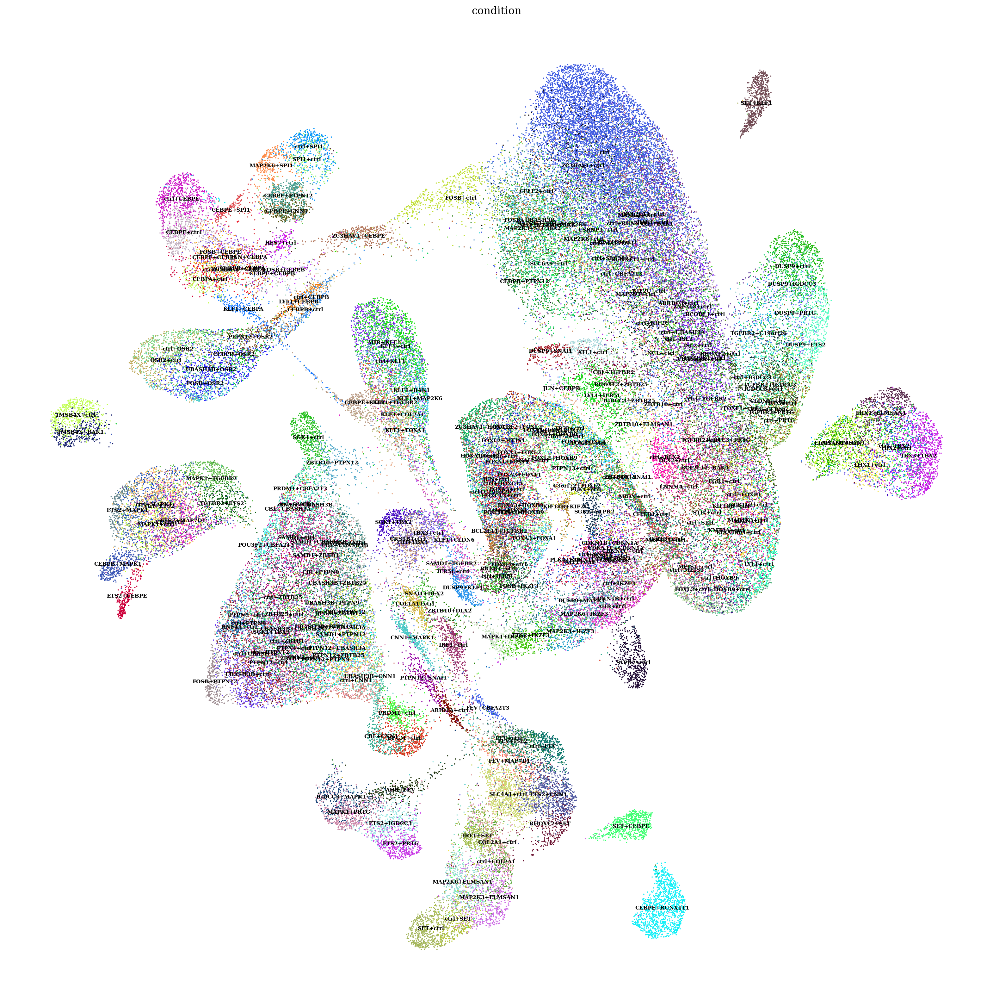

In [12]:
def generate_random_colors(num_colors):
    return ["#"+''.join([np.random.choice(list('0123456789ABCDEF')) for j in range(6)]) for i in range(num_colors)]
unique_cell_types = latent.obs["condition"].unique()
# Generate random colors for each unique cell type
random_colors = generate_random_colors(len(unique_cell_types))
# Create a dictionary to map cell types to colors
color_map = dict(zip(unique_cell_types, random_colors))

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    plt.figure(figsize=(20, 20))
    sc.pl.umap(
        latent, 
        color=["condition"], 
        ncols=1,
        size=8,
        frameon=False,
        palette=color_map,
        legend_loc="on data",
        legend_fontsize=6,
        legend_fontweight='bold',
        ax=plt.gca(),
    show=False
    )
plt.show()

In [13]:
sublatent = DM.configurations.unreserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
rsc.utils.anndata_to_GPU(latent)
rsc.pp.neighbors(latent)
rsc.tl.umap(latent)

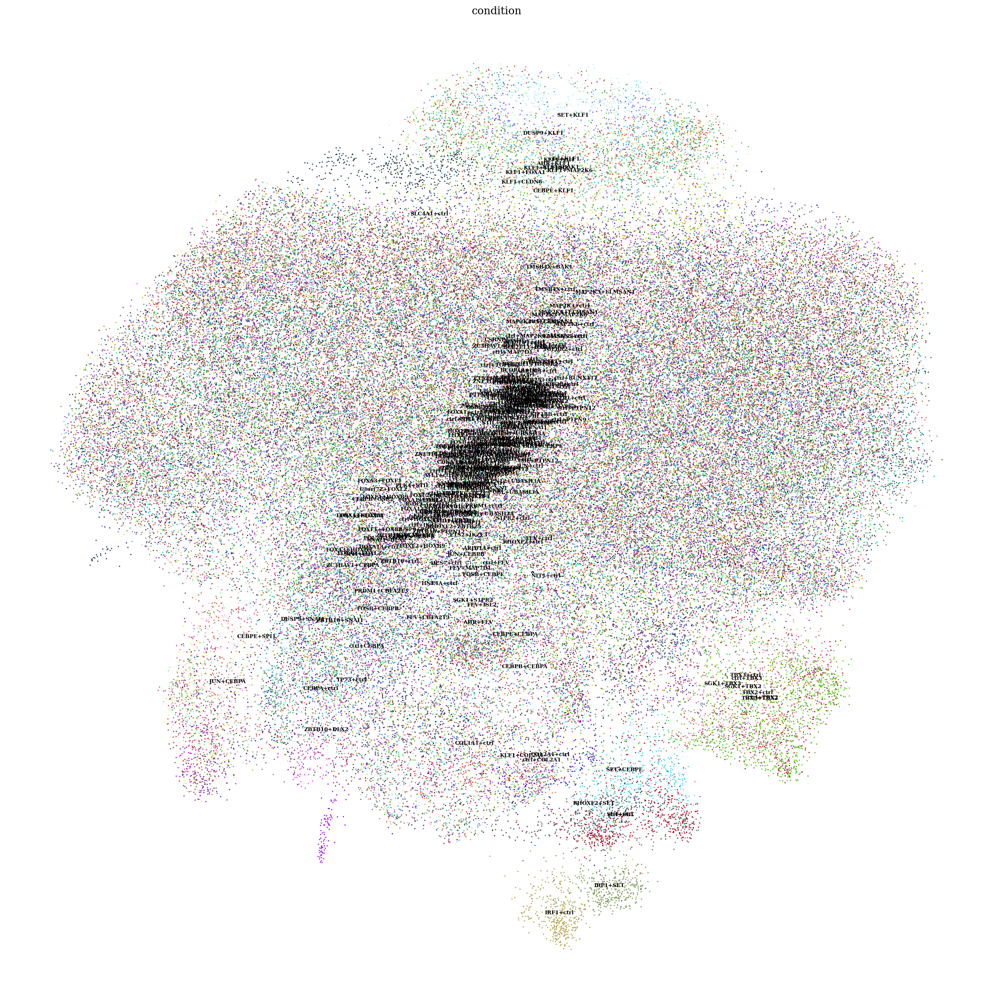

In [14]:
def generate_random_colors(num_colors):
    return ["#"+''.join([np.random.choice(list('0123456789ABCDEF')) for j in range(6)]) for i in range(num_colors)]
unique_cell_types = latent.obs["condition"].unique()
# Generate random colors for each unique cell type
random_colors = generate_random_colors(len(unique_cell_types))
# Create a dictionary to map cell types to colors
color_map = dict(zip(unique_cell_types, random_colors))

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    plt.figure(figsize=(20, 20))
    sc.pl.umap(
        latent, 
        color=["condition"], 
        ncols=1,
        size=8,
        frameon=False,
        palette=color_map,
        legend_loc="on data",
        legend_fontsize=6,
        legend_fontweight='bold',
        ax=plt.gca(),
    show=False
    )
plt.show()